In [167]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

In [2]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
df = pd.read_csv("audio_features_new.csv")
df.head()

,Unnamed: 0,sp_name,sp_artist,sp_url,year,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,0,Harlem Shake,Baauer,https://open.spotify.com/track/01XFgRZfZI7oBag...,2013,0.01110,https://api.spotify.com/v1/audio-analysis/01XF...,0.452,196664,0.794,01XFgRZfZI7oBagNf1Loml,0.001820,0,0.4160,-5.151,1,0.0483,137.825,4,https://api.spotify.com/v1/tracks/01XFgRZfZI7o...,audio_features,spotify:track:01XFgRZfZI7oBagNf1Loml,0.282
1,1,Just Give Me a Reason (feat. Nate Ruess),P!nk,https://open.spotify.com/track/1mKXFLRA179hdOW...,2013,0.34600,https://api.spotify.com/v1/audio-analysis/1mKX...,0.778,242733,0.547,1mKXFLRA179hdOWQBwUk9e,0.000302,2,0.1320,-7.273,1,0.0489,95.002,4,https://api.spotify.com/v1/tracks/1mKXFLRA179h...,audio_features,spotify:track:1mKXFLRA179hdOWQBwUk9e,0.441
2,2,Blurred Lines,Robin Thicke,https://open.spotify.com/track/0n4bITAu0Y0nigr...,2013,0.00334,https://api.spotify.com/v1/audio-analysis/0n4b...,0.853,263827,0.599,0n4bITAu0Y0nigrz3MFJMb,0.000008,7,0.0759,-4.756,1,0.0411,119.993,4,https://api.spotify.com/v1/tracks/0n4bITAu0Y0n...,audio_features,spotify:track:0n4bITAu0Y0nigrz3MFJMb,0.843
3,3,Royals,Lorde,https://open.spotify.com/track/2dLLR6qlu5UJ5gk...,2013,0.12100,https://api.spotify.com/v1/audio-analysis/2dLL...,0.674,190185,0.428,2dLLR6qlu5UJ5gk0dKz0h3,0.000000,7,0.1320,-9.504,1,0.1220,84.878,4,https://api.spotify.com/v1/tracks/2dLLR6qlu5UJ...,audio_features,spotify:track:2dLLR6qlu5UJ5gk0dKz0h3,0.337
4,4,Blurred Lines,Robin Thicke,https://open.spotify.com/track/0n4bITAu0Y0nigr...,2013,0.00334,https://api.spotify.com/v1/audio-analysis/0n4b...,0.853,263827,0.599,0n4bITAu0Y0nigrz3MFJMb,0.000008,7,0.0759,-4.756,1,0.0411,119.993,4,https://api.spotify.com/v1/tracks/0n4bITAu0Y0n...,audio_features,spotify:track:0n4bITAu0Y0nigrz3MFJMb,0.843


## Data Cloning

First, I will drop the columns that I won't need for the project.

In [3]:
df.columns

Index(['Unnamed: 0', 'sp_name', 'sp_artist', 'sp_url', 'year', 'acousticness',
       'analysis_url', 'danceability', 'duration_ms', 'energy', 'id',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'track_href', 'type', 'uri',
       'valence'],
      dtype='object')

In [4]:
#drop unnecessarry columns
df = df.drop(["Unnamed: 0", "sp_url", "analysis_url", "id", "track_href", "type", "uri"], axis=1)

In the year 2015, all the songs are the same songs. This is a problem. I will write the code for getting the data of 2015.

I got the data of top100 ranking of 2015 by using scrapy and store the ranking data into "ranking2015.csv". Then, I got the audio features data by writing code on "ranking2015.py" then stored the audio features data of 2015 into "audio_features2015.csv". Then, I will concatene this.

In [5]:
temp = pd.read_csv("audio_features2015.csv")
temp = temp.drop(["Unnamed: 0", "sp_url", "analysis_url", "id", "track_href", "type", "uri"], axis=1)
df = df.drop(df[df.year == 2015].index)#drop the 2015 year's data from df.
df = df.append(temp, ignore_index=True, sort=False)#append new dataframe into df.

Also, in the year 1959, all the songs are the same songs. This is a problem. I will write the code for getting the data of 1959.

I got the data of top100 ranking of 2015 by using scrapy and store the ranking data into "ranking1959.csv". Then, I got the audio features data by writing code on "ranking1959.py" then stored the audio features data of 1959 into "audio_features1959.csv". Then, I will concatene this.

In [6]:
temp2 = pd.read_csv("audio_features1959.csv")
temp2 = temp2.drop(["Unnamed: 0", "sp_url", "analysis_url", "id", "track_href", "type", "uri"], axis=1)
df = df.append(temp2, ignore_index=True, sort=False)#append new dataframe into df.

Second, I am going to check if there is any missing values or not.

In [7]:
df.isnull().sum() #checking if missing values

sp_name             0
sp_artist           0
year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
dtype: int64

## Document
Then, I will explain what each column means.

In [8]:
print(df.columns)
df.mean()

Index(['sp_name', 'sp_artist', 'year', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'mode', 'speechiness', 'tempo', 'time_signature',
       'valence'],
      dtype='object')


year                  1987.883330
acousticness             0.281921
danceability             0.621621
duration_ms         227641.523246
energy                   0.613212
instrumentalness         0.030656
key                      5.256673
liveness                 0.178265
loudness                -8.538619
mode                     0.707972
speechiness              0.070482
tempo                  119.762142
time_signature           3.951211
valence                  0.609477
dtype: float64

**sp_name** -> Song's name<br>
**sp_artist** -> Artist's name<br>
**year** -> year<br>
**acousticness** -> how acoustic<br>
**danceability** -> how suitable for dancing based on a combination of tempo,rythm stability,beat strength and overall regularity.<br>
**duration_ms** -> the duration of the track in milliseconds.<br>
**energy** -> Measure of intensity and activity. Energetic tracks feel fast,loud and noisy.<br>
**instrumentalness** -> whether contains vocal or not. Rap or spoken word tracks are "vocal".<br>
**key** -> The estimated overall key of the track. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.<br>
**liveness** -> Detect the presence of an audience in the recording. A value above 0.8 provides strong likelihood that the track is live.<br>
**loudness** -> The overall loundness of a track in decibels(dB). Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Typically range from -60 to 0db.<br>
**mode** -> Modality(major or minor) of a track. Major=1, Minor=0.<br>
**speechiness** -> The presence of spoken words.The more speech-like tracks(e.g. talk show, audio book, poetry), the closer to 1.0. Values below 0.33 most likely represent music and other non-speech-like tracks.<br>
**tempo** -> The tempo of a track in beats per minuite(BPM). <br>
**time_signature** -> how many beats are in each bar.<br>
**valence** -> The musical positiveness. High valence means more positive(happy,cheerful,euphoric), while low means more negative(sad,depressed,angry).<br>


In [9]:
df.groupby("year").describe()

acousticness                                                            \
            count      mean       std       min       25%      50%      75%   
year                                                                          
1956         79.0  0.761975  0.192210  0.139000  0.675000  0.81200  0.91100   
1957         83.0  0.714293  0.180660  0.015300  0.626500  0.76300  0.84550   
1958         80.0  0.659418  0.242233  0.038000  0.517750  0.73500  0.83875   
1959         88.0  0.678790  0.238755  0.006120  0.586750  0.74550  0.86325   
1960         90.0  0.644256  0.213126  0.182000  0.472750  0.71350  0.80725   
1961         90.0  0.638337  0.241394  0.004940  0.501750  0.68950  0.82100   
1962         88.0  0.602842  0.242557  0.015300  0.434000  0.65450  0.79425   
1963         89.0  0.577137  0.236449  0.021900  0.452000  0.65100  0.75500   
1964         89.0  0.512132  0.269716  0.000385  0.270000  0.55700  0.73400   
1965         91.0  0.442047  0.258005  0.018200  0.225500  0.40100  0.67100   
1966         94.0  0.393159  0.290224  0.000259  0.124000  0.35100  0.67725   
1967         87.0  0.376808  0.255058  0.000627  0.160500  0.35700  0.55850   
1968         91.0  0.413360  0.269283  0.003790  0.164000  0.43200  0.64800   
1969         88.0  0.336752  0.232458  0.006320  0.144250  0.31350  0.49325   
1970         81.0  0.356095  0.229863  0.000899  0.141000  0.35500  0.52200   
1971         82.0  0.383407  0.264223  0.021700  0.199750  0.30450  0.55550   
1972         87.0  0.439234  0.241220  0.033300  0.244000  0.43400  0.61700   
1973         86.0  0.352421  0.266219  0.003510  0.095000  0.31250  0.55700   
1974         88.0  0.392880  0.287483  0.000835  0.128500  0.36950  0.65175   
1975         84.0  0.351592  0.250763  0.000113  0.136750  0.32600  0.54025   
1976         87.0  0.305765  0.241563  0.001210  0.080200  0.26800  0.46700   
1977         89.0  0.341719  0.279864  0.001610  0.081600  0.32300  0.57400   
1978         89.0  0.278888  0.248005  0.001130  0.084200  0.20500  0.40500   
1979         91.0  0.230641  0.227820  0.000702  0.042900  0.13300  0.38100   
1980         87.0  0.304875  0.241027  0.000427  0.112000  0.26200  0.42400   
1981         89.0  0.295842  0.243174  0.000252  0.095800  0.21100  0.46700   
1982         91.0  0.266865  0.235945  0.000418  0.073600  0.19200  0.39350   
1983         89.0  0.202858  0.208177  0.000343  0.043300  0.11900  0.28300   
1984         92.0  0.157514  0.164672  0.000183  0.030925  0.10700  0.21925   
1985         89.0  0.217073  0.202176  0.004360  0.039100  0.16500  0.33800   
1986         94.0  0.210583  0.208547  0.000557  0.046525  0.13100  0.31950   
1987         85.0  0.181410  0.207158  0.000202  0.029100  0.12000  0.21600   
1988         83.0  0.182121  0.179935  0.000212  0.034700  0.09650  0.29150   
1989         81.0  0.189244  0.217115  0.000507  0.013700  0.08730  0.30600   
1990         86.0  0.152800  0.184934  0.000407  0.026275  0.07685  0.20025   
1991         83.0  0.178140  0.210868  0.000204  0.018300  0.08620  0.23400   
1992         88.0  0.173440  0.220353  0.000025  0.018625  0.07550  0.26350   
1993         86.0  0.164461  0.217273  0.000179  0.014650  0.07810  0.21375   
1994         86.0  0.200240  0.220876  0.000136  0.037025  0.09565  0.29400   
1995         81.0  0.191895  0.217410  0.000049  0.017900  0.10100  0.30800   
1996         82.0  0.235339  0.217055  0.000081  0.040025  0.18500  0.39600   
1997         83.0  0.226482  0.248395  0.000016  0.032300  0.10600  0.37550   
1998         88.0  0.214184  0.235481  0.001180  0.033500  0.11650  0.31675   
1999         94.0  0.184344  0.188191  0.000092  0.039350  0.12250  0.24350   
2000         91.0  0.152947  0.166348  0.000051  0.021550  0.06980  0.25950   
2001         79.0  0.146626  0.164104  0.000144  0.016400  0.08390  0.24100   
2002         86.0  0.146428  0.151218  0.000068  0.029975  0.08555  0.23275   
2003         87.0  0.192148  0.200874  0.000172  0.0310

## The mean and boxplot of each value
I will plot the mean and boxplot of each year, and then try to find something interesting from them.

In [27]:
dfbp = df_columns
dfbp.append("year")

**acousticness**

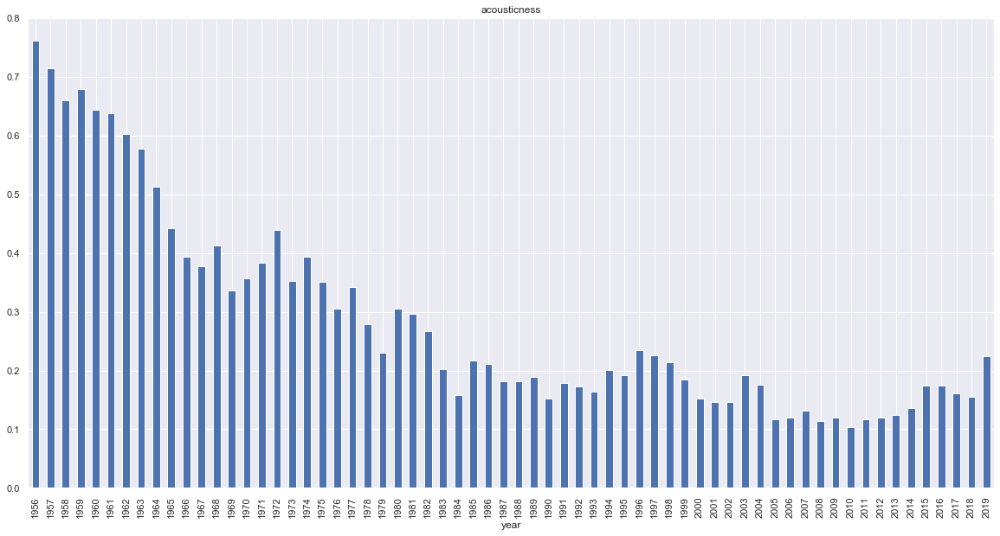

In [10]:
sb.set()#improve the quality of graph's appearance.
df.groupby("year")["acousticness"].mean().plot.bar(figsize=(20,10), title="acousticness")

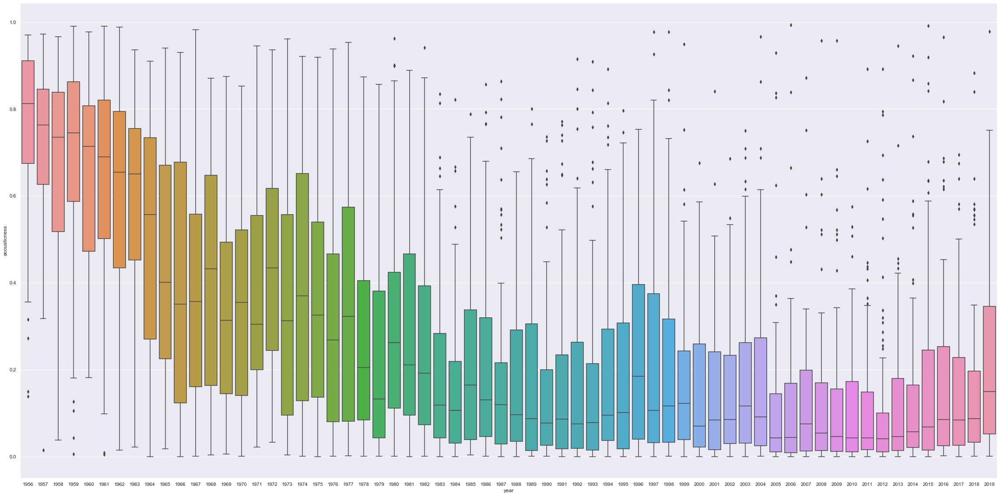

In [62]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].acousticness)

Obviously from histgram, the acousticness is getting low as time year paaes. This is understandable because in old times, most songs are played with the guitar while recently there is a variety of the way to make and play the songs due to the technology development. 

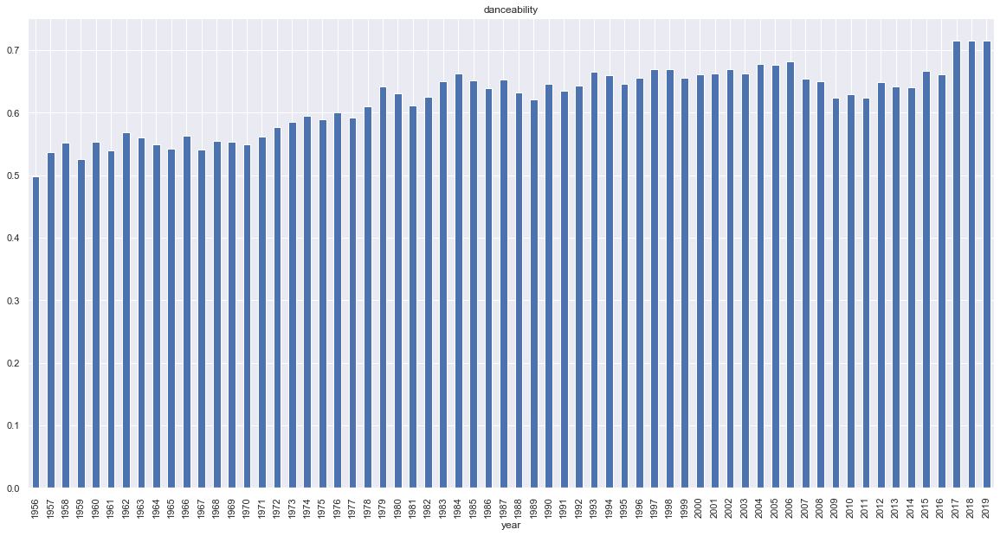

In [11]:
df.groupby("year").danceability.mean().plot.bar(figsize=(20,10),title="danceability")

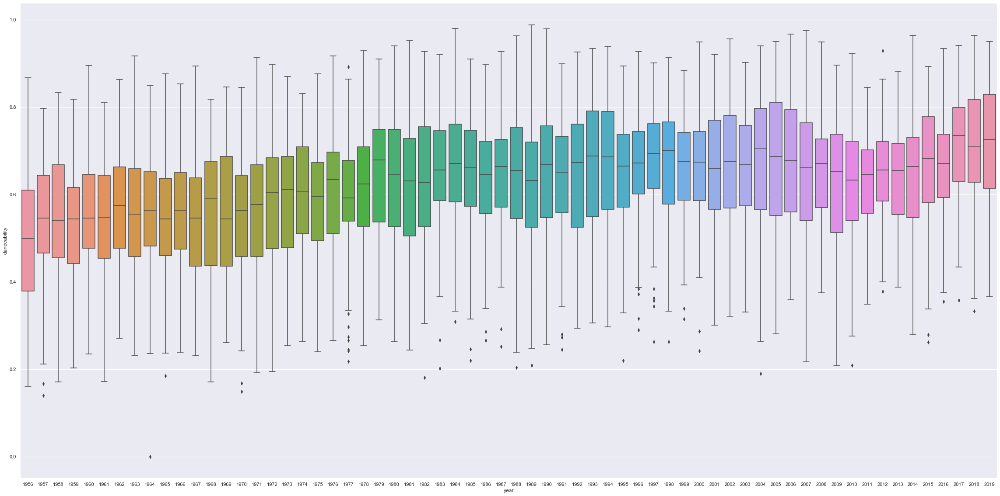

In [49]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].danceability)

From both of the graphs, you can tell the danceability is going up and getting popular year by year. Howeverm, that is true that there is stil many songs which are not for dance but getting popularity.

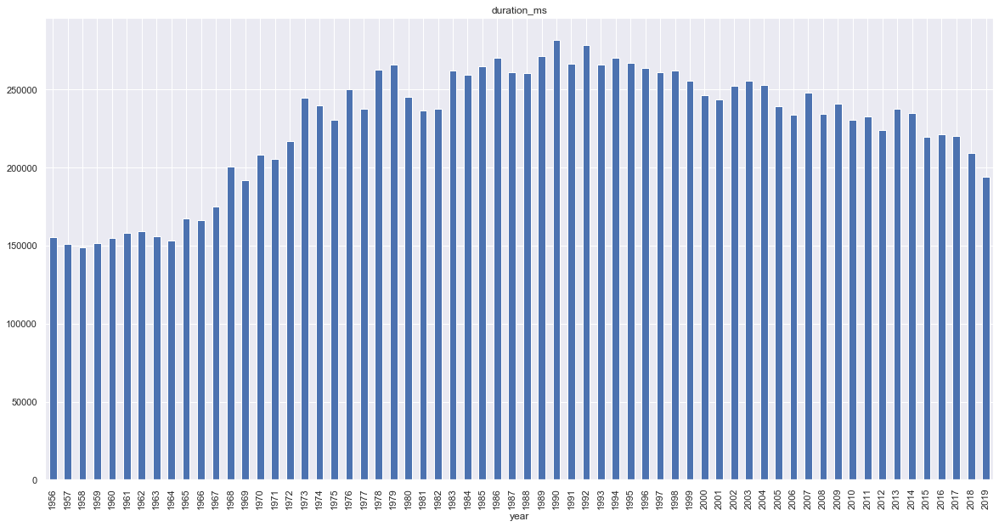

In [12]:
df.groupby("year").duration_ms.mean().plot.bar(figsize=(20,10),title="duration_ms")

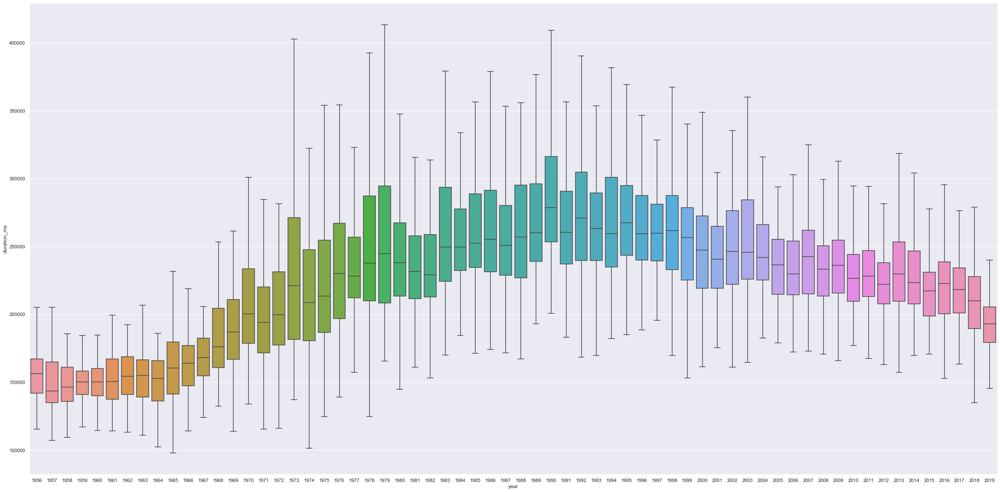

In [77]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].duration_ms, showfliers=False)

This is interesting that the duration was going up until around 1990, but then it is getting low until now. 

In [72]:
print("1990:", df[df.year == 1990].duration_ms.mean())
print("2019:", df[df.year == 2019].duration_ms.mean())

1990: 282011.0
2019: 194189.8556701031


As you can see above, comparing the mean of 1990 with the counterpart of 2019, the duration is different by around 1 minute. This is really interesting, then I will get into this more later by comparing with the atmosphere of the songs and so on.

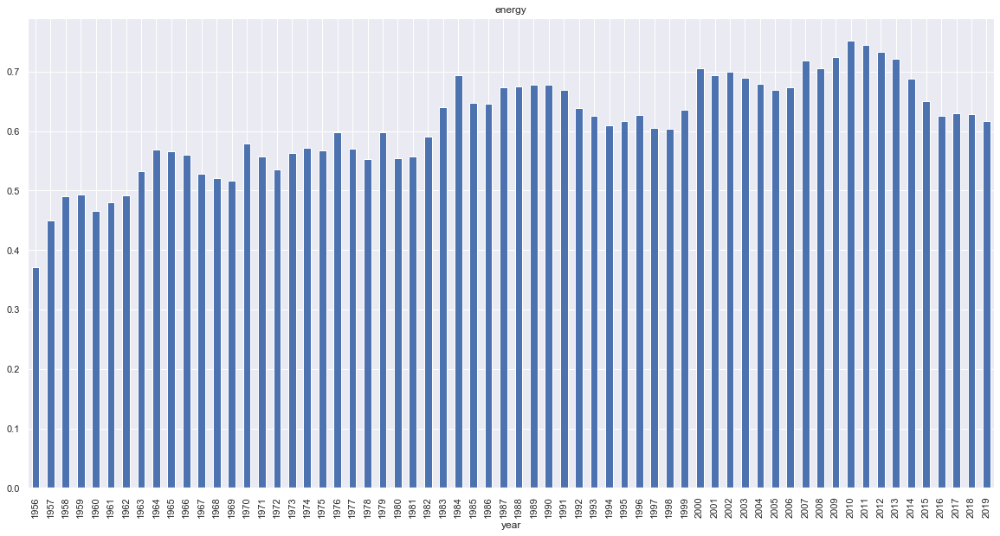

In [13]:
df.groupby("year").energy.mean().plot.bar(figsize=(20,10),title="energy")

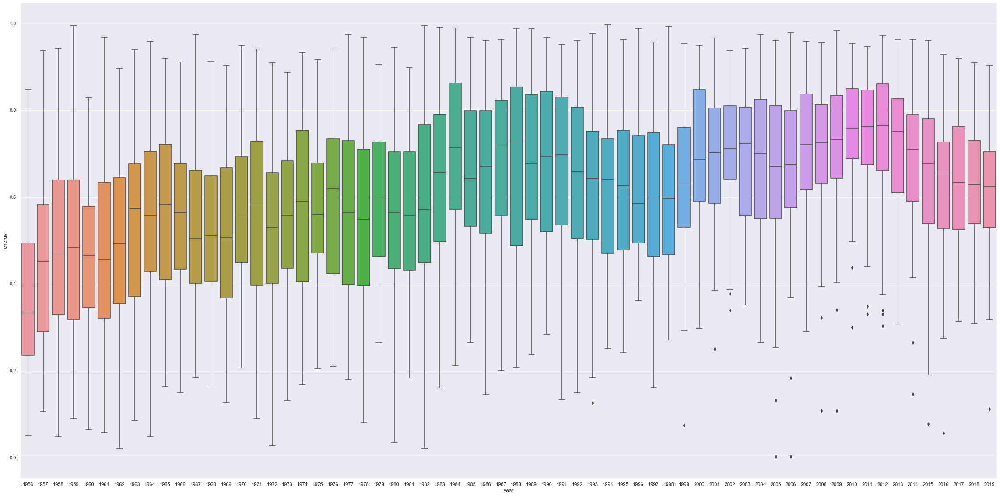

In [51]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].energy)

The energy is going up until around 2010, but then starts decreasing from then to now. But still that has some possibilities that going up again because it's fructuating a little as a whole.

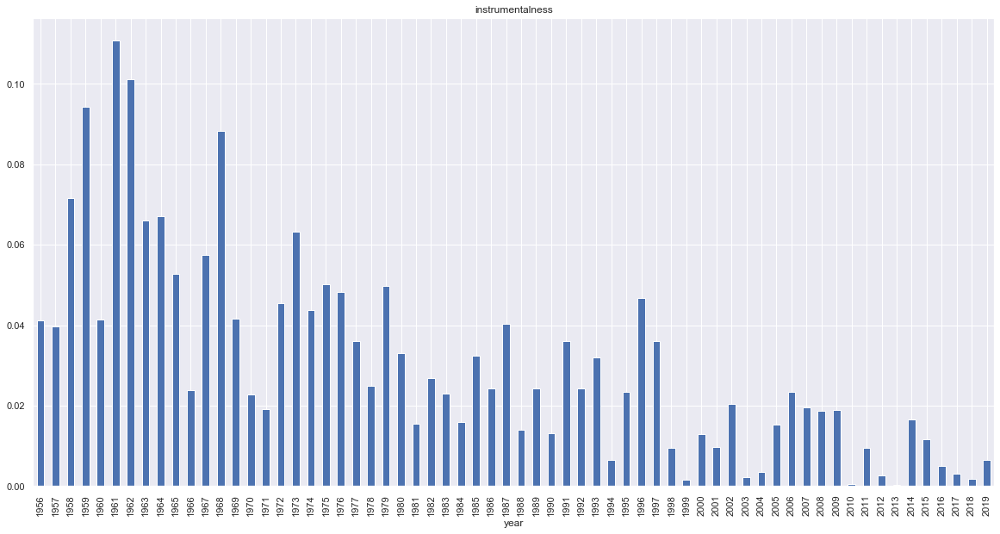

In [14]:
df.groupby("year").instrumentalness.mean().plot.bar(figsize=(20,10),title="instrumentalness")

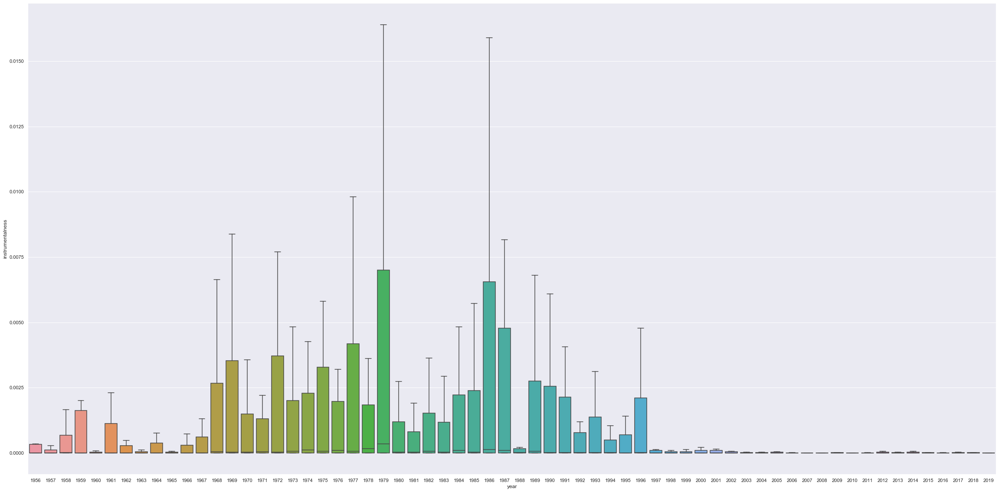

In [76]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].instrumentalness, showfliers=False)

You can say it is getting low(which means vocal), but the width is pretty narrow, so we can say there is not much difference between each year.But at least the reason why this happens is probably because the rap songs is going out into the world recently.

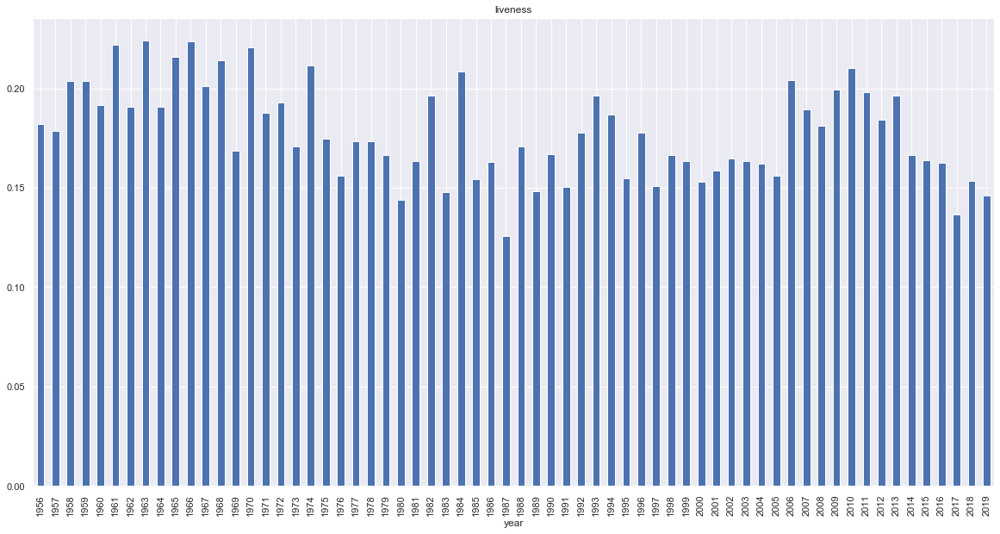

In [15]:
df.groupby("year").liveness.mean().plot.bar(figsize=(20,10),title="liveness")

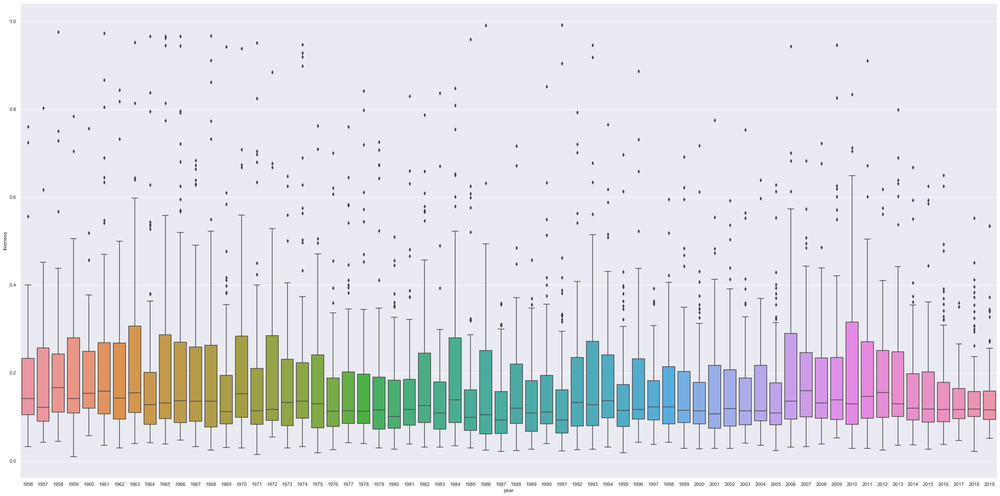

In [54]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].liveness)

The liveness is punctuating through all the years. 

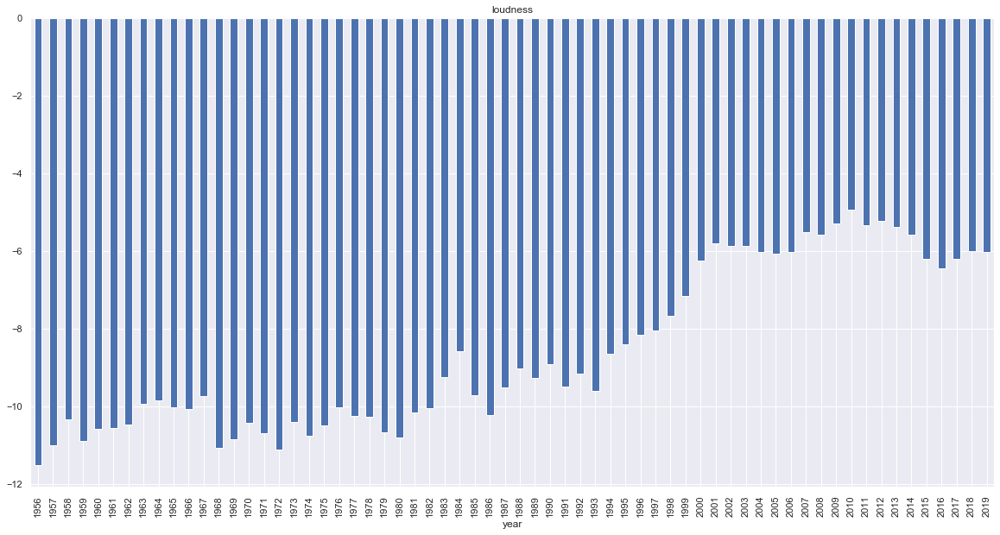

In [16]:
df.groupby("year").loudness.mean().plot.bar(figsize=(20,10),title="loudness")

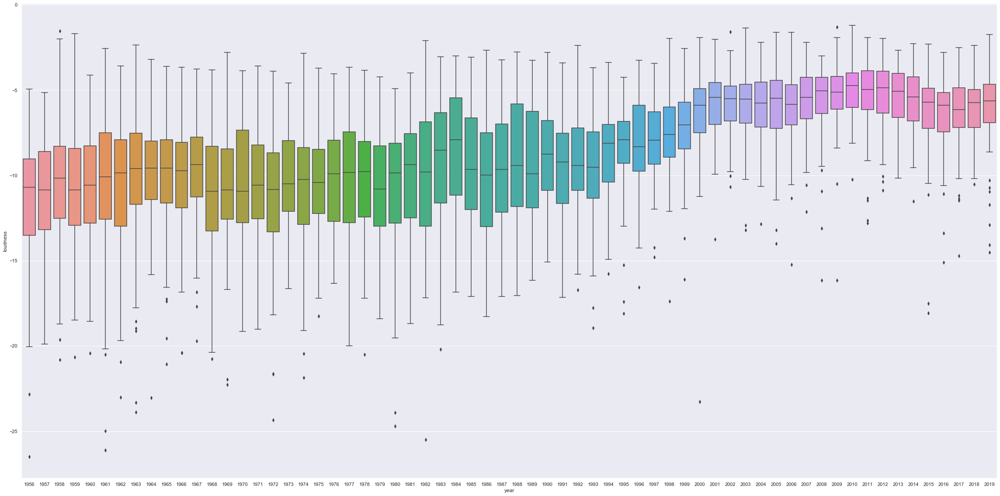

In [55]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].loudness)

The loudness is getting higer and higer year by year. In addition, the range of the loudness(dB) is getting narrow. These mean that there is not much difference about the loudness between each song as year passes. This might be related with the energy,valence and so on.

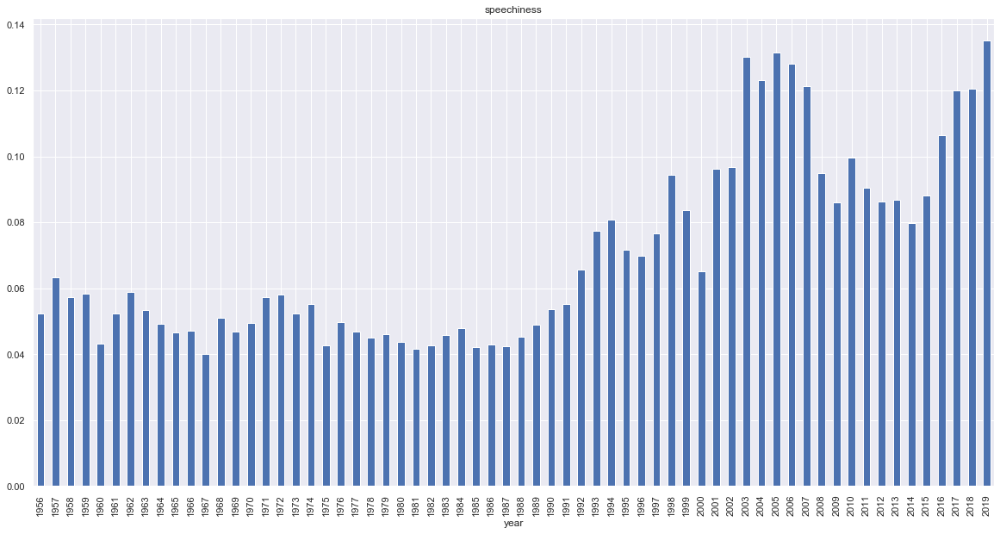

In [17]:
df.groupby("year").speechiness.mean().plot.bar(figsize=(20,10),title="speechiness")

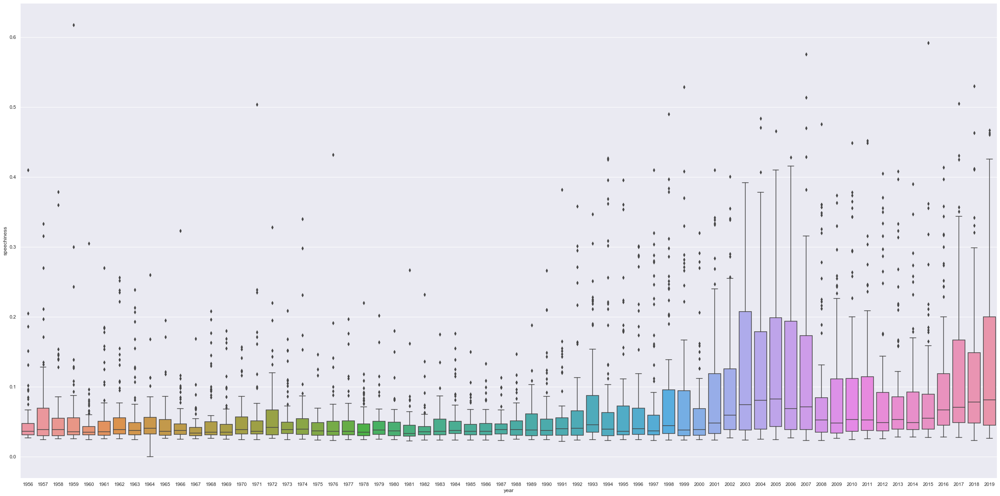

In [56]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].speechiness)

The reason why the speechiness is getting higher and higher is maybe because of the impact of rap.

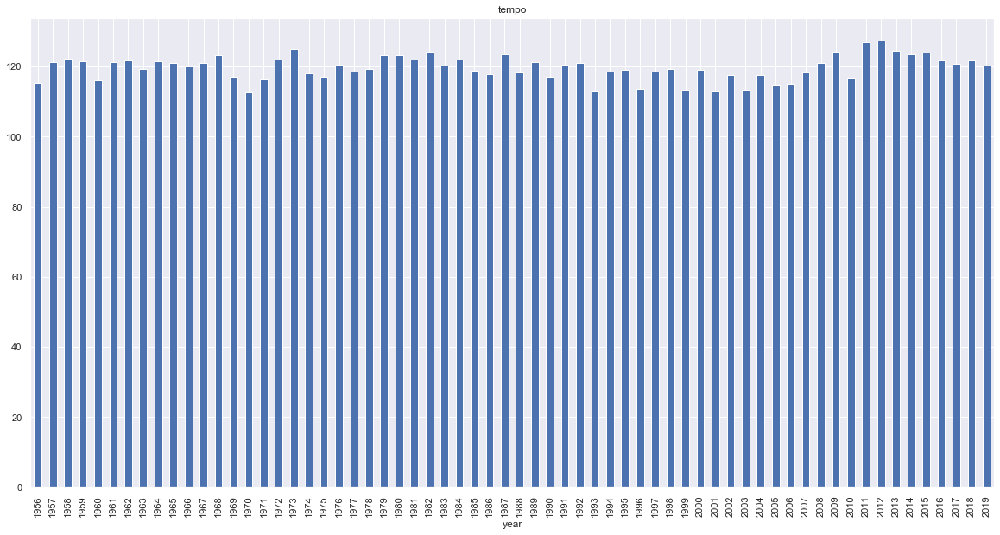

In [18]:
df.groupby("year").tempo.mean().plot.bar(figsize=(20,10),title="tempo")

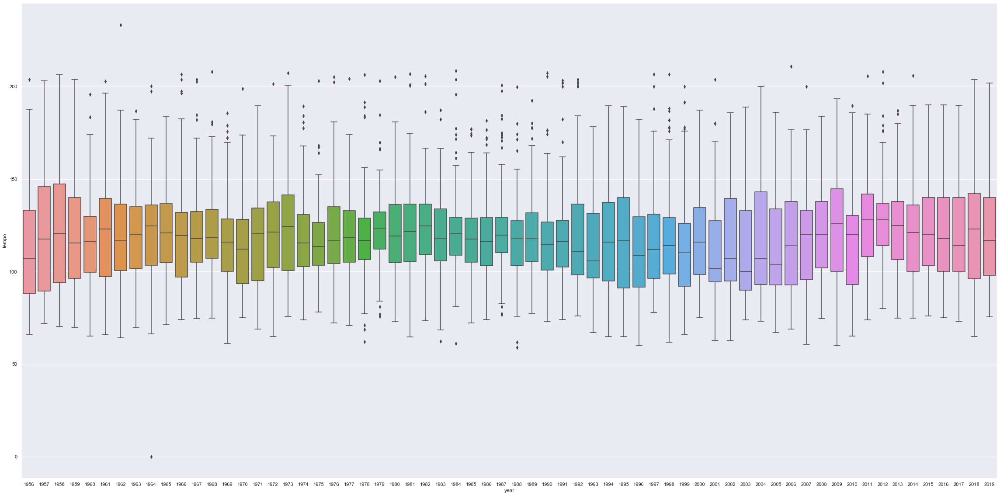

In [57]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].tempo)

There is almost no big difference between each year. If I had to say, the range of the tempo is the most narrow in the around latter half of 1980.

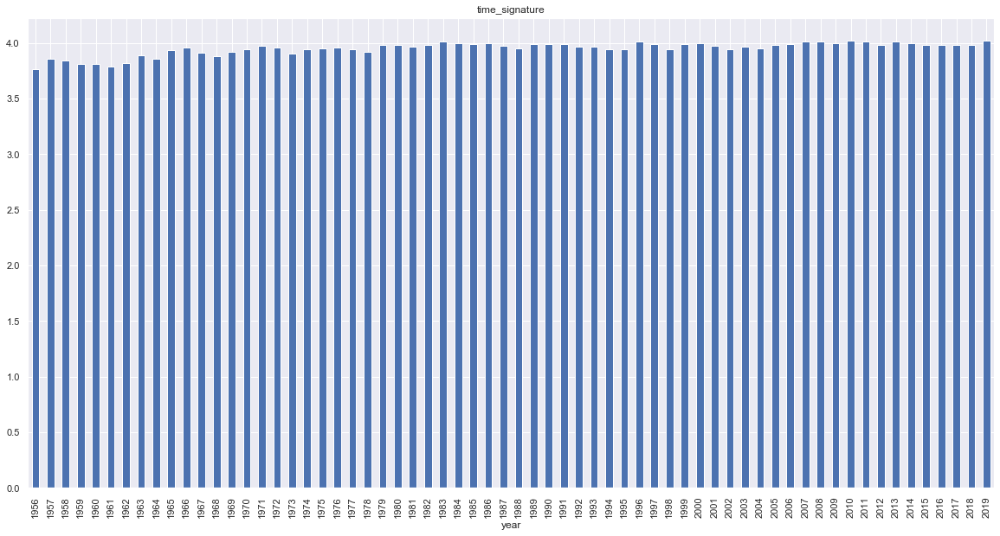

In [19]:
df.groupby("year").time_signature.mean().plot.bar(figsize=(20,10),title="time_signature")

As you can see, most of the songs are made with 4 beats(time_signature).

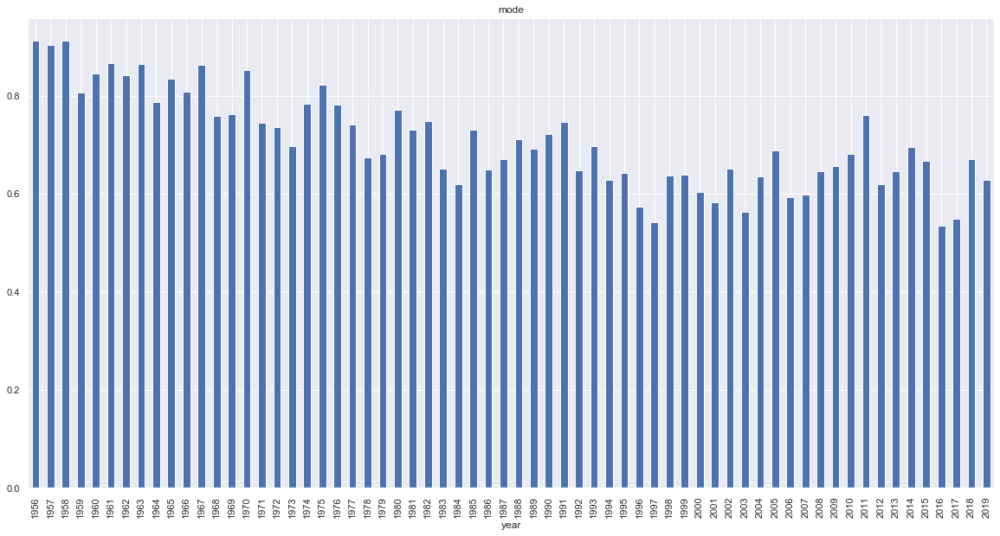

In [20]:
df.groupby("year").mode.mean().plot.bar(figsize=(20,10),title="mode")

Major=1, minor=0. As you can see the most of the popular songs are made by major chord. However, the percentage of minor is getting higher year by year, compared to the past time.

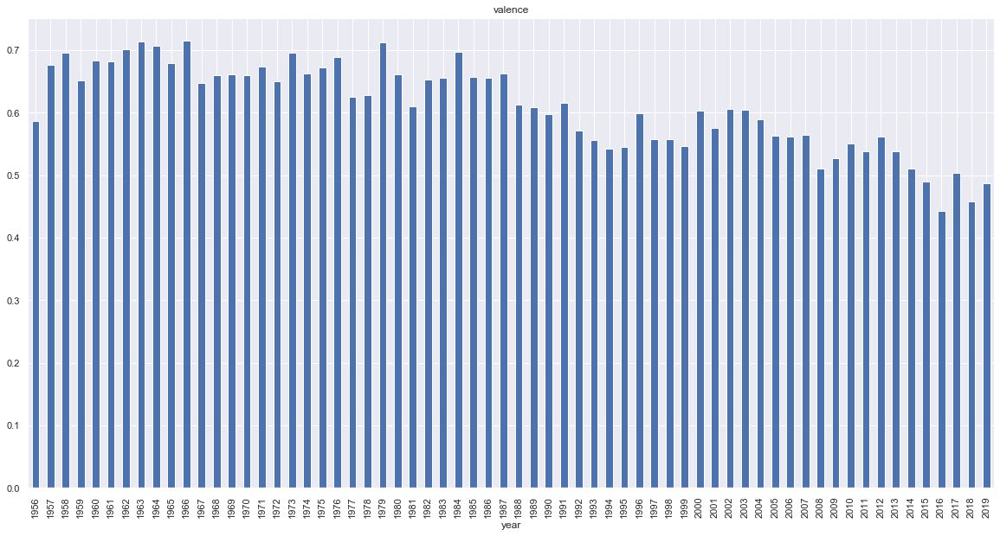

In [21]:
df.groupby("year").valence.mean().plot.bar(figsize=(20,10),title="valence")

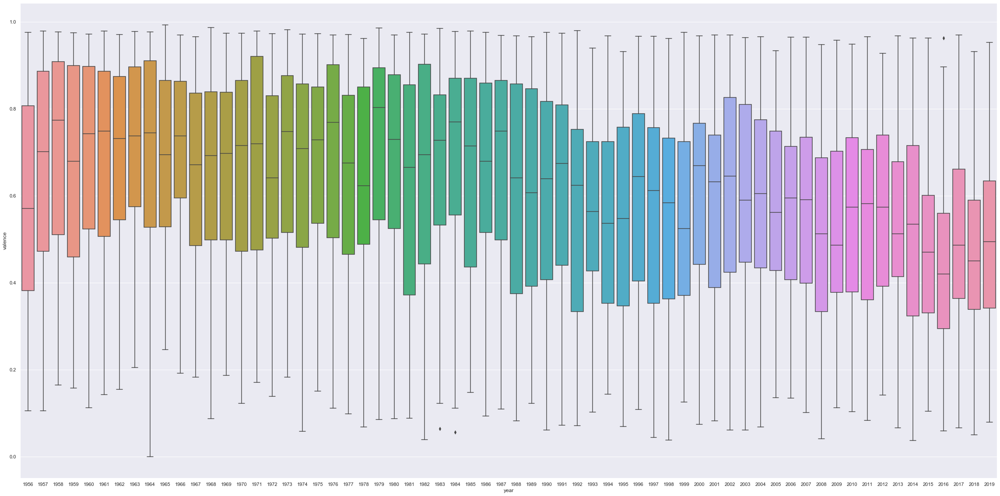

In [59]:
plt.figure(figsize=(40,20))
sb.boxplot(x=df.year, y=df[dfbp].valence)

The valence is getting lower slightly year by year.

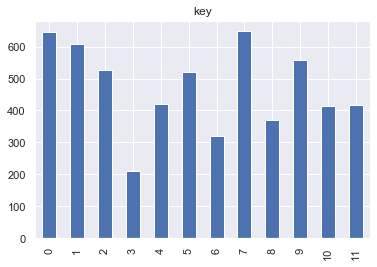

In [88]:
df.key.value_counts().sort_index().plot.bar(title="key")

Most used key is C Major(0), next is G Major(7), next is C minor.

## Histgram of "5_years" and "10_years"
Then, I will see the skewed graph of "5_years" and "10_years"

***Create the "5_years" and "10_years"***<br>
Firstly, let's create the subbins by dividing years into 5 years chunk.
Then, 10 years.

In [22]:
#df["5_years"]
labels5 = []
bins5=[]
for i in range(13):
    #create the labels
    start = 1956+5*i
    end = 1956+5*(i+1)-1
    s = str(start) + "-" + str(end)
    labels5.append(s)
    
    #create the bins
    bins5.append(1956+(i*5))
    
labels5[-1] = "2016-2019"
bins5.append(2020)
df["5_years"] = pd.cut(df["year"], bins=bins5, labels=labels5, right=False)

#df["10_years"]
labels10 = ["-1959"]
bins10=[1956]
for i in range(6):
    #create the labels
    start = 1960+10*i
    end = 1960+10*(i+1)-1
    s = str(start) + "-" + str(end)
    labels10.append(s)
    
    #create the bins
    bins10.append(1960+(i*10))
    
bins10.append(2020)
df["10_years"] = pd.cut(df["year"], bins=bins10, labels=labels10, right=False)

In [23]:
#make the list of columns that I will seek to.
df_columns = list(df.columns.values)
df_columns.remove("sp_name")
df_columns.remove("sp_artist")
df_columns.remove("year")
df_columns.remove("key")
df_columns.remove("mode")
df_columns.remove("5_years")
df_columns.remove("10_years")

***Plot the histgram***

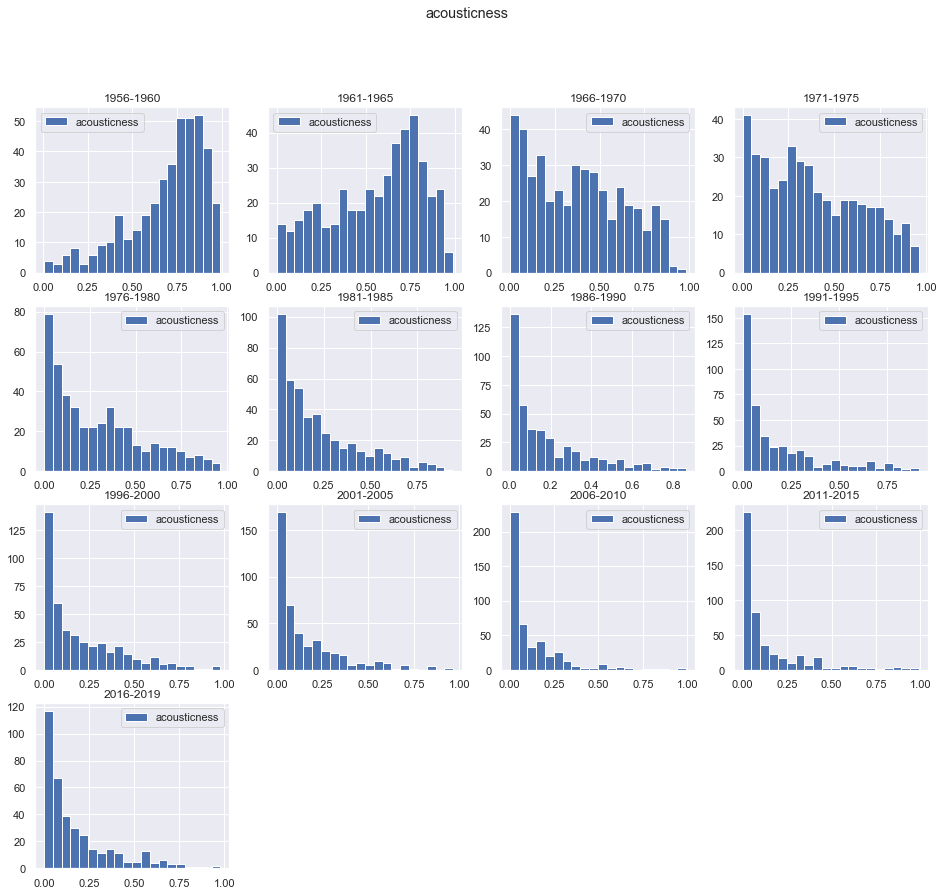

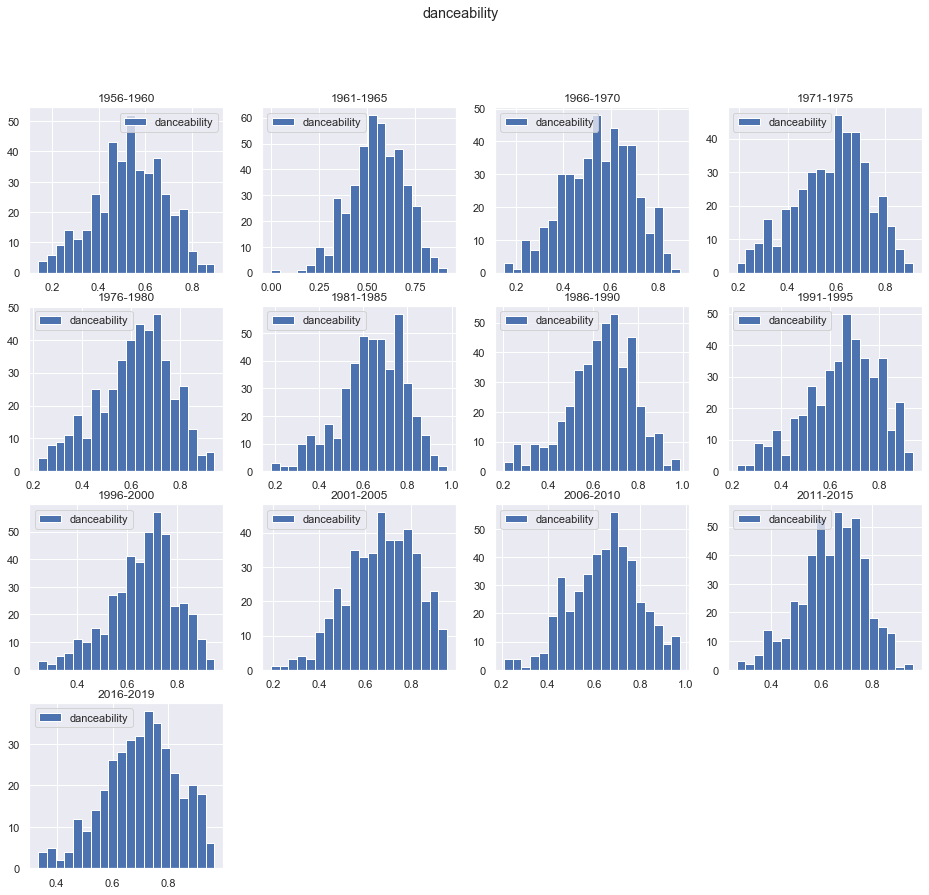

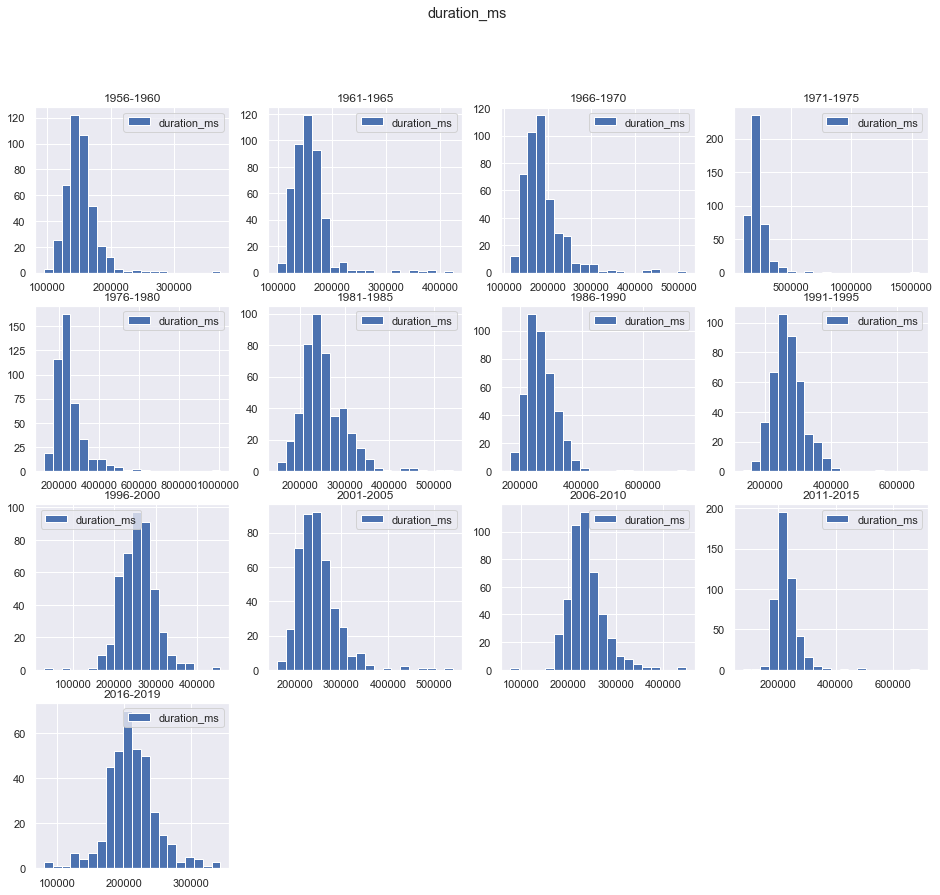

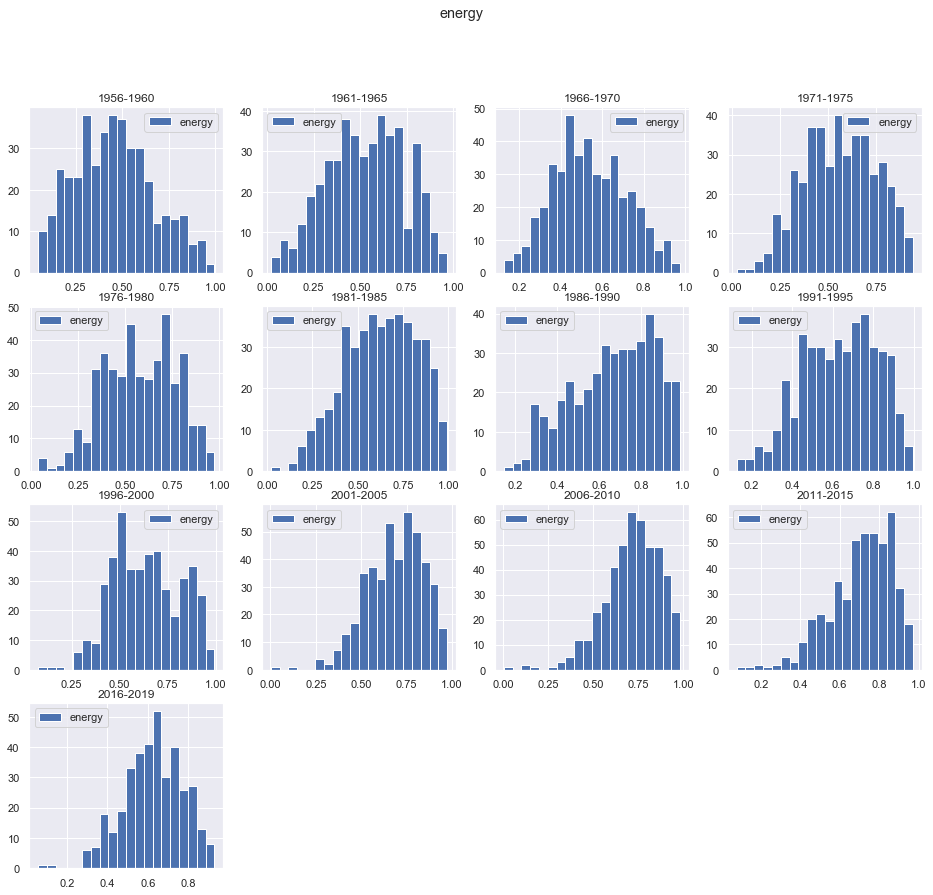

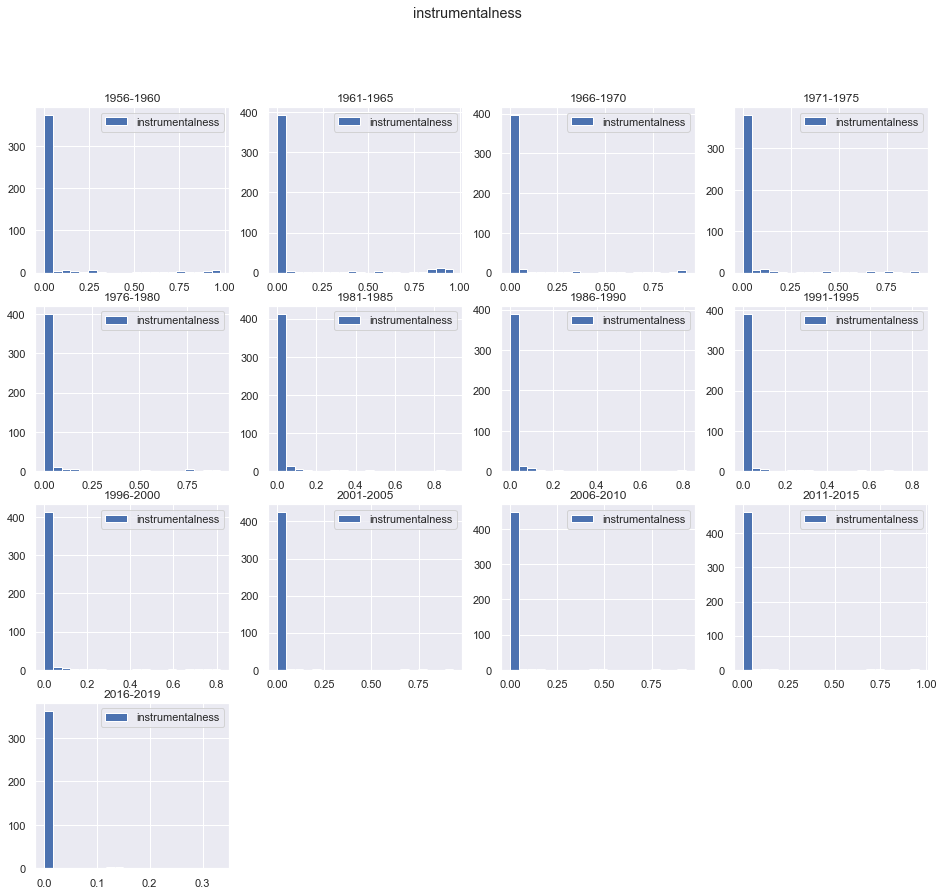

...

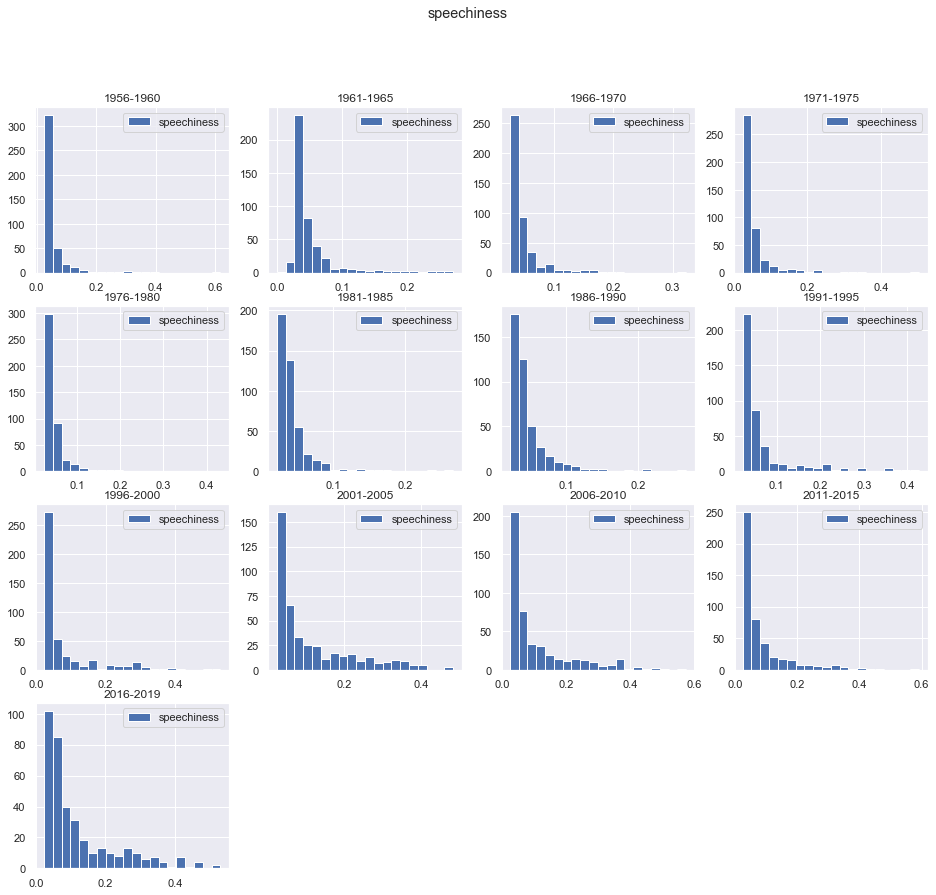

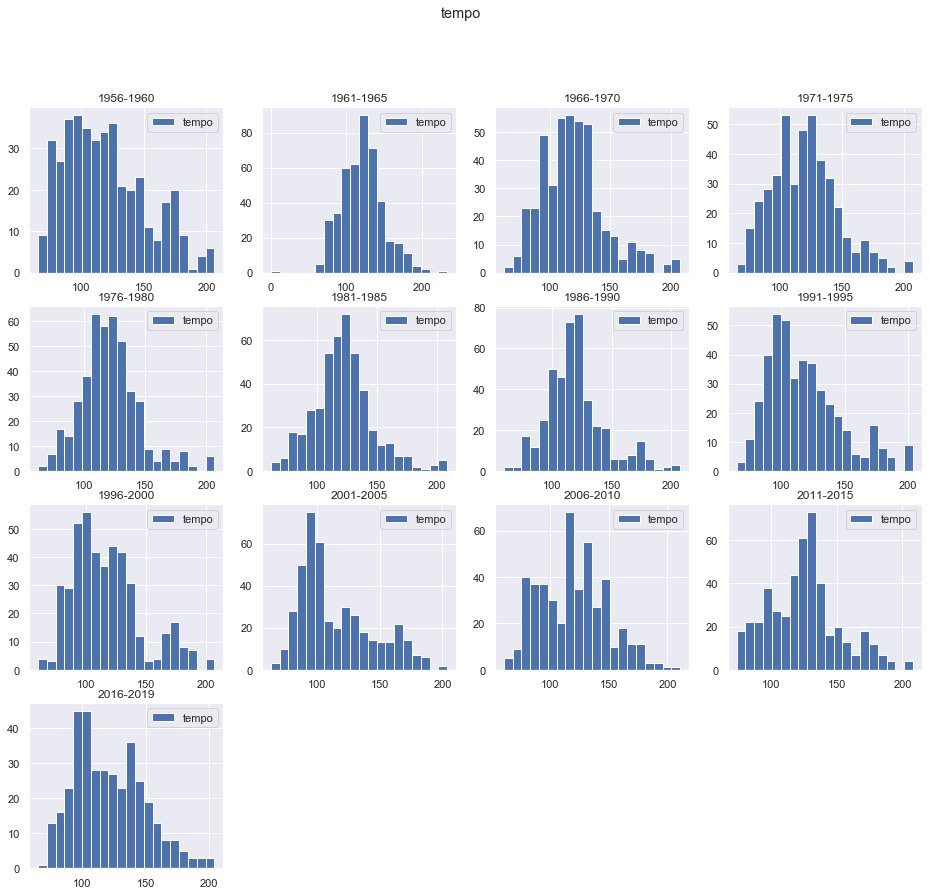

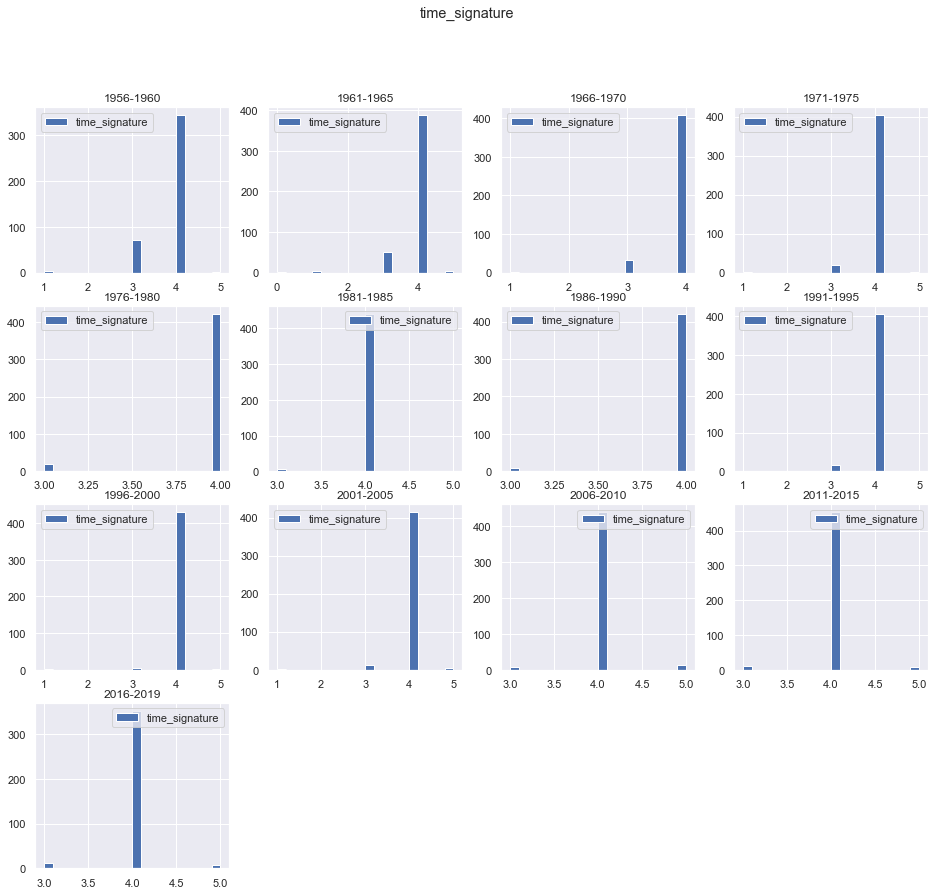

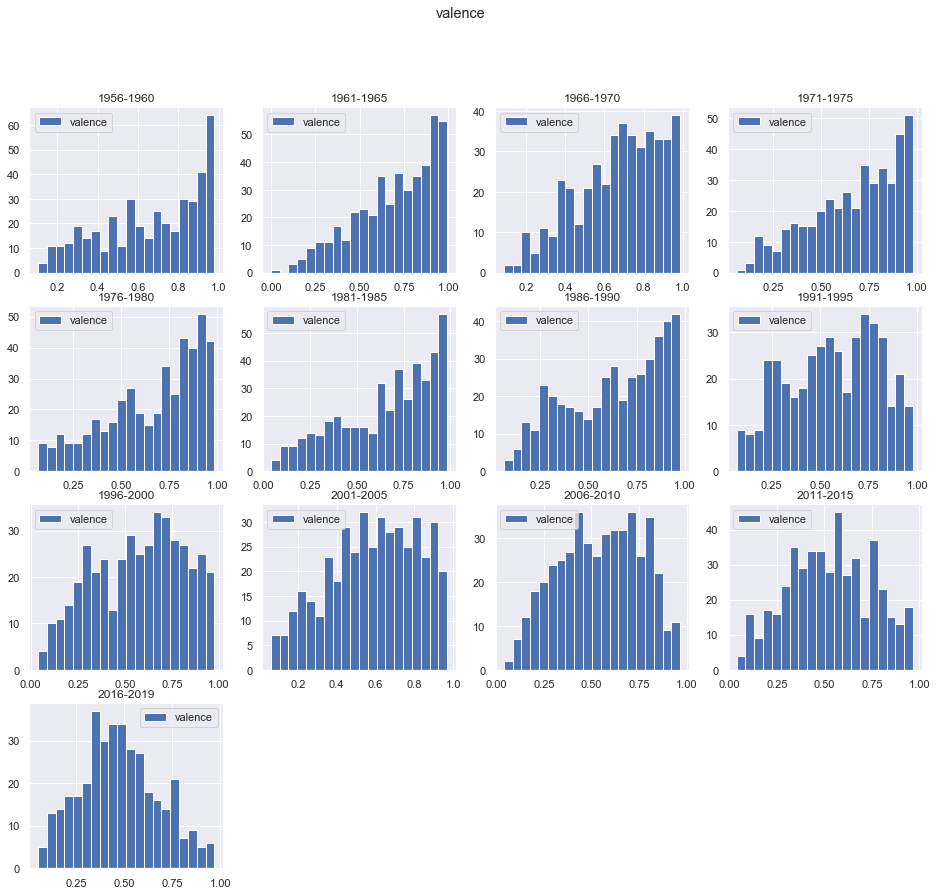

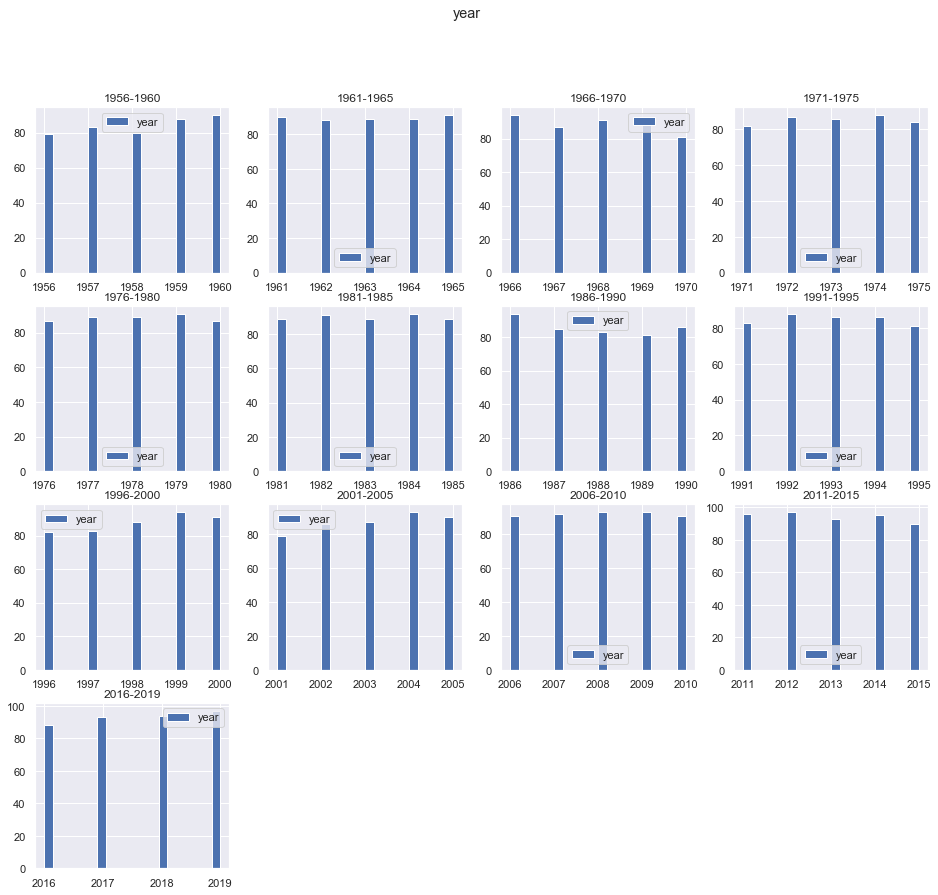

In [89]:
df5 = df.groupby("5_years")

#make the plot. 1.set the figure 2.attach the axes 3.plot the graph to those axes.

for i in df_columns:
    fig=plt.figure(figsize=(16,14)) #1. set the figure size
    axs=[] #list of axes
    c=1 #counts
    for j in labels5:
        axs.append(fig.add_subplot(4,4,c)) #2
        axs[c-1].hist(df5.get_group(j)[i], label=i, bins=20)
        axs[c-1].legend()
        axs[c-1].set_title(j)
        c=c+1
        
    fig.suptitle(i)
    plt.show() #3

"acousticness" is in the begging left-skewed, but turned to be the right-skewed as years go by.<br>
"danceability" is right-skewed in most of the time.<br>
"duration_ms" is left-skewed mostly, but 2016-2019 is centered.<br>
"energy" is mostly right-skewed.<br>
"instrumentalness" is too left-skewed.<br>
"liveness" is highly left-skewed.<br>
"loudness" is mostly right-skewed.<br>
"speechiness" is hight left-skewed.<br>
"tempo" is a little bit left-skewed.<br>
"valence" is not skewed.<br>

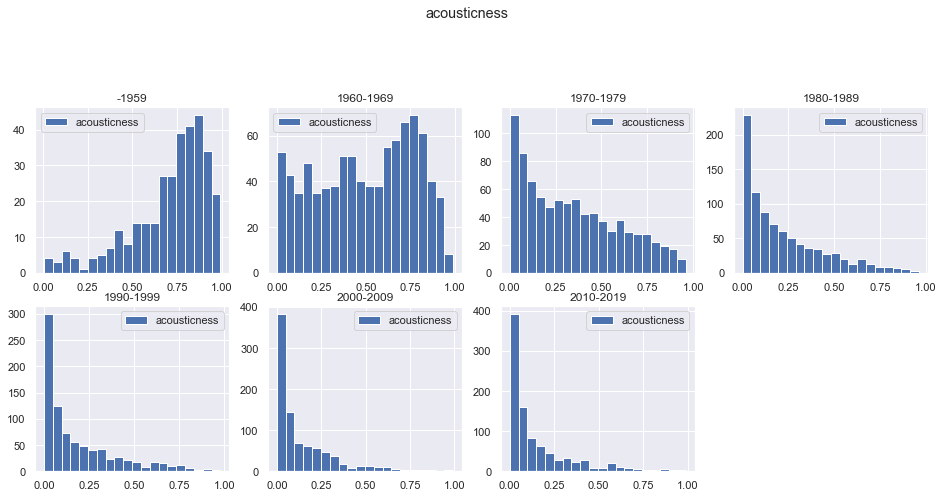

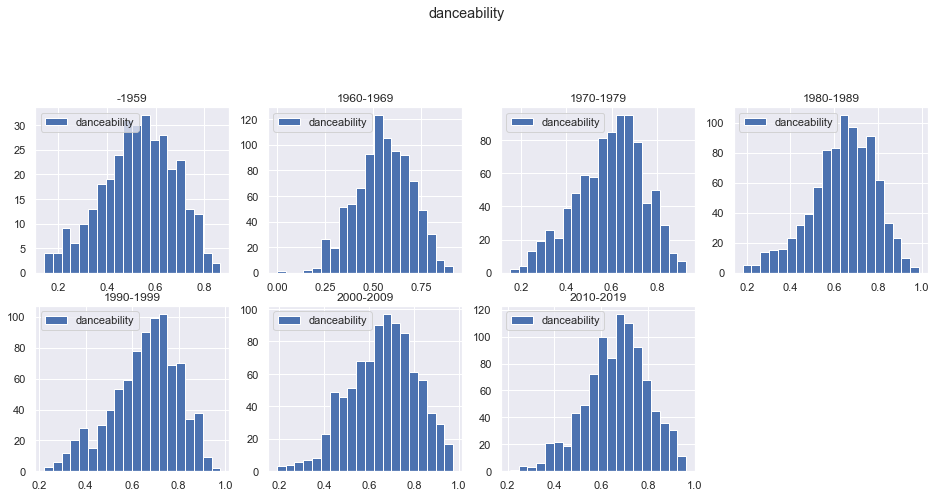

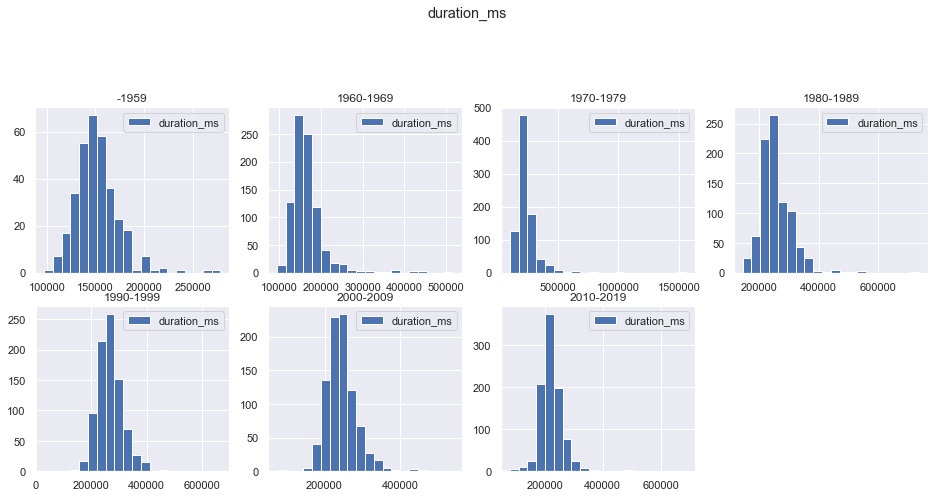

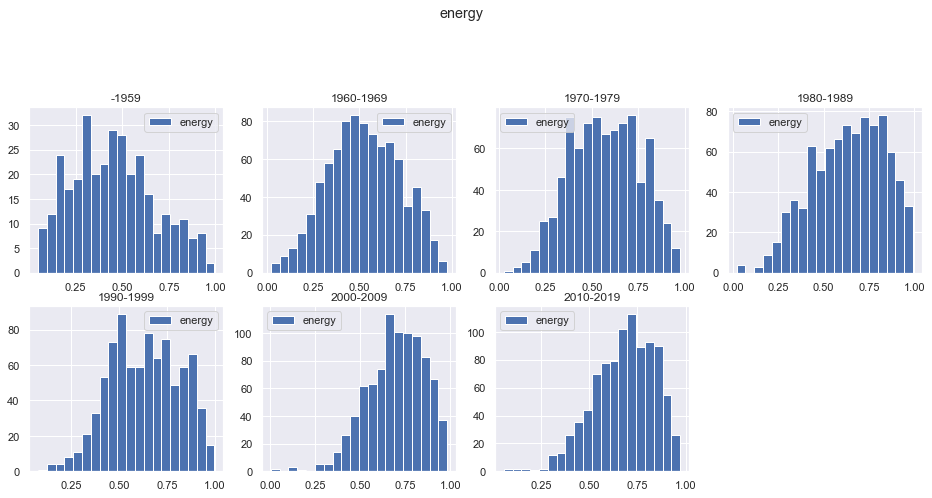

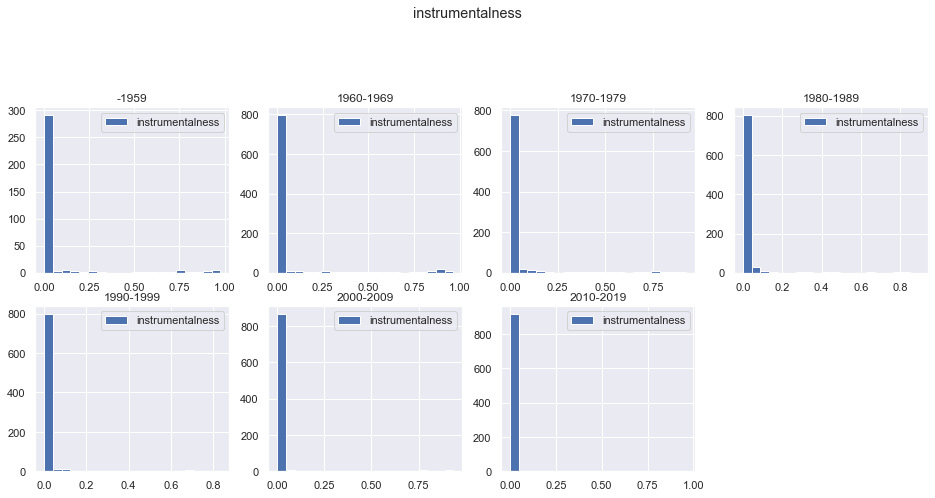

...

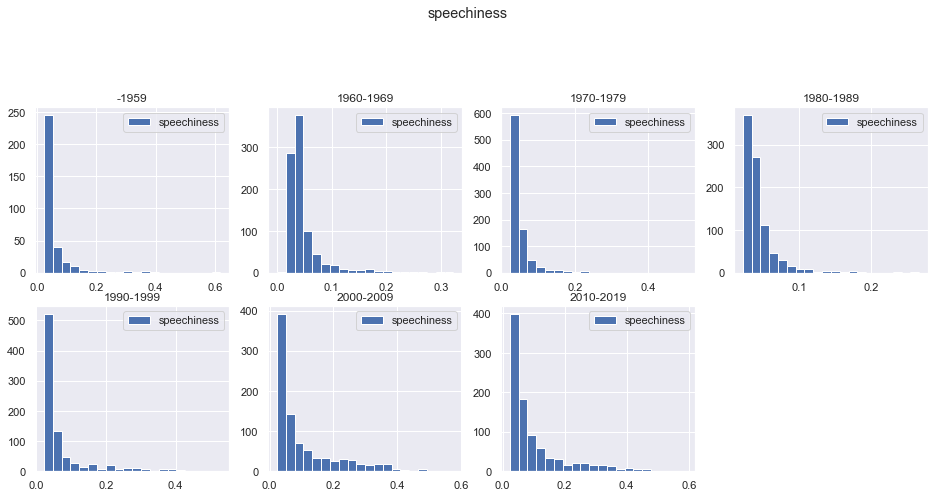

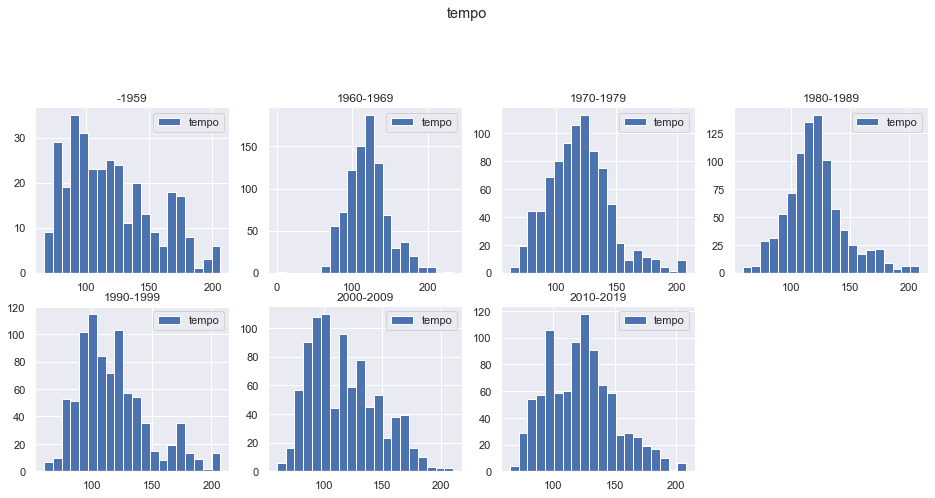

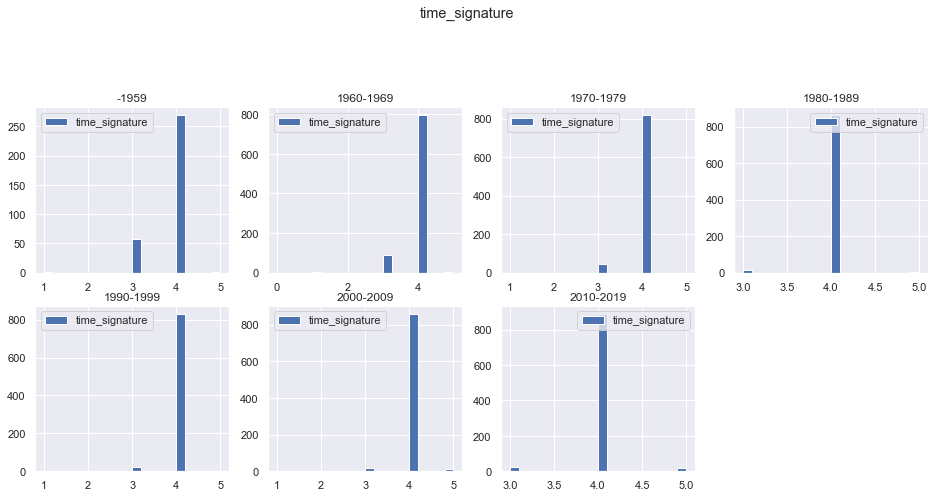

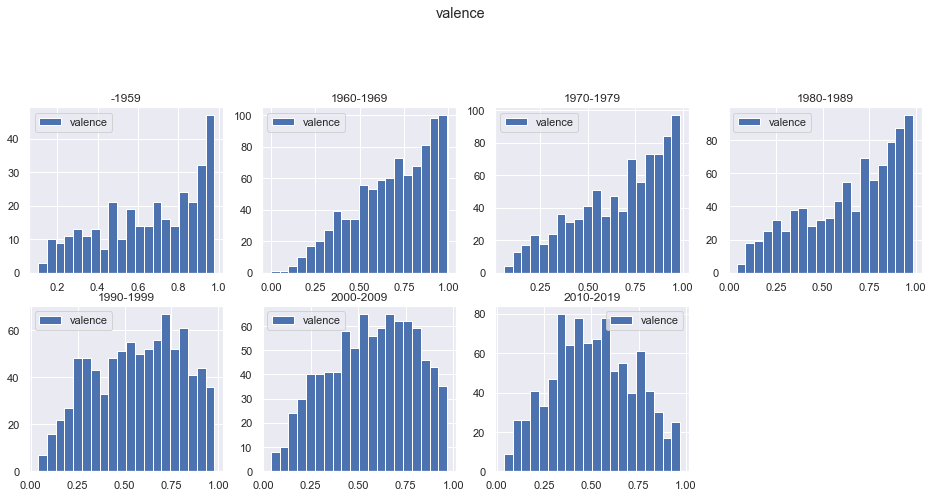

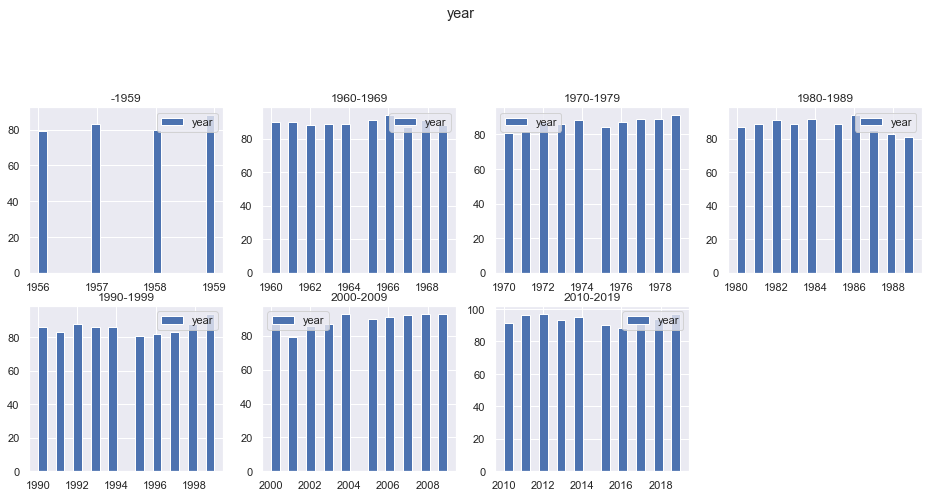

In [90]:
df10 = df.groupby("10_years")

#make the plot. 1.set the figure 2.attach the axes 3.plot the graph to those axes.

for i in df_columns:
    fig=plt.figure(figsize=(16,14)) #1. set the figure size
    axs=[] #list of axes
    c=1 #counts
    for j in labels10:
        axs.append(fig.add_subplot(4,4,c)) #2
        axs[c-1].hist(df10.get_group(j)[i], label=i,bins=20)
        axs[c-1].legend()
        axs[c-1].set_title(j)
        c=c+1
        
    fig.suptitle(i)
    plt.show() #3

## scatter plotting
scatterplot the data

In [92]:
import scipy.stats as st

In [99]:
dfbp.remove("year")

In [122]:
#the pearson correlation and the p-value of each columns by year.
for i in labels10:
    print(i)
    for j in dfbp:
        for k in dfbp:   
            if j == k:
                pass
            else:
                p = st.pearsonr(df[df["10_years"] == i][j], df[df["10_years"] == i][k])
                if p[0] > 0.4:
                    a.append(j)
                    a.append(k)
                    a.append(p)
                print(j, "vs", k, ":", p)
    print("\n")

-1959
acousticness vs danceability : (-0.2799349398018158, 2.3447353227867284e-07)
acousticness vs duration_ms : (0.1405593469500287, 0.01057608737925954)
acousticness vs energy : (-0.45787034955134326, 1.663106516455286e-18)
acousticness vs instrumentalness : (-0.10167690941142263, 0.06506258269705746)
acousticness vs liveness : (-0.022361407989257866, 0.685680119508538)
acousticness vs loudness : (-0.20823118814561917, 0.0001388531963053944)
acousticness vs speechiness : (-0.10515271079830228, 0.05636033626867893)
acousticness vs tempo : (-0.1823854597217654, 0.0008728806757211027)
acousticness vs time_signature : (-0.13463591127607055, 0.014378871201264477)
acousticness vs valence : (-0.4292747671170682, 3.15001618506531e-16)
danceability vs acousticness : (-0.2799349398018158, 2.3447353227867284e-07)
danceability vs duration_ms : (-0.24713968091404376, 5.542050186298367e-06)
danceability vs energy : (0.22850073150390593, 2.7804007901517e-05)
danceability vs instrumentalness : (0.00

danceability vs energy : (0.1146172407291498, 0.0005831447384895828)
danceability vs instrumentalness : (0.04462432485995577, 0.1817787604179005)
danceability vs liveness : (-0.17424308152284965, 1.5085034514384823e-07)
danceability vs loudness : (0.006189126820785006, 0.8531448086354269)
danceability vs speechiness : (0.10292024714141587, 0.0020262461918475624)
danceability vs tempo : (-0.07418953315747381, 0.026287517416555453)
danceability vs time_signature : (0.3004349214461969, 3.6195133510409005e-20)
danceability vs valence : (0.5384865858674908, 1.3819068836659697e-68)
duration_ms vs acousticness : (-0.09196995939572092, 0.0058423714187643755)
duration_ms vs danceability : (-0.1580031808064217, 1.979636707189257e-06)
duration_ms vs energy : (-0.12312966105077781, 0.00021845382450804814)
duration_ms vs instrumentalness : (0.03533035959791523, 0.29051282556853586)
duration_ms vs liveness : (0.0757818326189173, 0.023222004989596767)
duration_ms vs loudness : (-0.1431237015952199, 1

duration_ms vs energy : (0.007973158162670605, 0.8149644383768888)
duration_ms vs instrumentalness : (0.17997492690337924, 1.0037149405778428e-07)
duration_ms vs liveness : (-0.022773194912971115, 0.5038080433240802)
duration_ms vs loudness : (-0.08867581763578963, 0.009110180741292379)
duration_ms vs speechiness : (-0.005931671151822774, 0.8617837879588582)
duration_ms vs tempo : (-0.036313521856018306, 0.2863325368083946)
duration_ms vs time_signature : (0.019658069817399523, 0.5639083063686615)
duration_ms vs valence : (-0.11615244462709307, 0.000624343333881055)
energy vs acousticness : (-0.5260449029982106, 1.1802602179309166e-62)
energy vs danceability : (0.31195854690901037, 5.900422131946861e-21)
energy vs duration_ms : (0.007973158162670605, 0.8149644383768888)
energy vs instrumentalness : (0.013757473328750585, 0.6863457134499978)
energy vs liveness : (0.12024222946594307, 0.0003969138339304879)
energy vs loudness : (0.6612485660931222, 9.980316399836668e-110)
energy vs speec

energy vs valence : (0.4810583054880203, 3.6683794704396414e-52)
instrumentalness vs acousticness : (-0.09378827720682828, 0.005362772291536977)
instrumentalness vs danceability : (0.07882714953114343, 0.019350583637202896)
instrumentalness vs duration_ms : (0.03923612080445418, 0.2449411822250323)
instrumentalness vs energy : (0.05408427863154617, 0.10887018442317889)
instrumentalness vs liveness : (-0.025583605358967386, 0.44846432635133915)
instrumentalness vs loudness : (0.007866877316027126, 0.8157294186149928)
instrumentalness vs speechiness : (0.08457518866781653, 0.012078674863409605)
instrumentalness vs tempo : (0.014023319455912847, 0.6778286017435545)
instrumentalness vs time_signature : (0.023717753816288625, 0.48225453034051785)
instrumentalness vs valence : (0.023035338665107107, 0.4949494903832505)
liveness vs acousticness : (0.0008663067945847147, 0.9795267025656413)
liveness vs danceability : (-0.12288984135710251, 0.00025800620980089744)
liveness vs duration_ms : (-0.

loudness vs energy : (0.606935054457326, 2.2366668315186763e-87)
loudness vs instrumentalness : (-0.11121784200184265, 0.0011093236340541373)
loudness vs liveness : (0.06809750606466923, 0.04626924189388064)
loudness vs speechiness : (0.026208067546778256, 0.4435326152186105)
loudness vs tempo : (0.03248048548924764, 0.3422572079919976)
loudness vs time_signature : (0.08670516578701346, 0.011106355615615088)
loudness vs valence : (0.19382029047322955, 1.0649336067998597e-08)
speechiness vs acousticness : (-0.17180254108790372, 4.197627186067769e-07)
speechiness vs danceability : (0.33340189656848823, 1.0755936658532601e-23)
speechiness vs duration_ms : (-0.054370609670936404, 0.11171555611201786)
speechiness vs energy : (0.07273298697554048, 0.033259321203603164)
speechiness vs instrumentalness : (-0.04720375318897777, 0.16739523122532154)
speechiness vs liveness : (0.1489482283115736, 1.1951203067916816e-05)
speechiness vs loudness : (0.026208067546778256, 0.4435326152186105)
speechin

time_signature vs acousticness : (-0.02146574230285617, 0.5212905130212324)
time_signature vs danceability : (0.04812716989133349, 0.15025810013691074)
time_signature vs duration_ms : (-0.006088550731260322, 0.8556646881323758)
time_signature vs energy : (0.04002906522109148, 0.23156490033476912)
time_signature vs instrumentalness : (0.0027252887250597078, 0.935109975620787)
time_signature vs liveness : (0.027898267435657542, 0.4044975389966269)
time_signature vs loudness : (0.05914906344226331, 0.07695871552913738)
time_signature vs speechiness : (0.08585561721784685, 0.010179827093059604)
time_signature vs tempo : (-0.005772771701368041, 0.8630747299410134)
time_signature vs valence : (0.04445814001026524, 0.18390324741451444)
valence vs acousticness : (-0.1199322295079947, 0.00032323361238603123)
valence vs danceability : (0.4831517643237827, 1.5548686103822553e-53)
valence vs duration_ms : (-0.12744022454217735, 0.0001319228478855872)
valence vs energy : (0.26762173467565237, 3.819

time_signature vs loudness : (0.06090063853438411, 0.06282270288542038)
time_signature vs speechiness : (0.060389256110949585, 0.065067600299357)
time_signature vs tempo : (-0.06493399095591901, 0.04726575665690463)
time_signature vs valence : (0.06350835654308819, 0.05234750685183307)
valence vs acousticness : (-0.16088670242005365, 7.709848884816996e-07)
valence vs danceability : (0.22626592976376703, 2.6209776026795682e-12)
valence vs duration_ms : (-0.19205311929914246, 3.2843077961814517e-09)
valence vs energy : (0.43210842234066504, 8.953210513789465e-44)
valence vs instrumentalness : (-0.12940510211460046, 7.302935725115425e-05)
valence vs liveness : (0.019717025420243988, 0.5472861554305746)
valence vs loudness : (0.33509616157606137, 6.064727243614888e-26)
valence vs speechiness : (-0.02660195288116693, 0.41676393602846973)
valence vs tempo : (0.05813068679649015, 0.07578591050344634)
valence vs time_signature : (0.06350835654308819, 0.05234750685183307)




/Users/kentakawajiri/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 1152x1008 with 0 Axes>

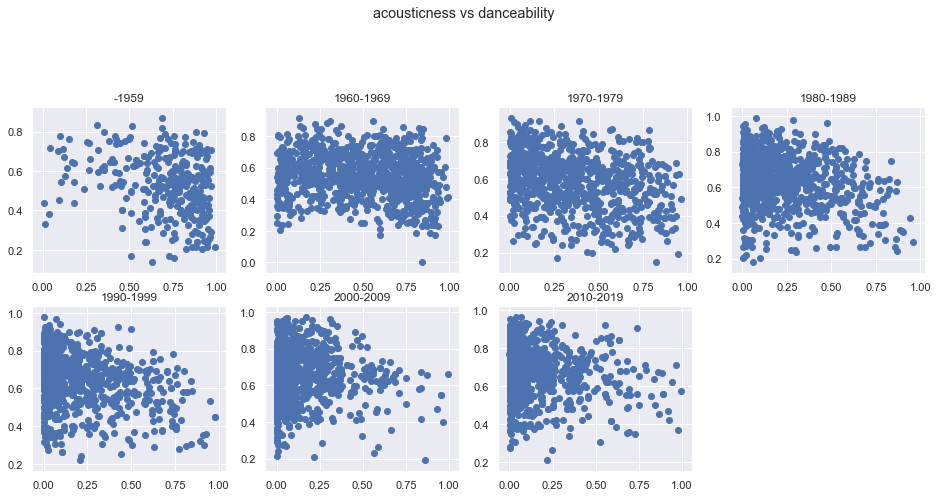

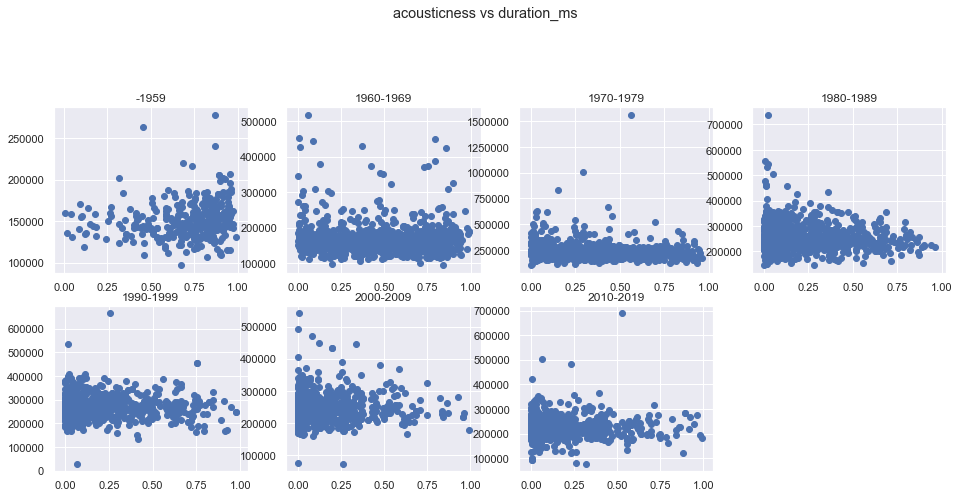

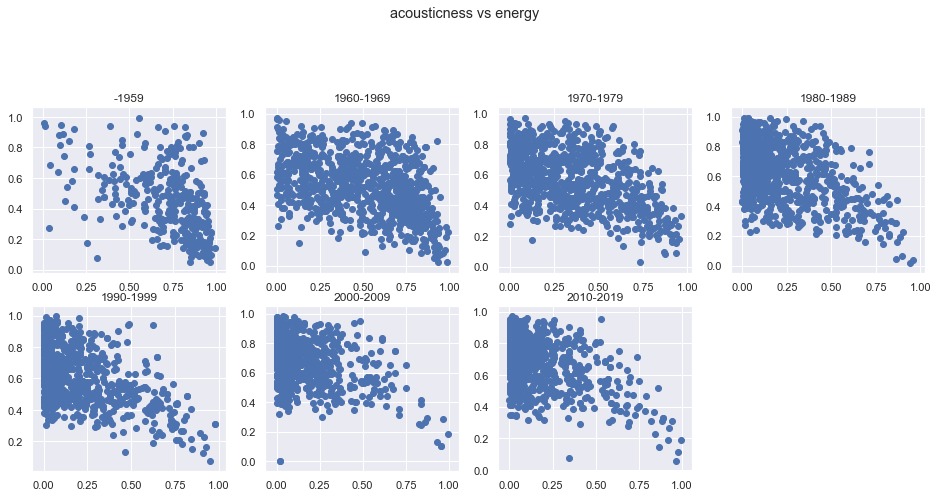

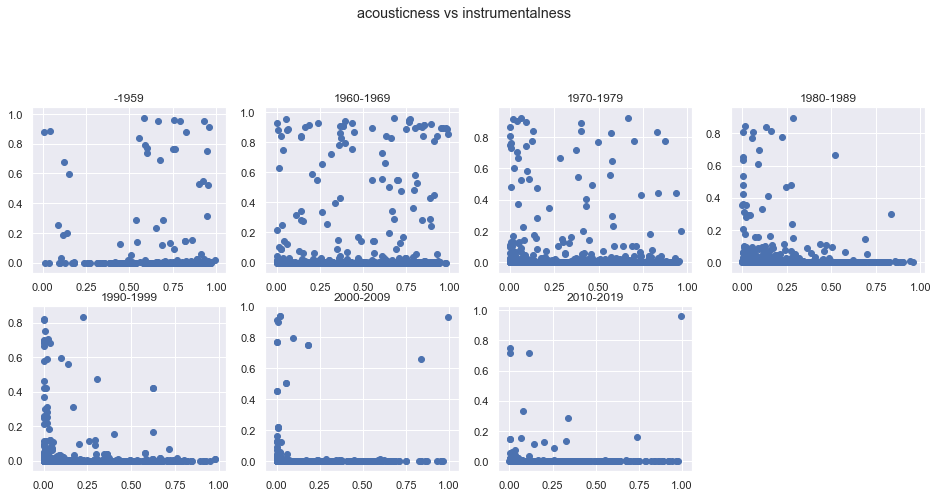

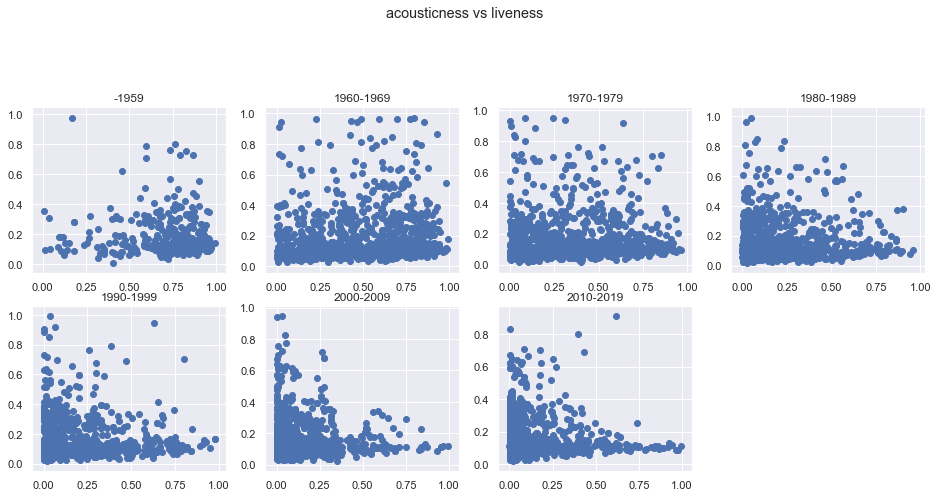

...

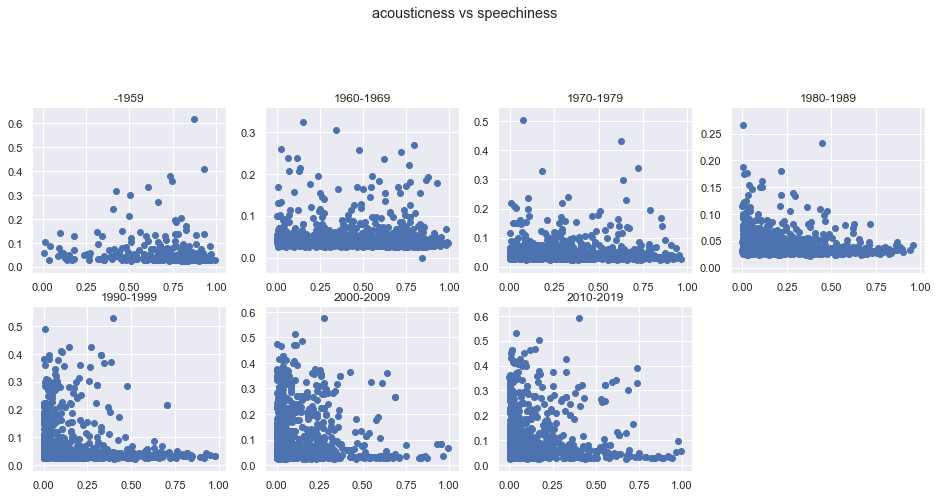

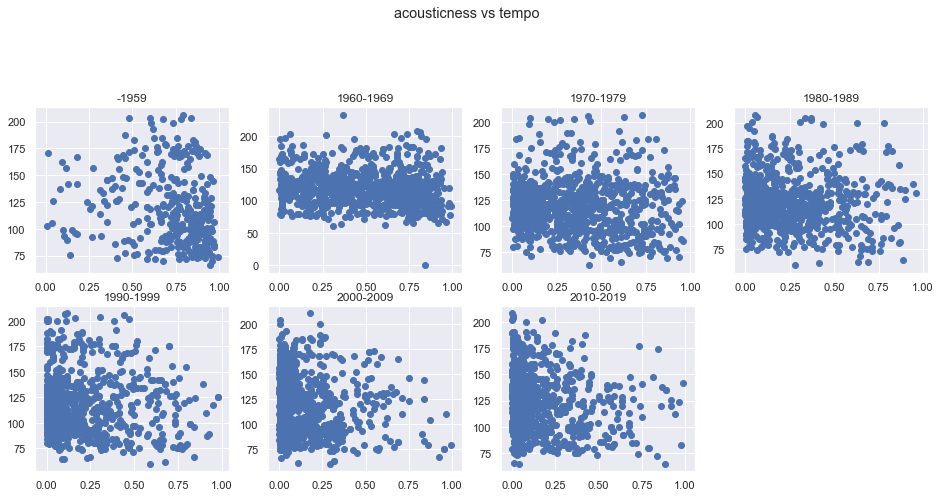

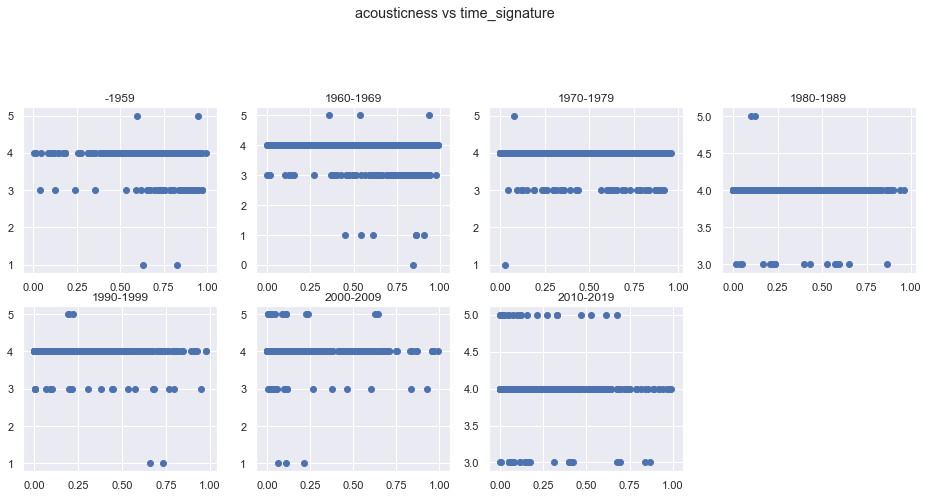

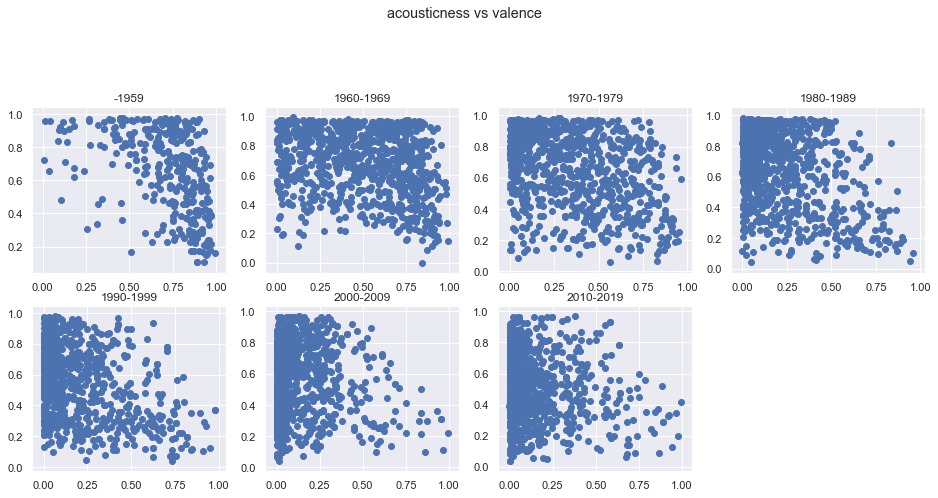

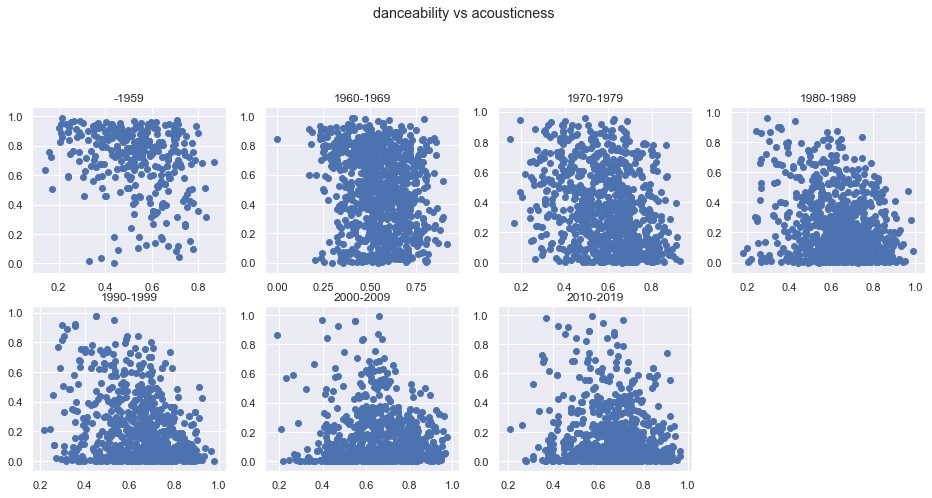

<Figure size 1152x1008 with 0 Axes>

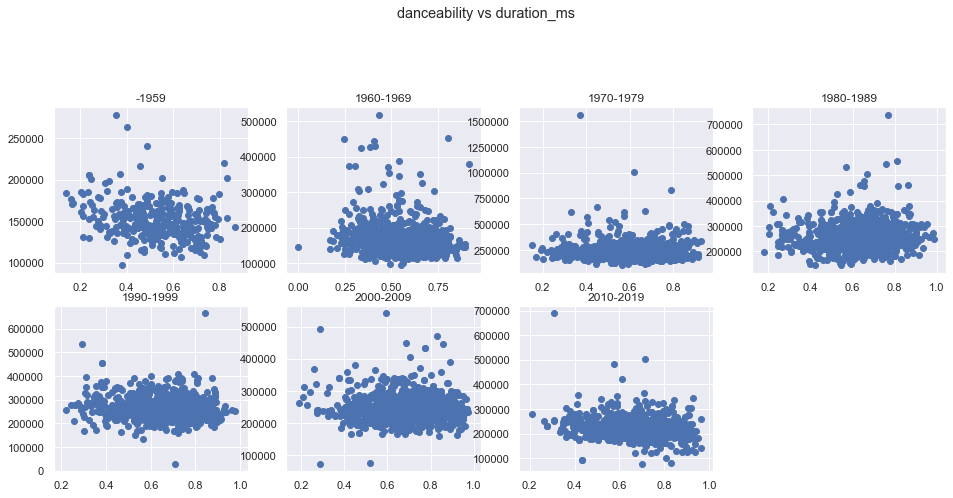

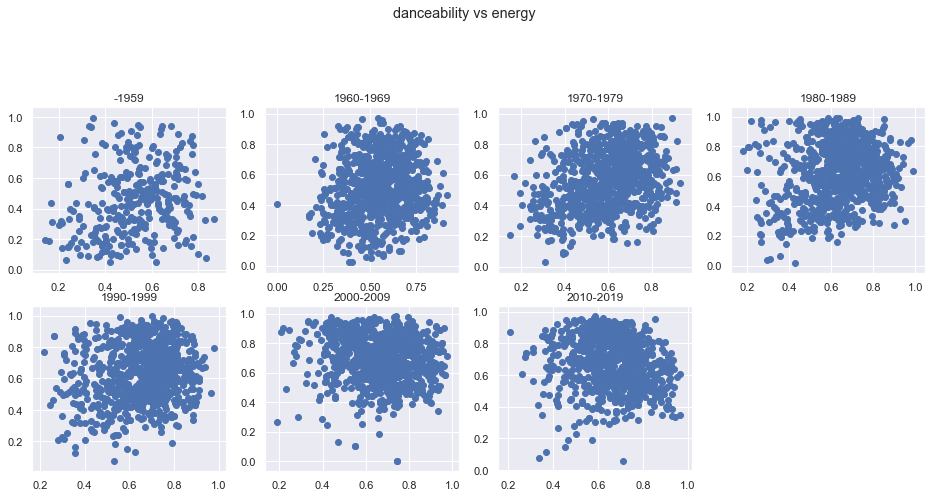

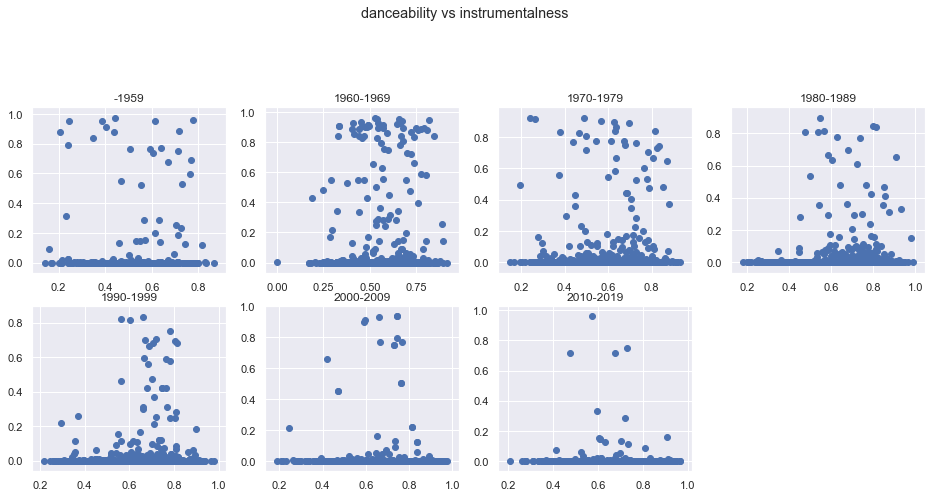

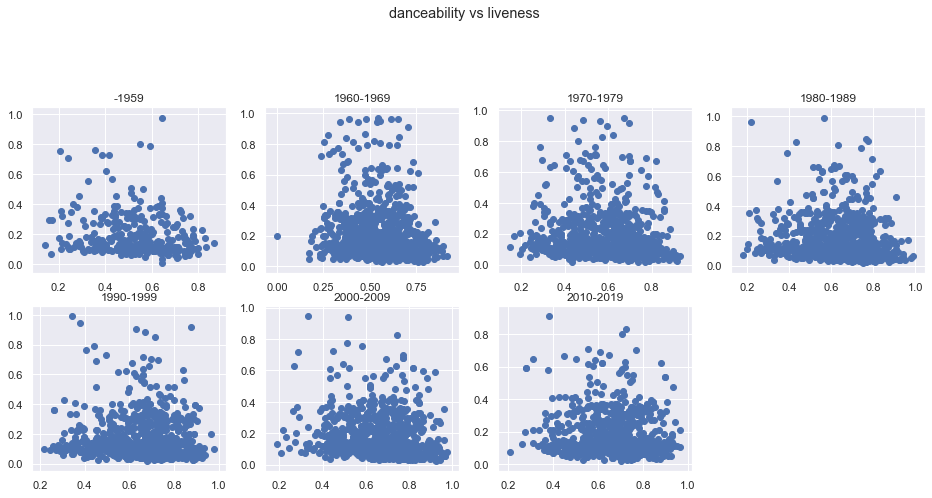

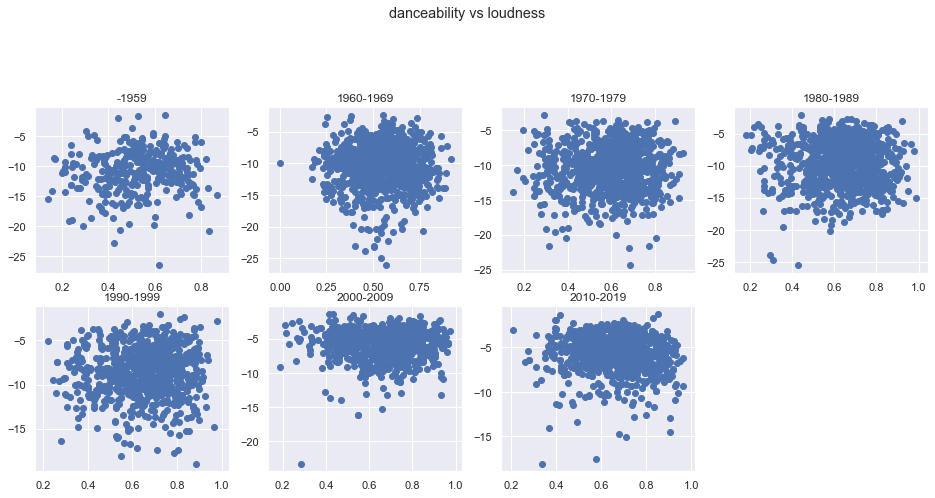

...

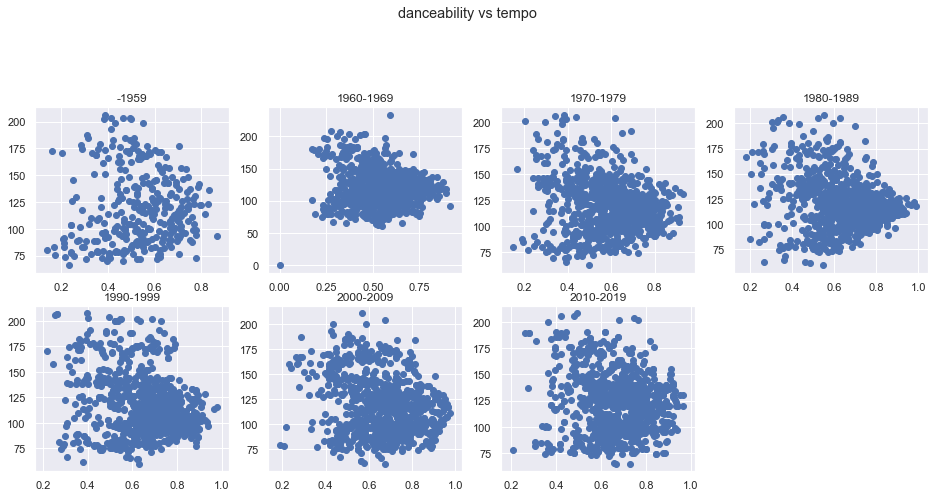

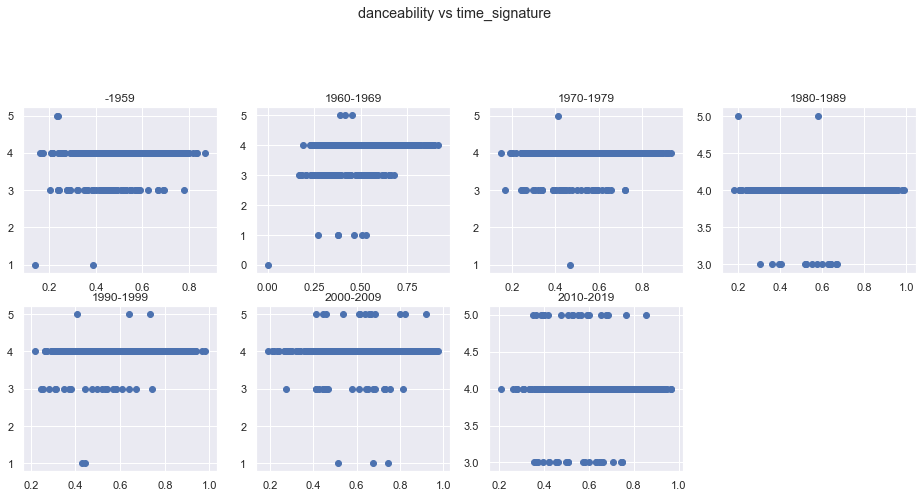

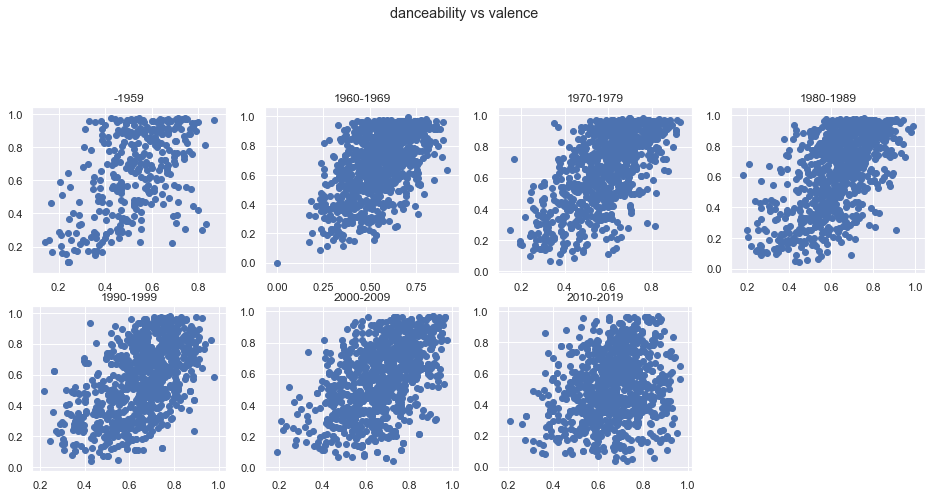

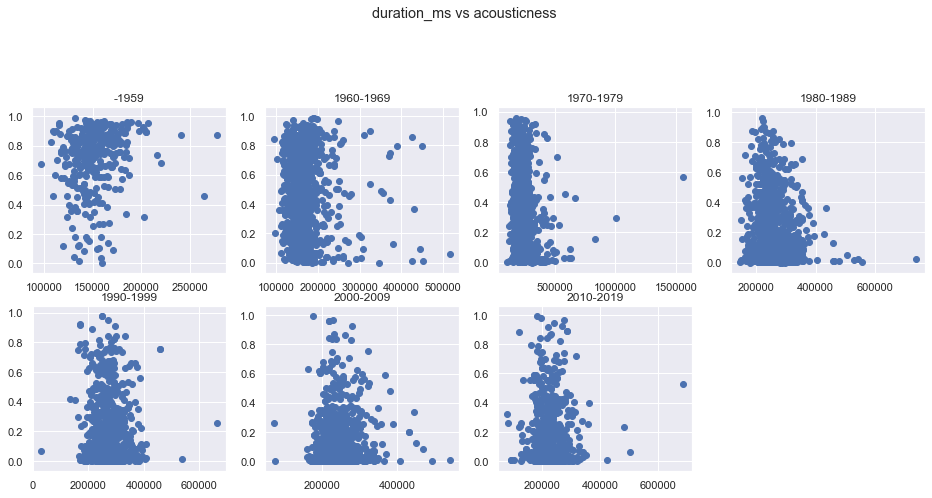

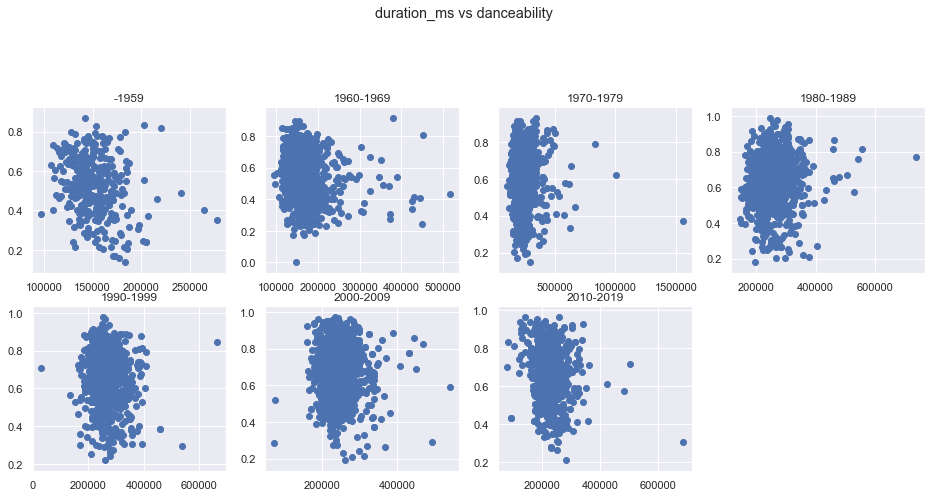

<Figure size 1152x1008 with 0 Axes>

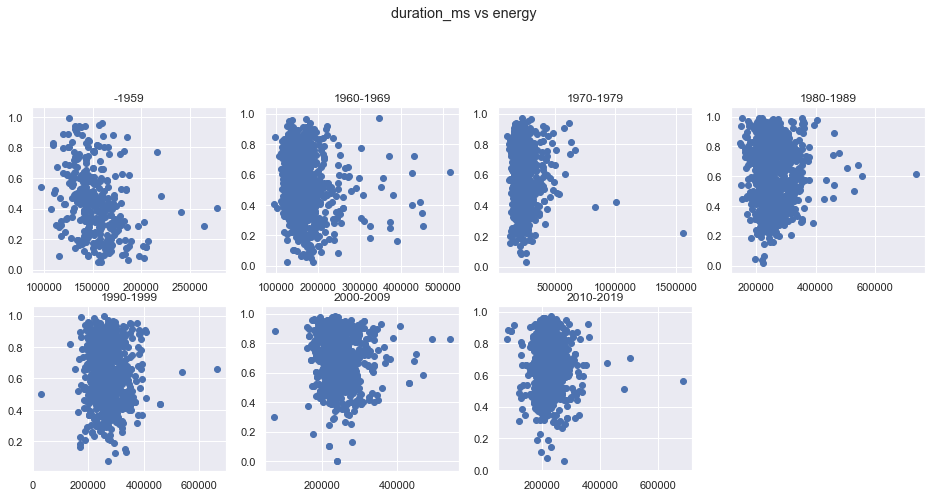

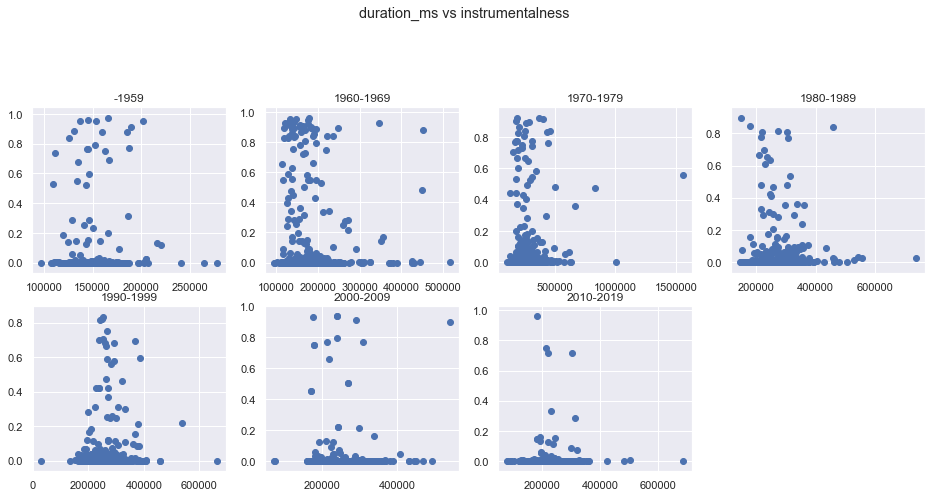

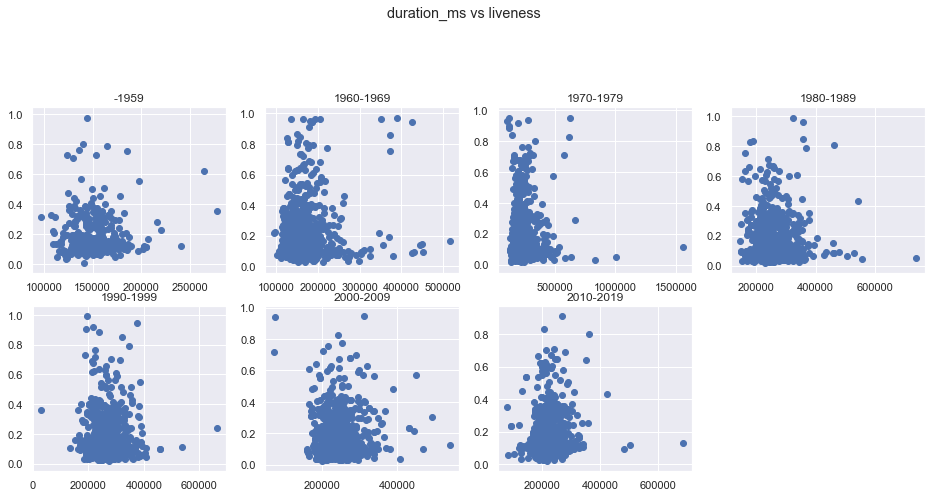

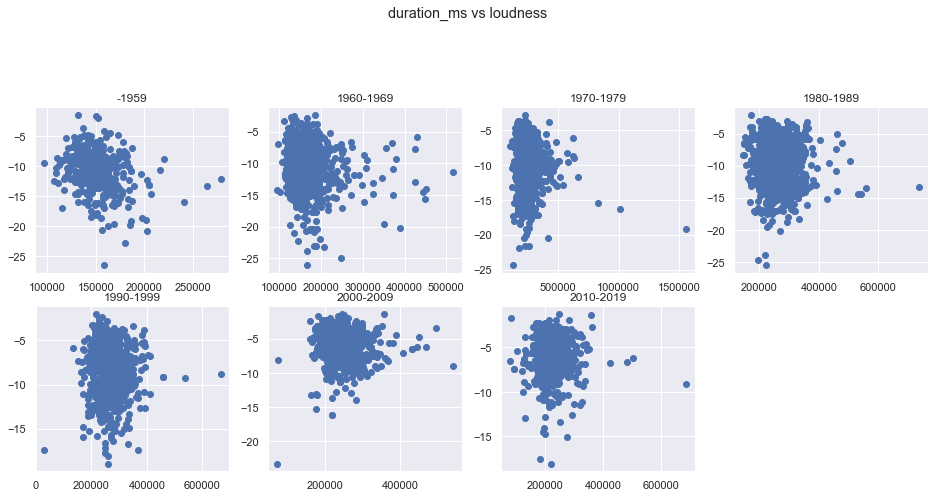

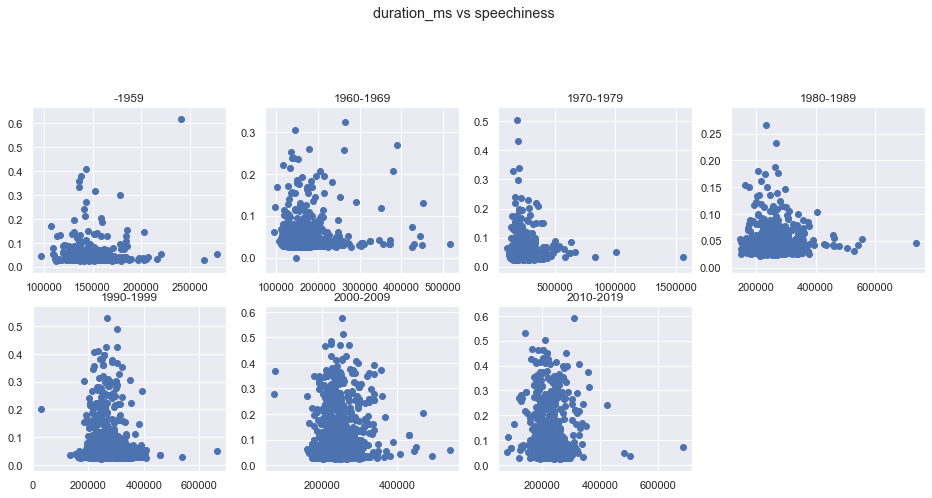

...

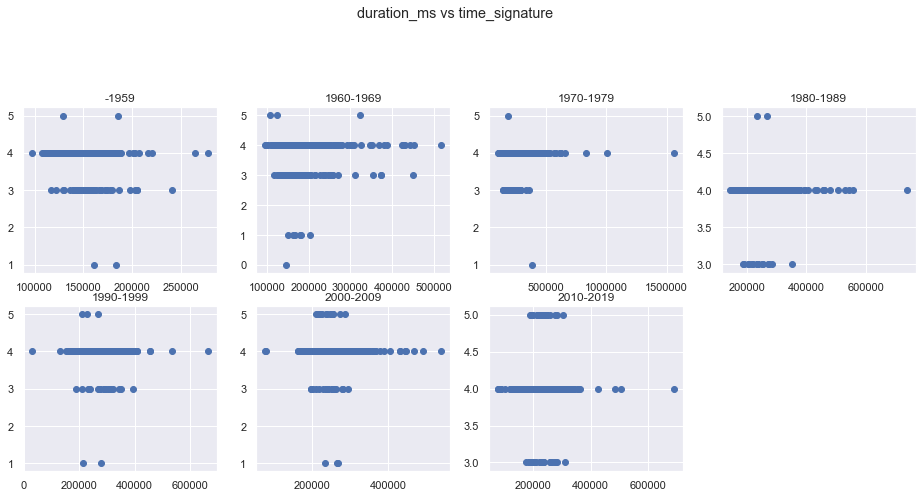

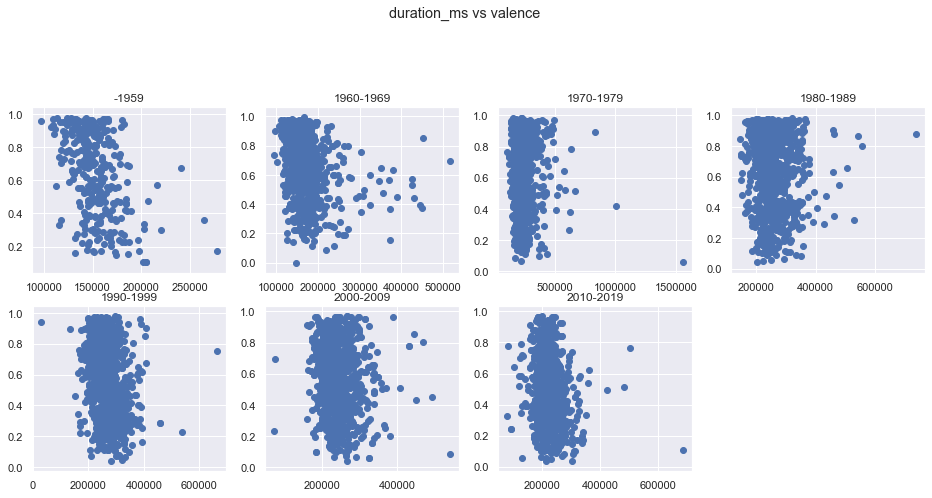

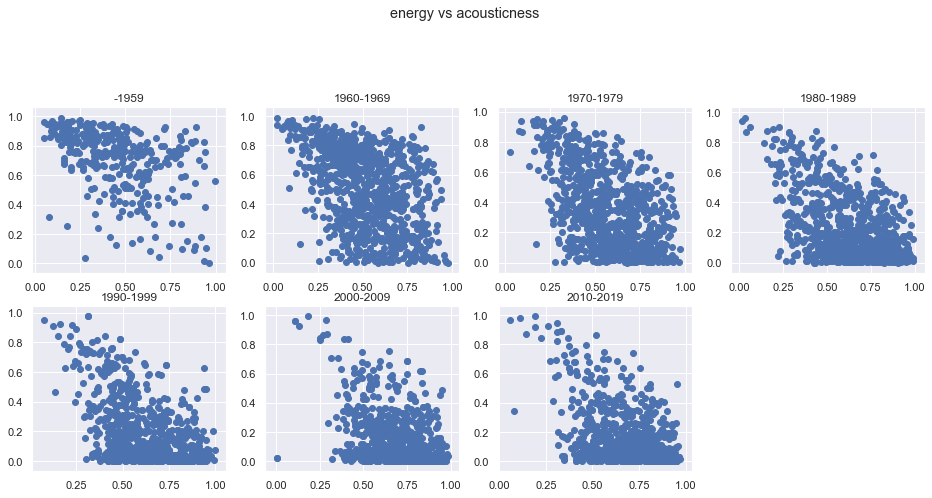

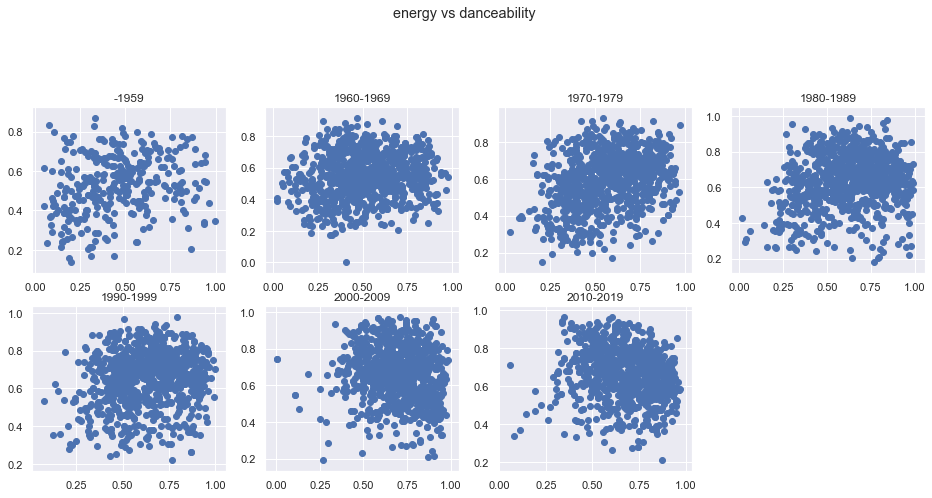

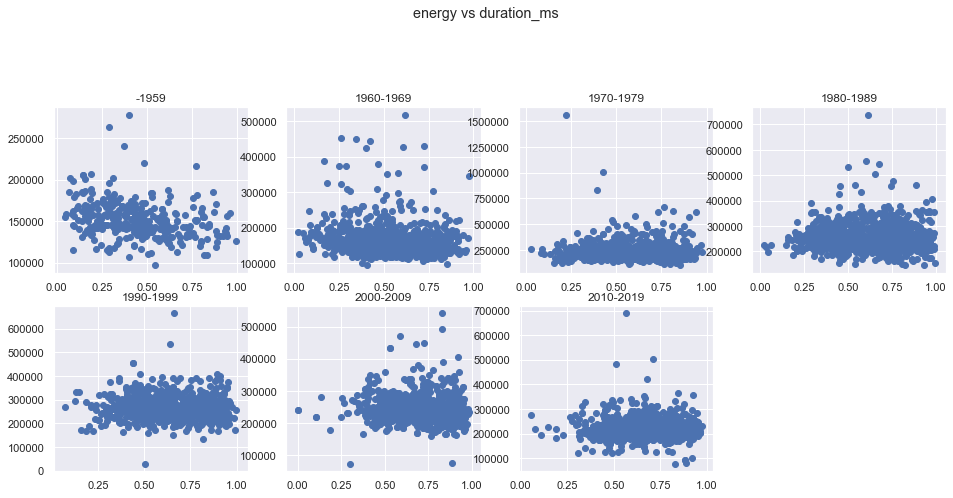

<Figure size 1152x1008 with 0 Axes>

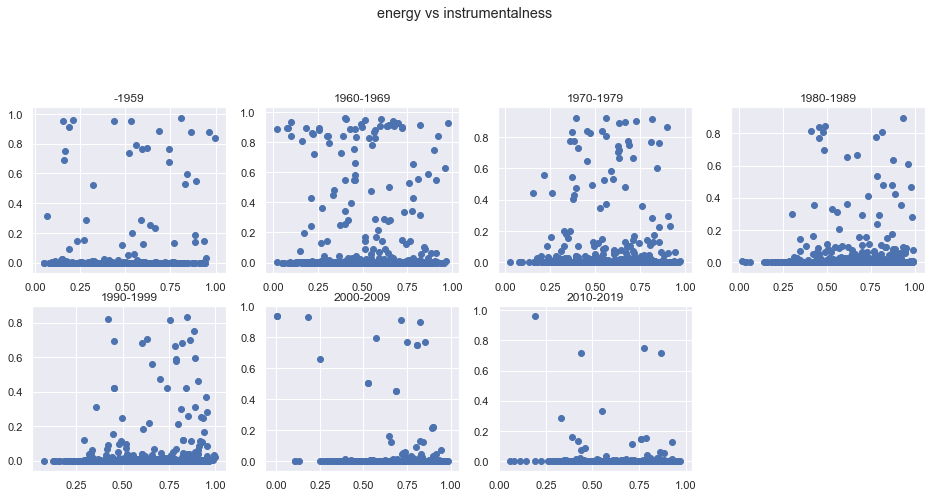

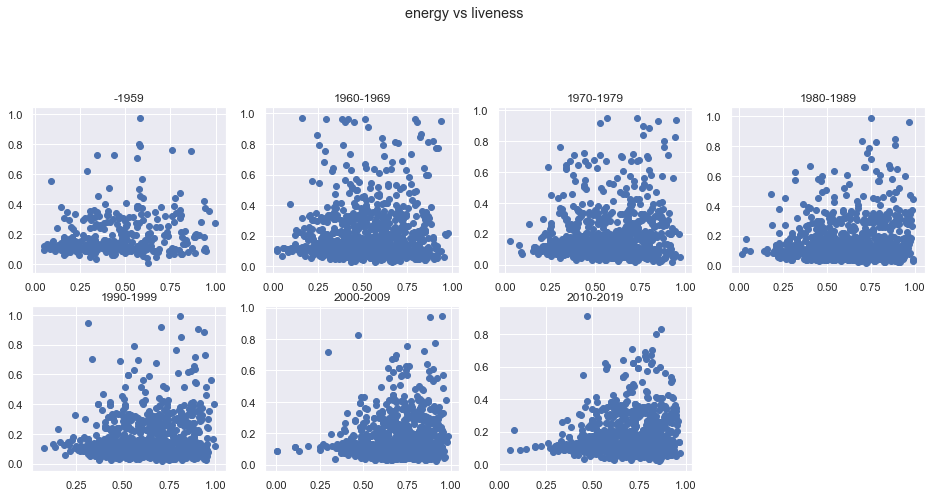

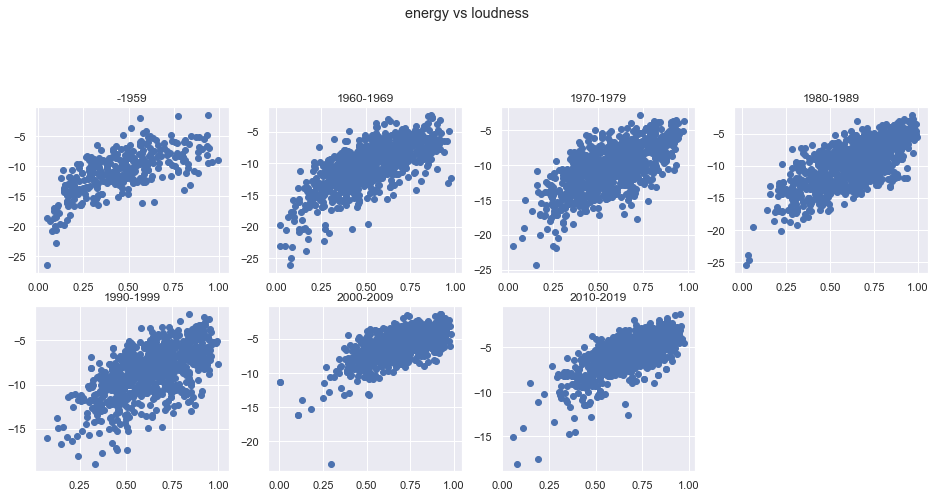

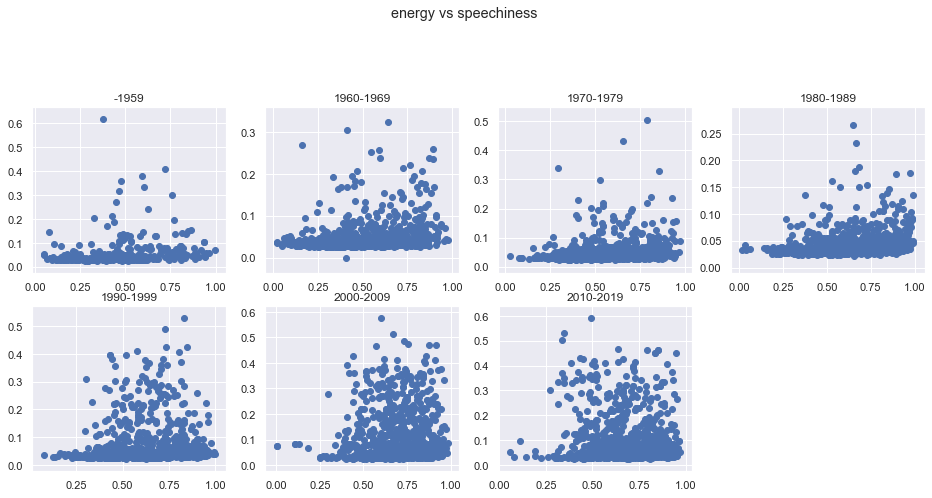

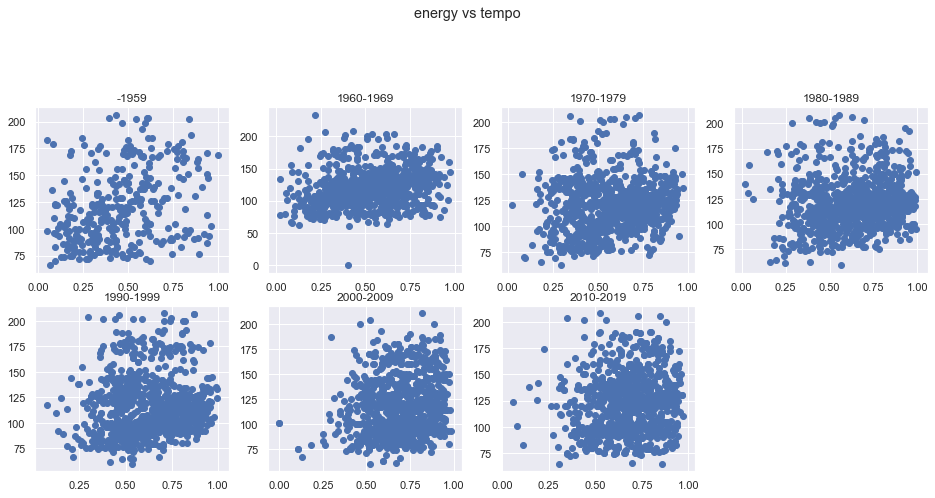

...

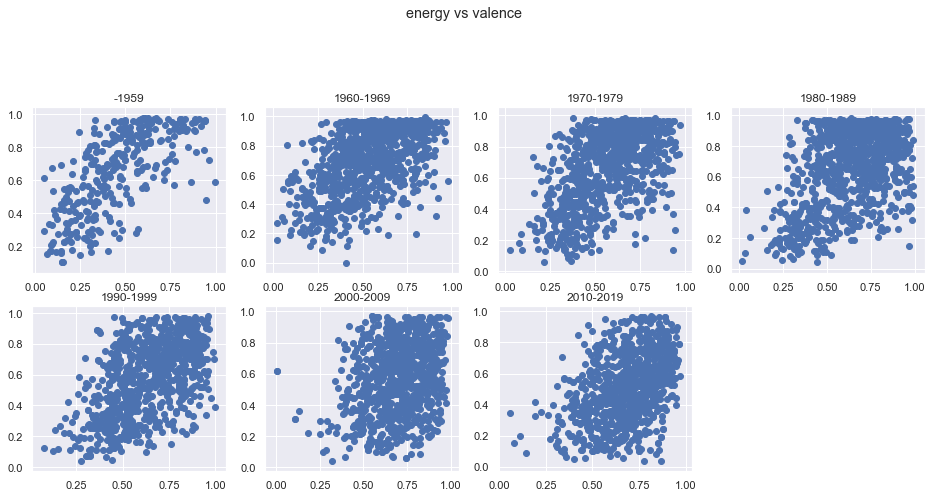

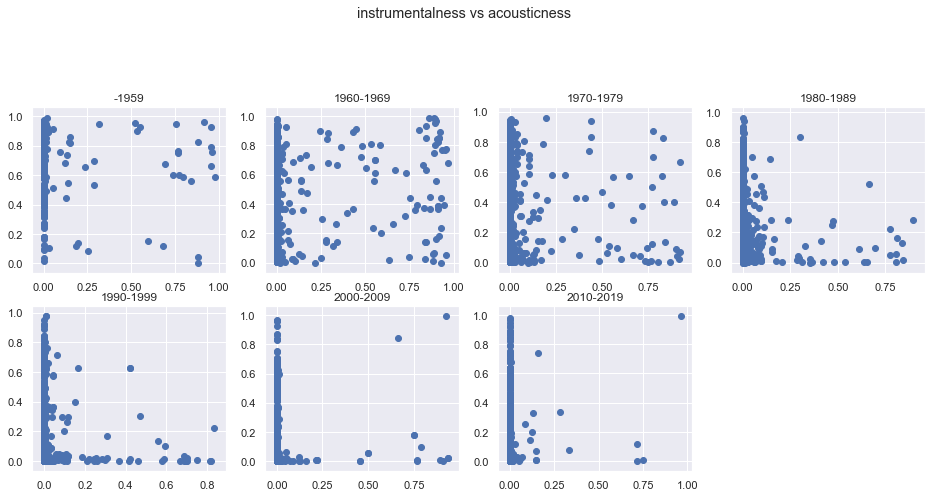

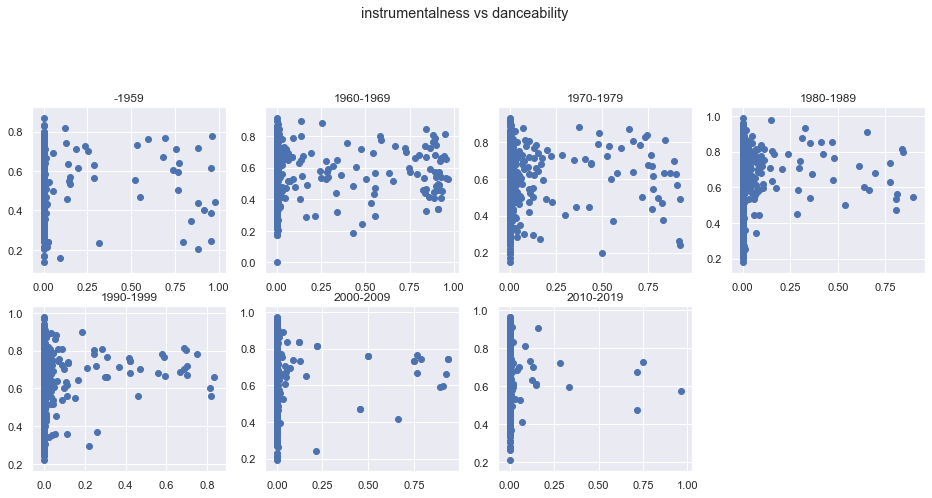

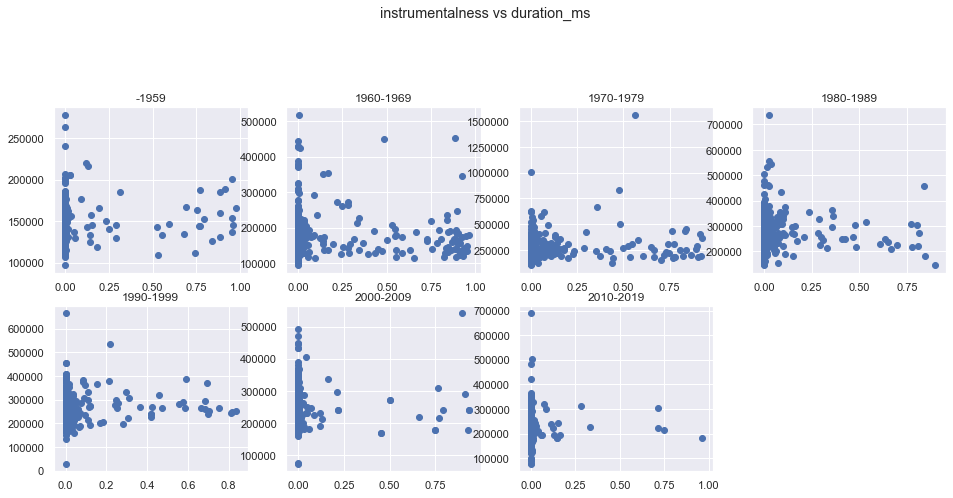

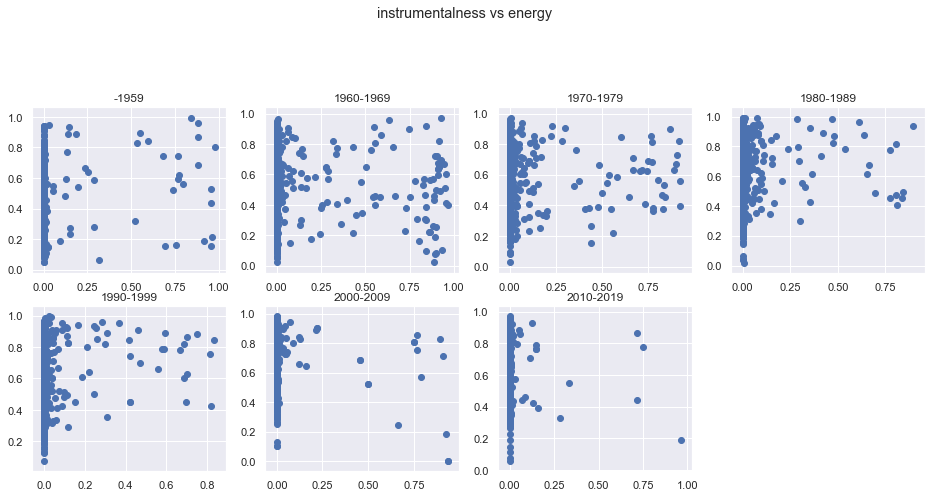

<Figure size 1152x1008 with 0 Axes>

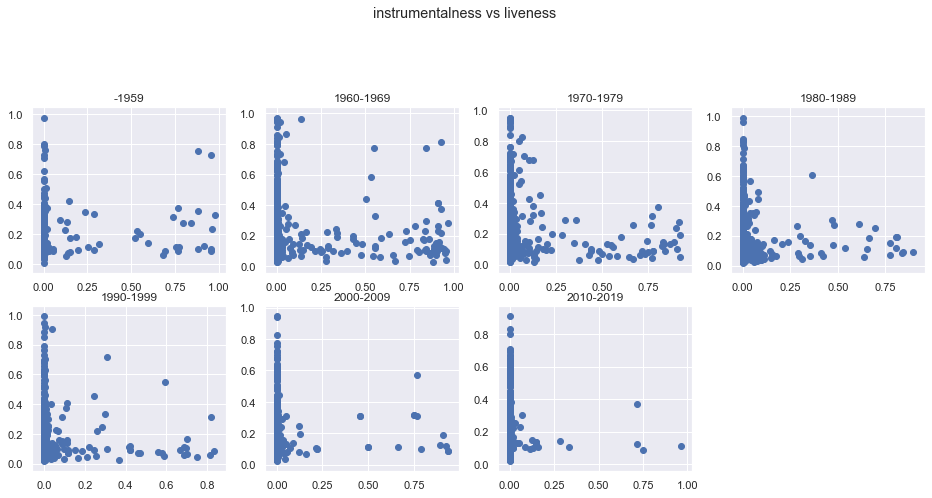

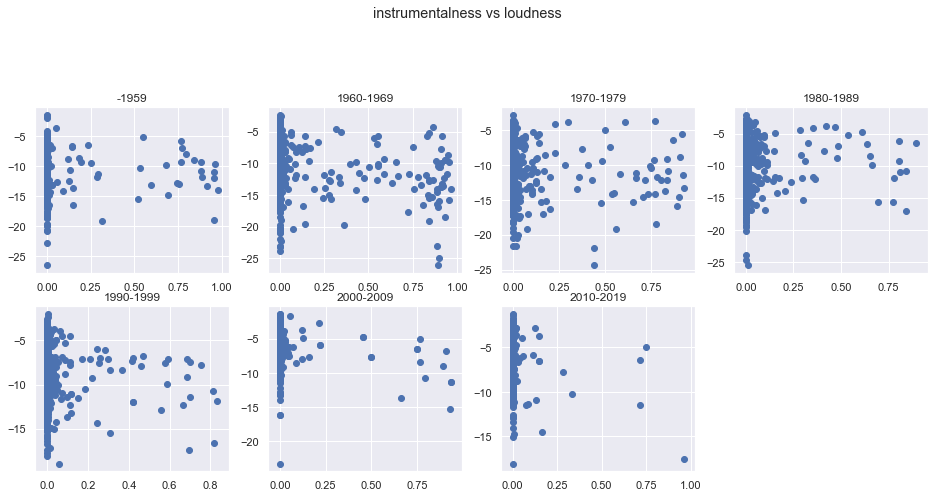

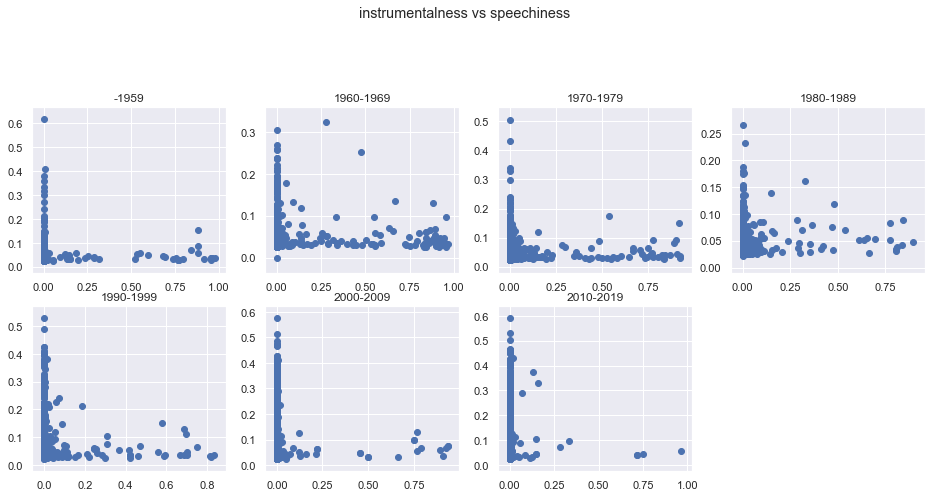

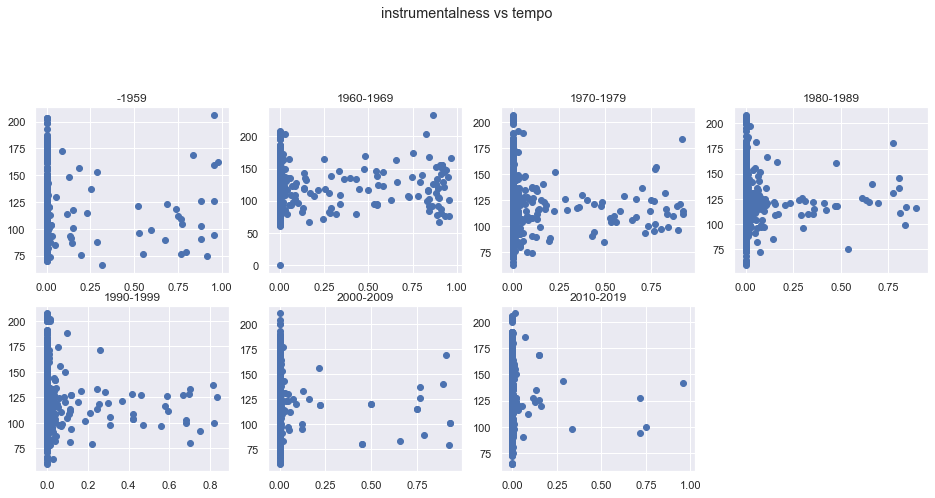

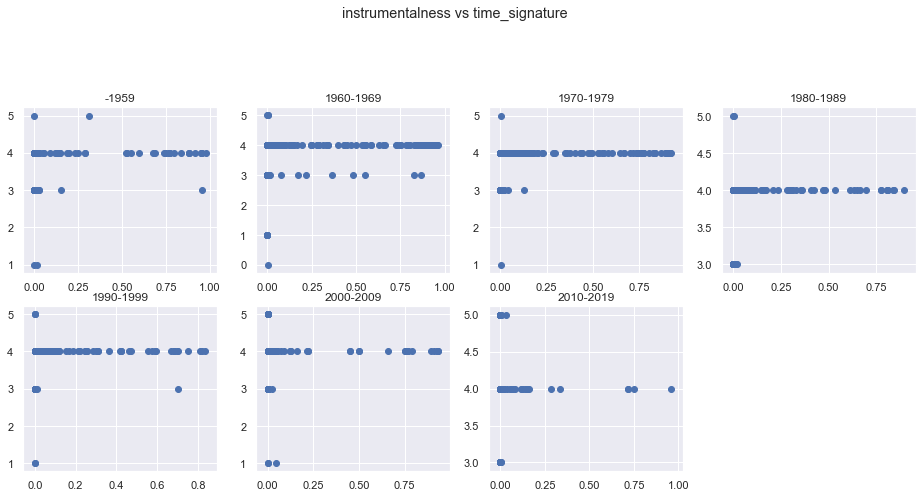

...

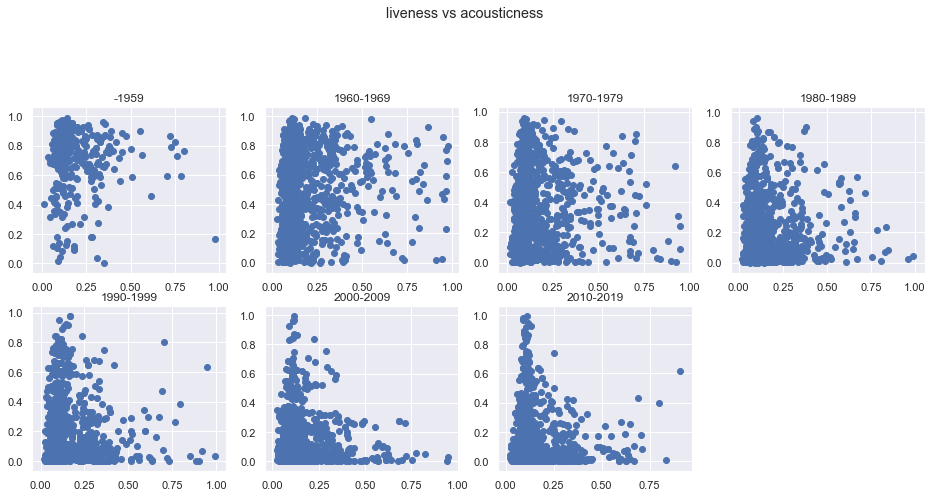

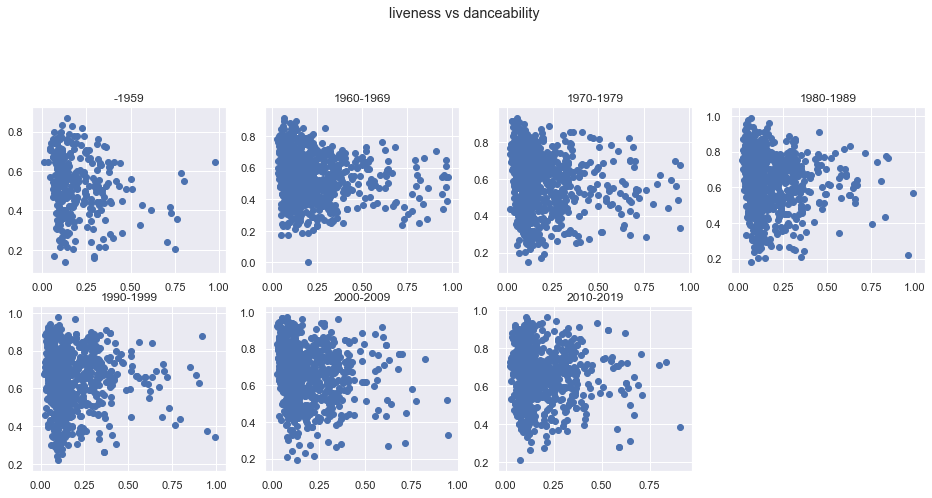

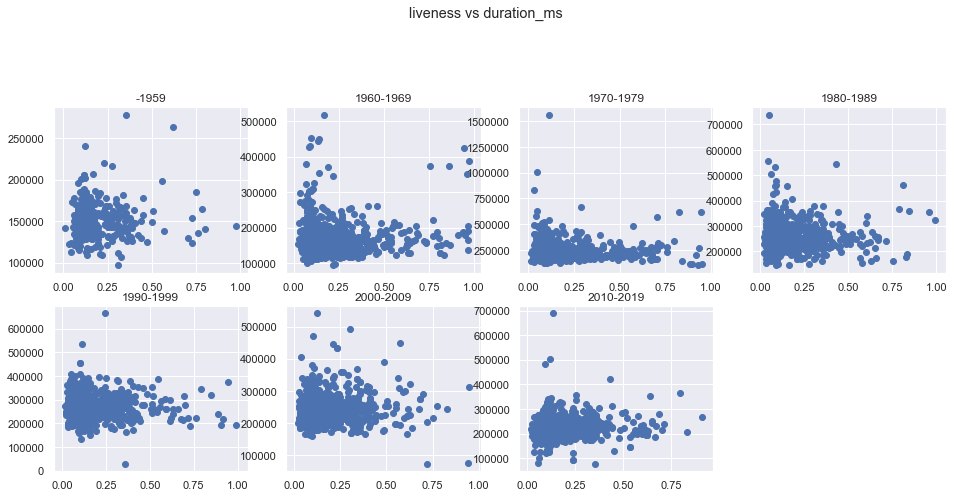

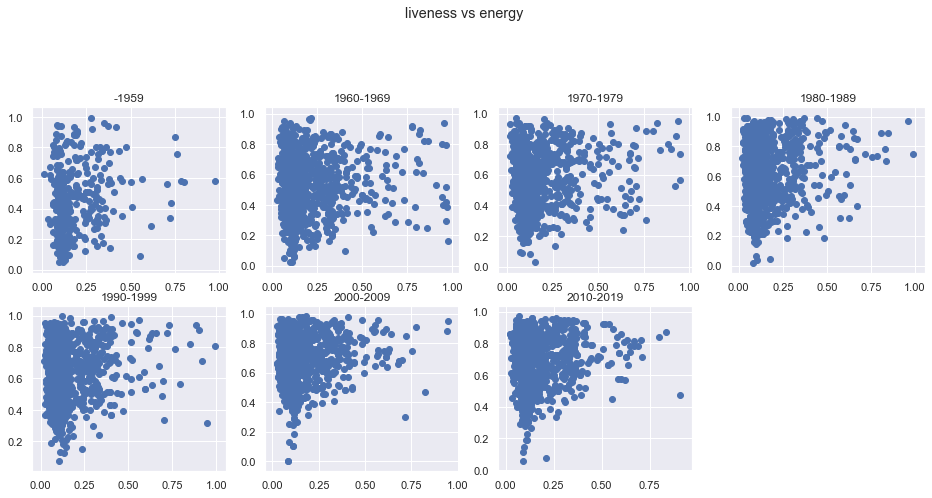

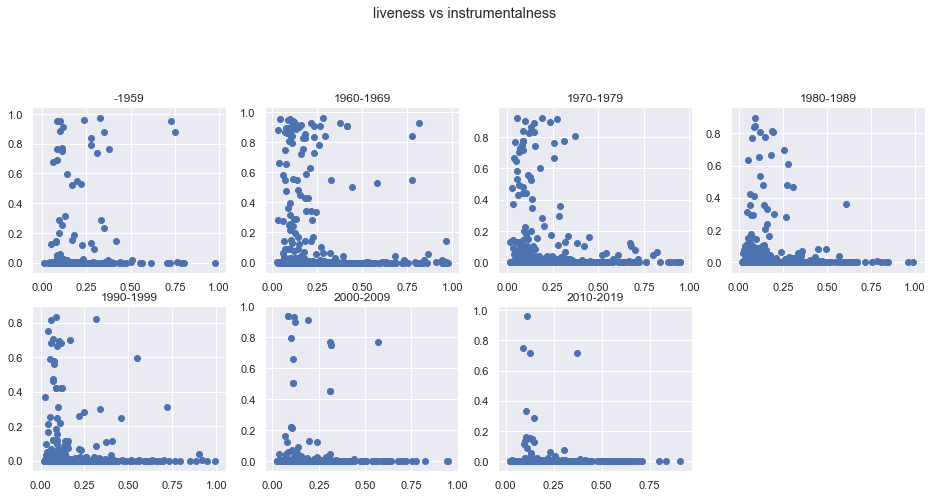

<Figure size 1152x1008 with 0 Axes>

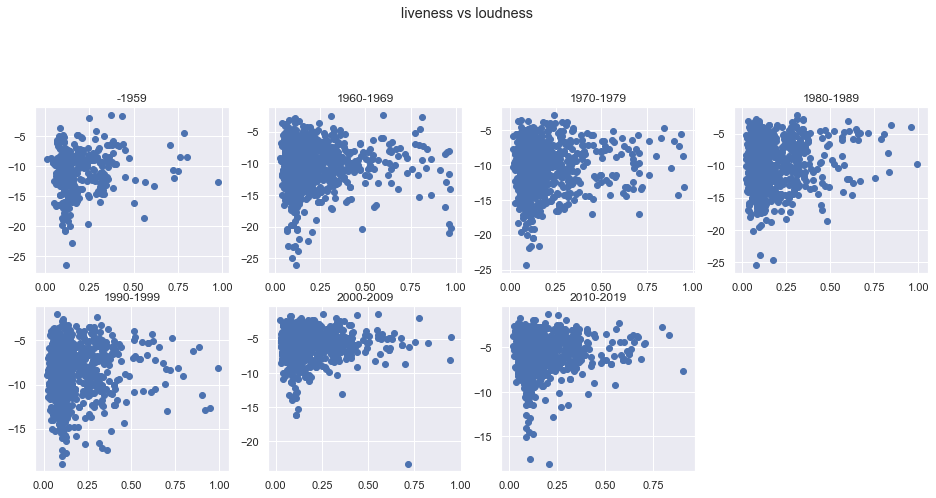

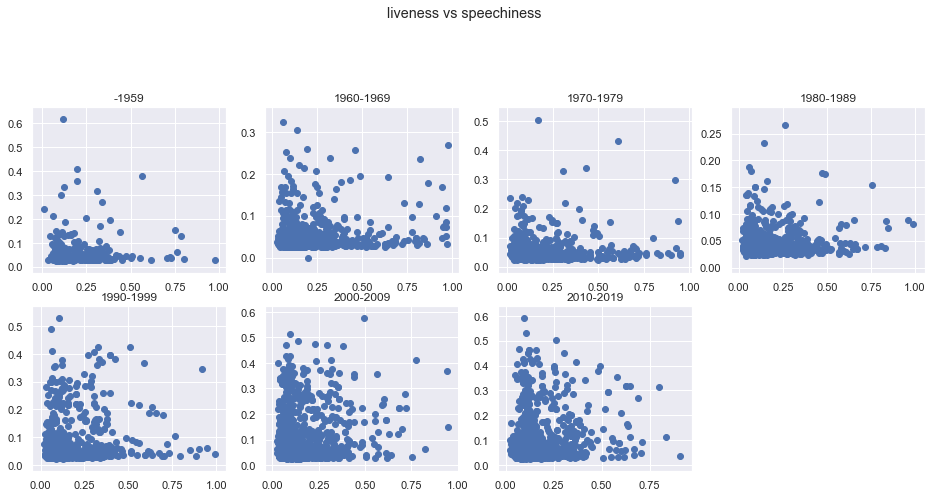

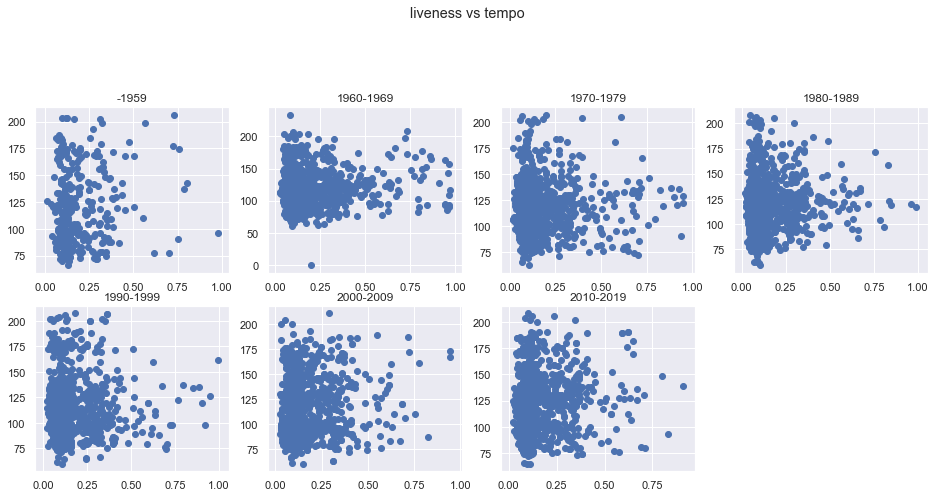

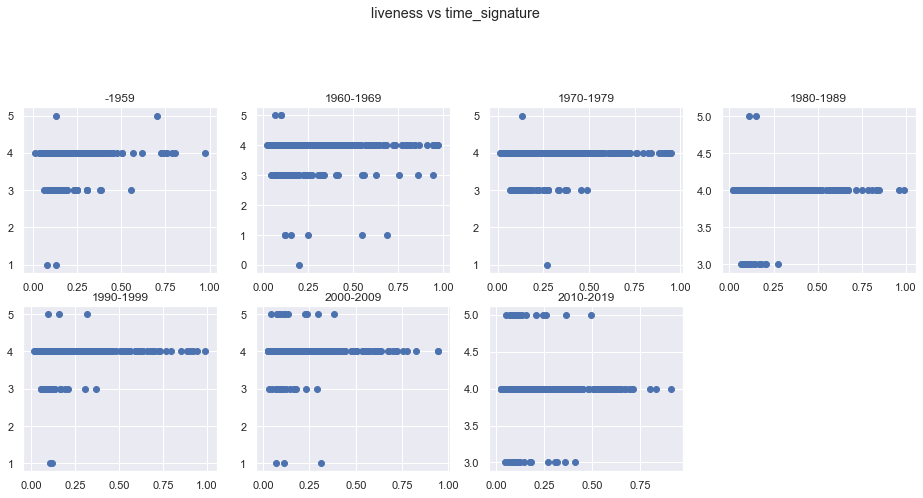

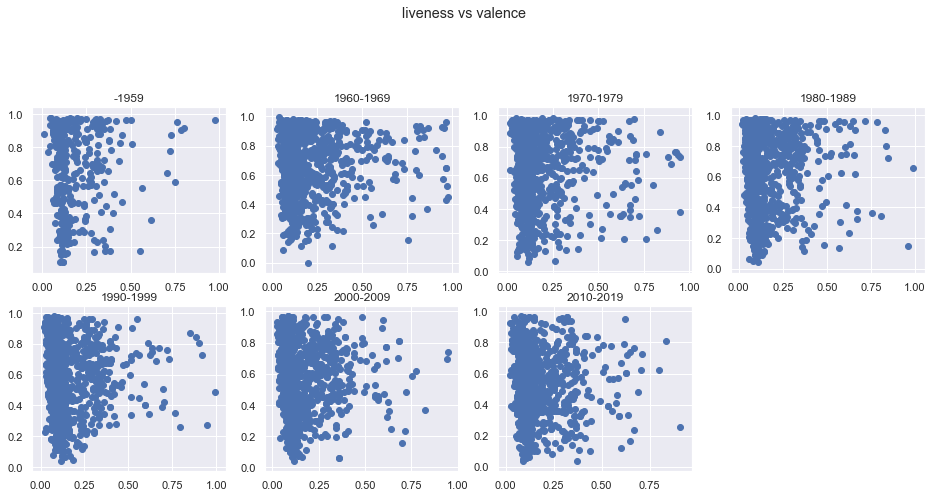

...

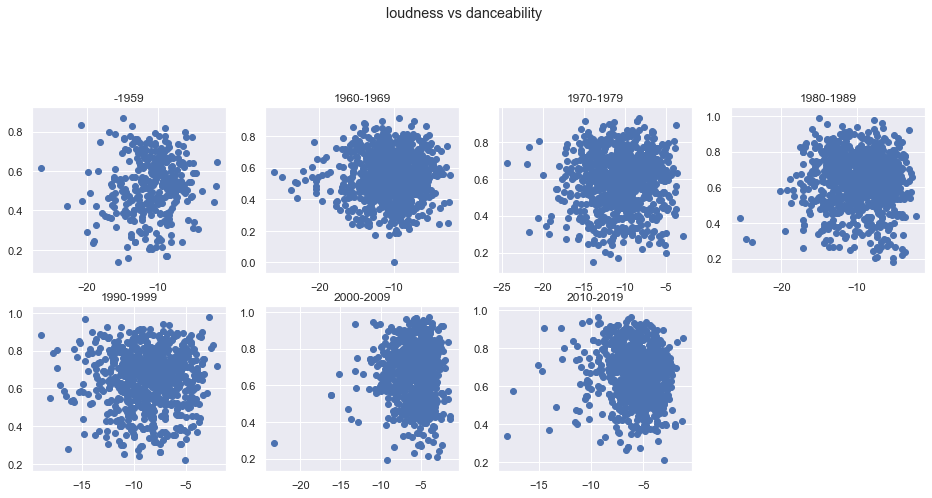

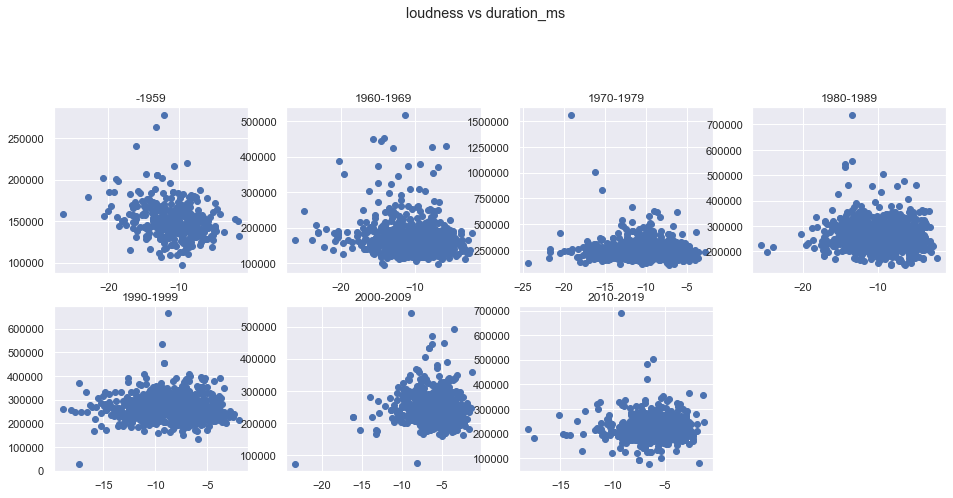

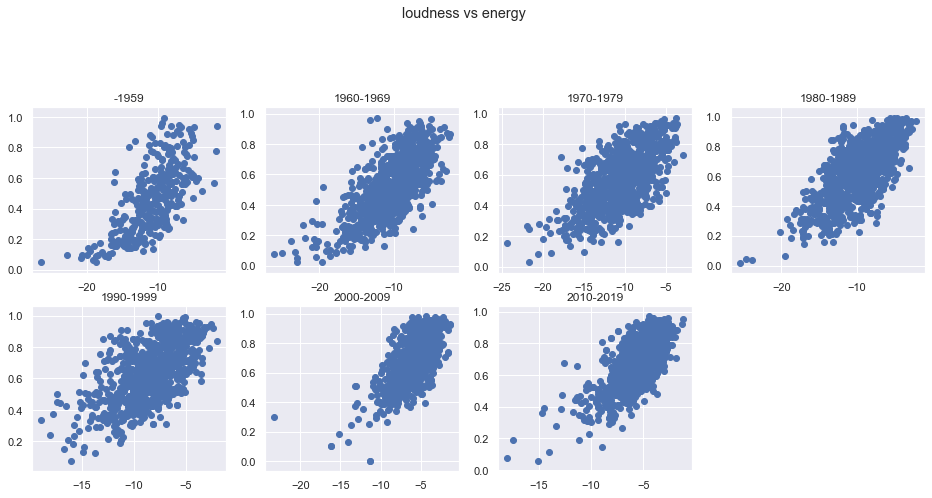

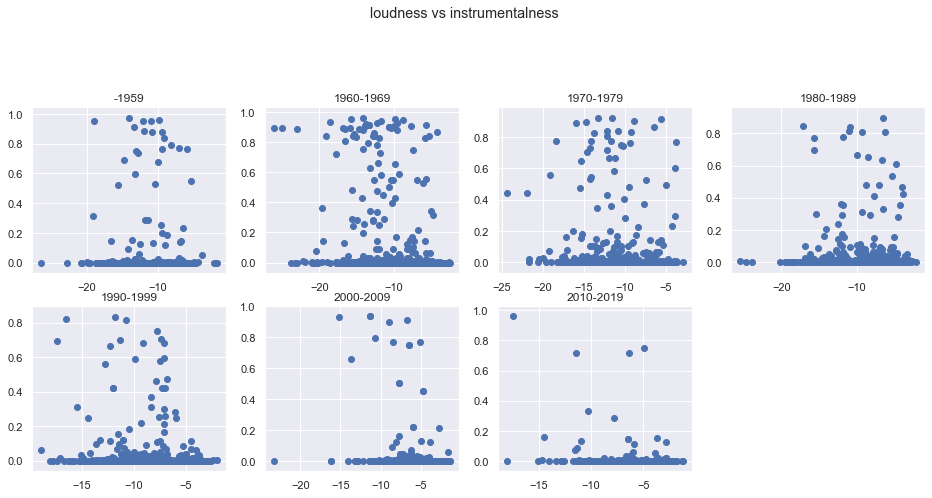

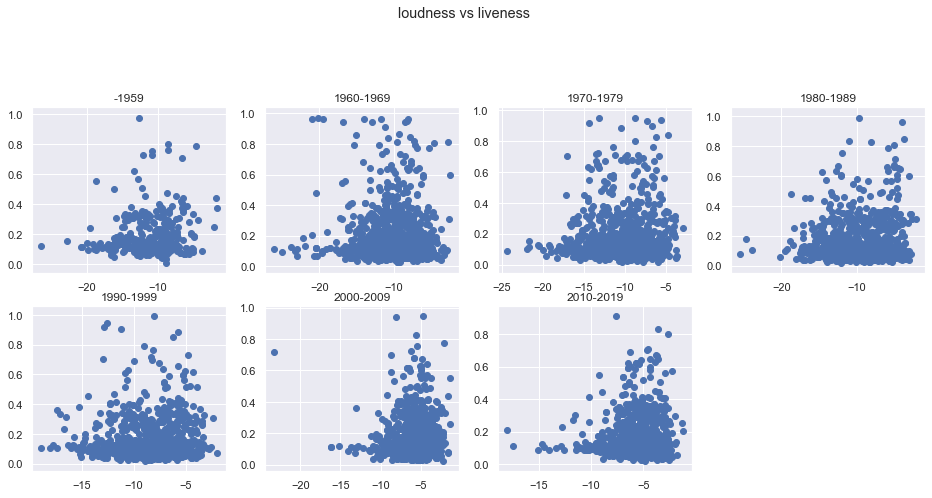

<Figure size 1152x1008 with 0 Axes>

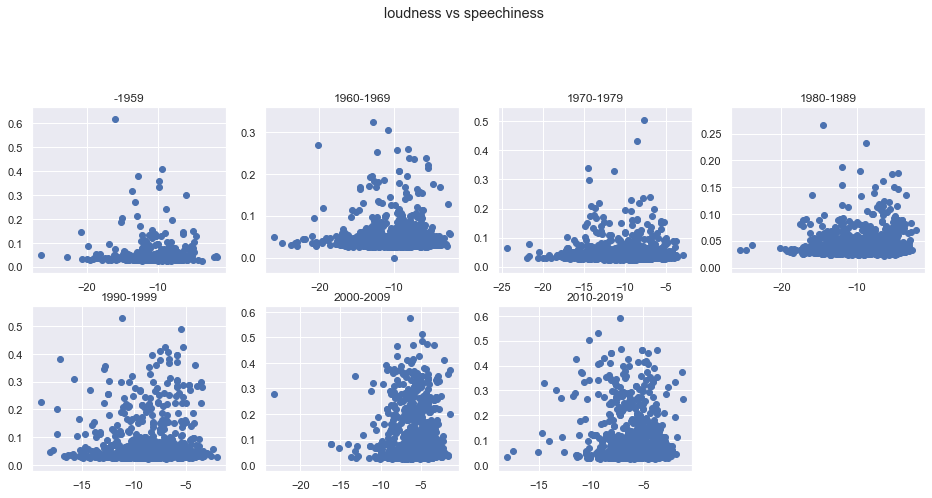

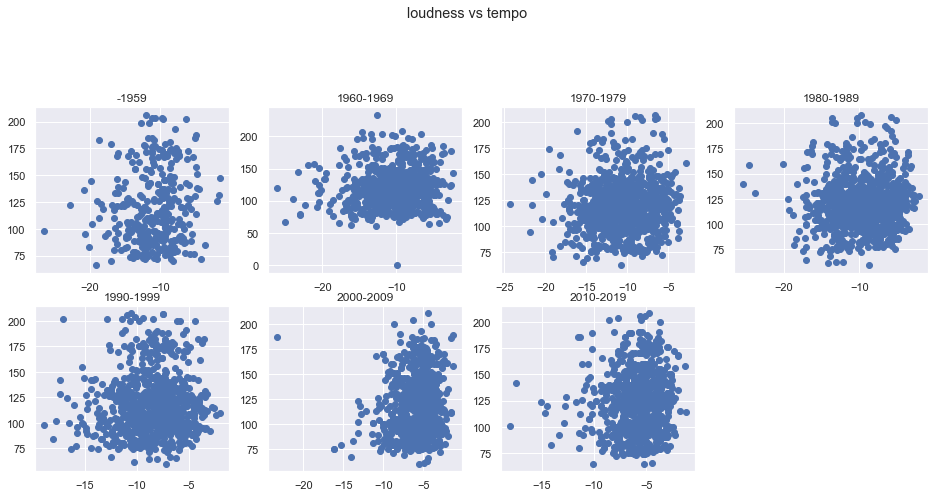

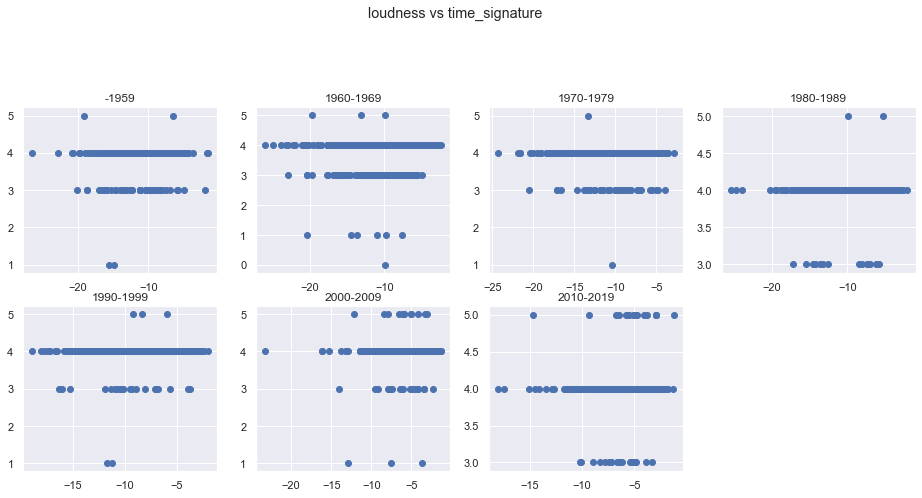

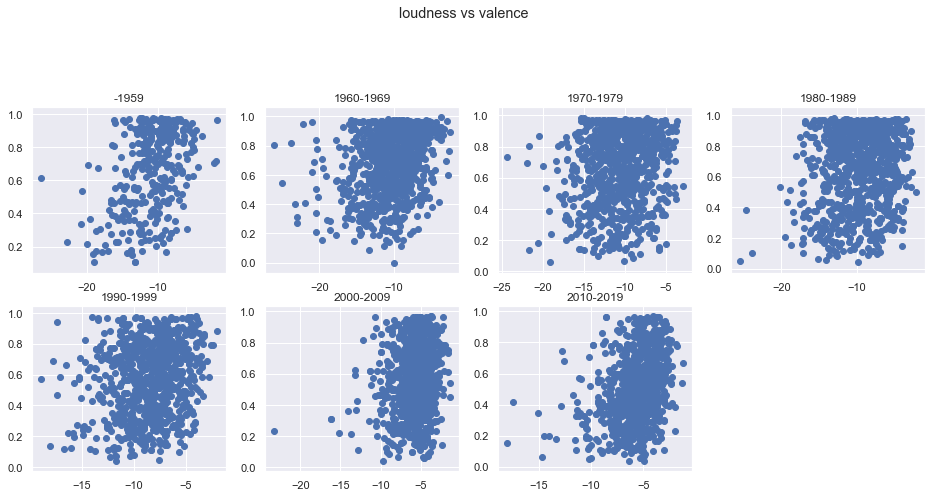

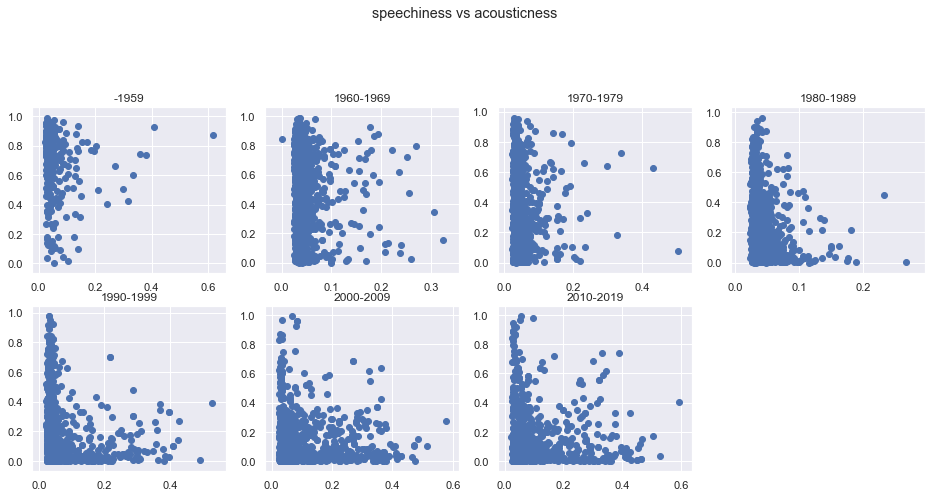

...

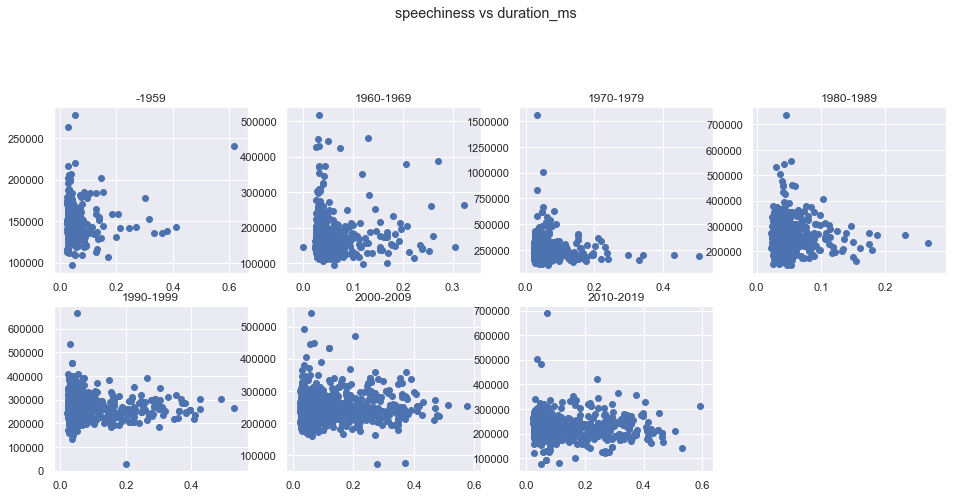

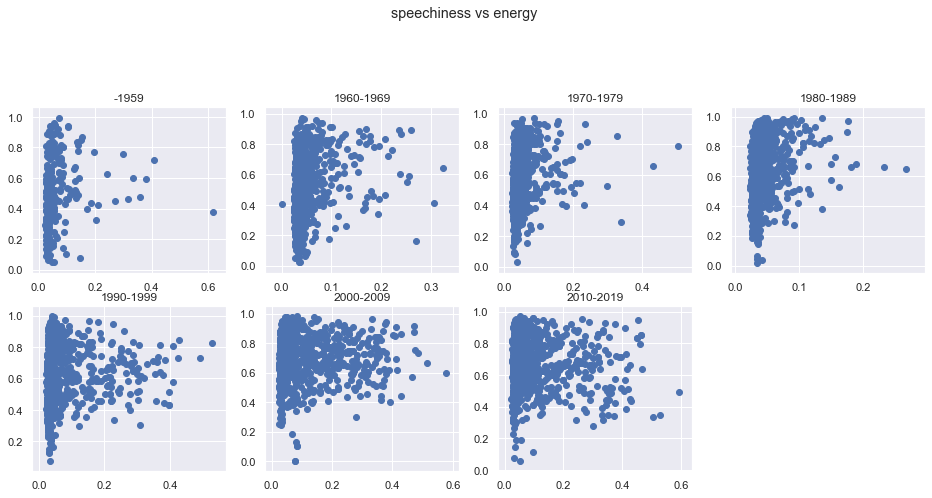

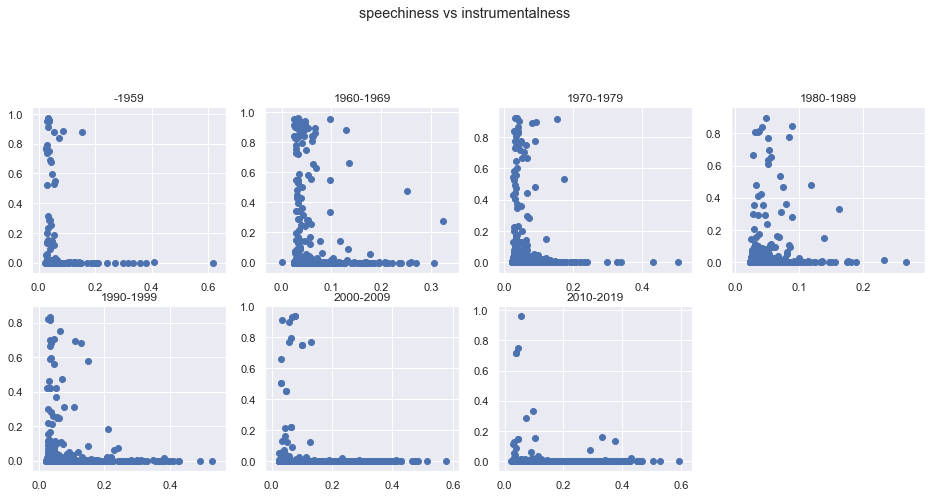

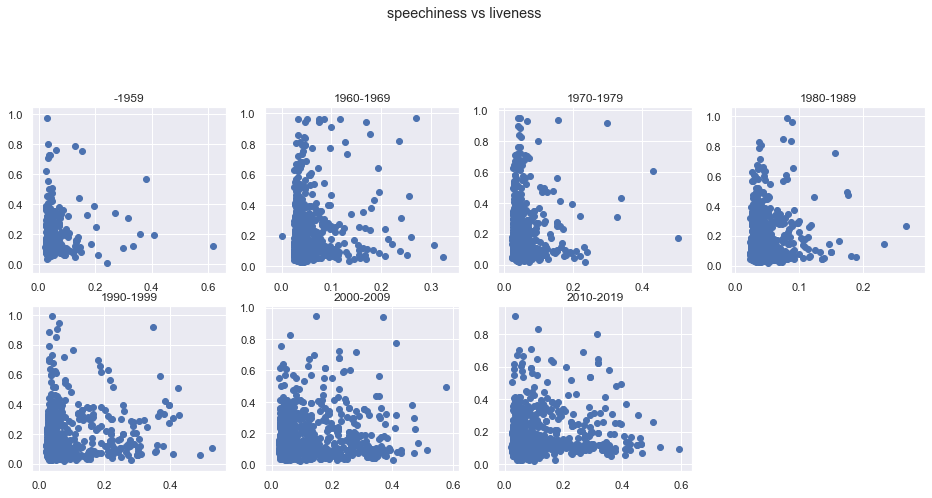

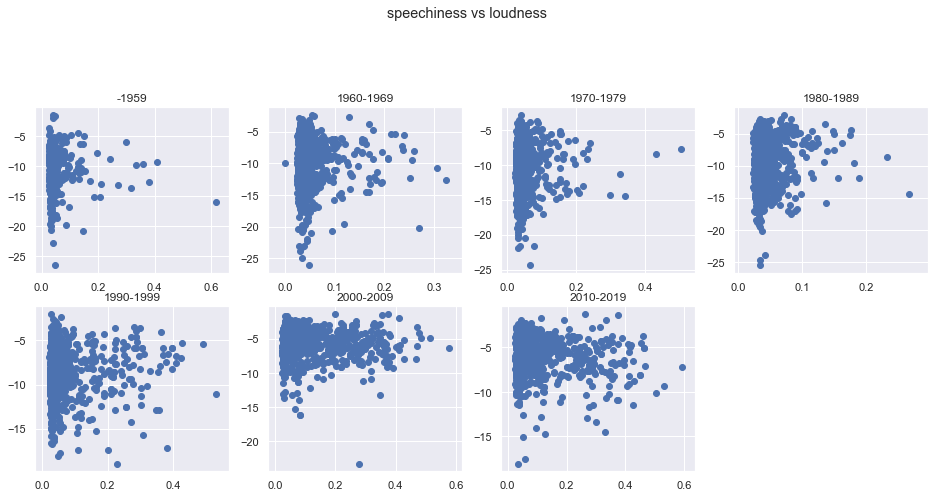

<Figure size 1152x1008 with 0 Axes>

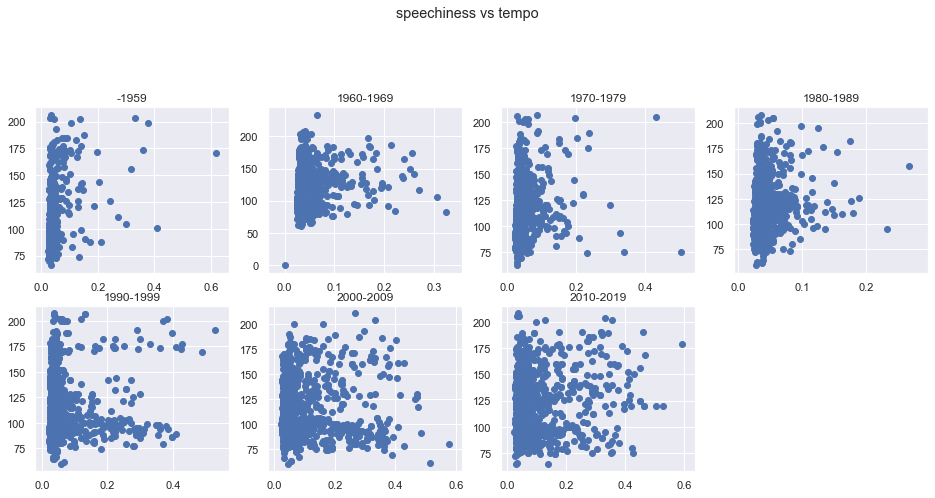

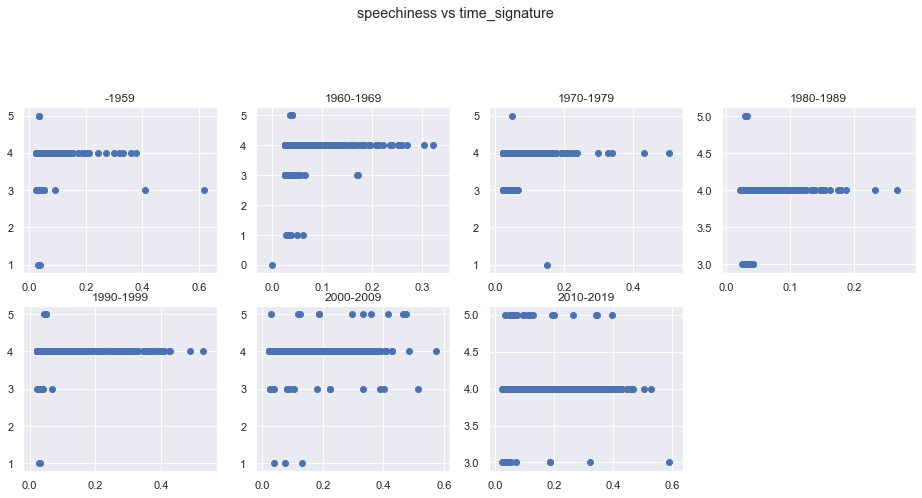

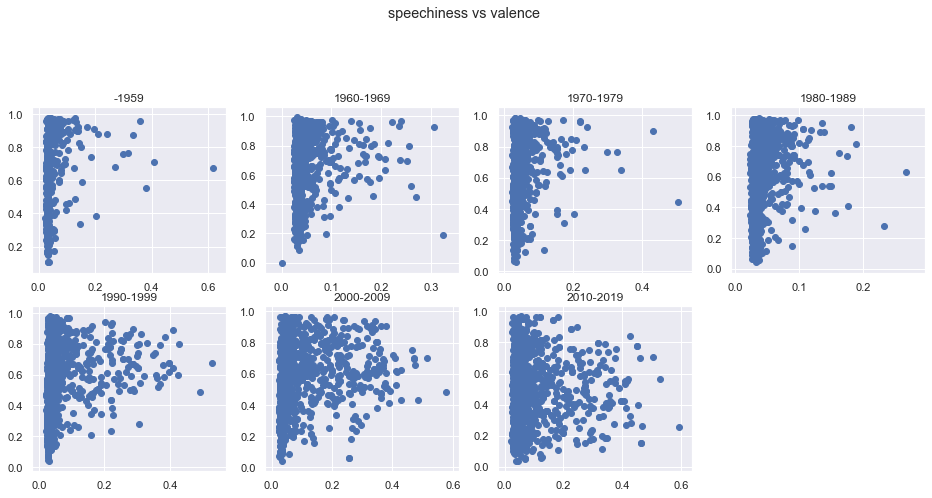

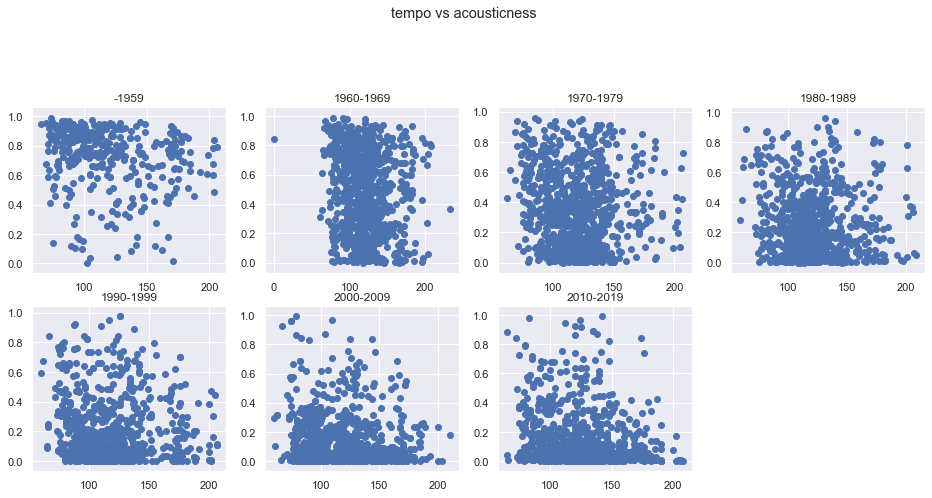

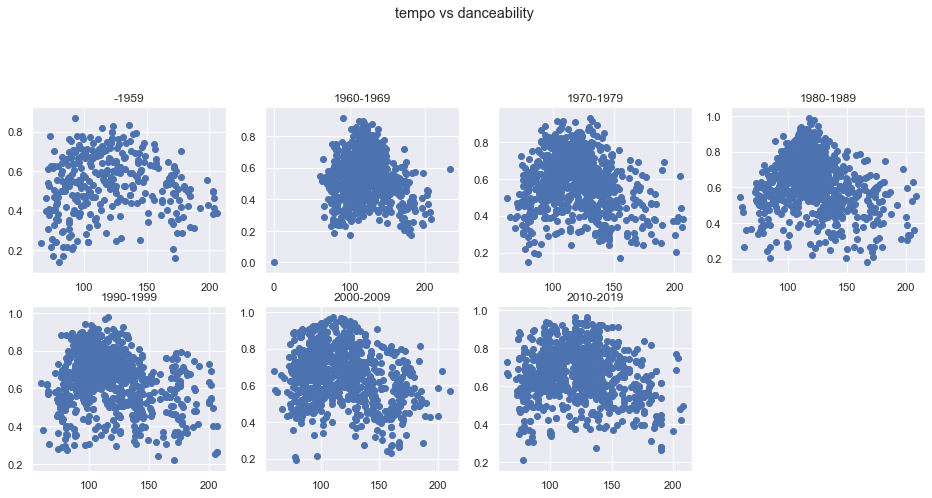

...

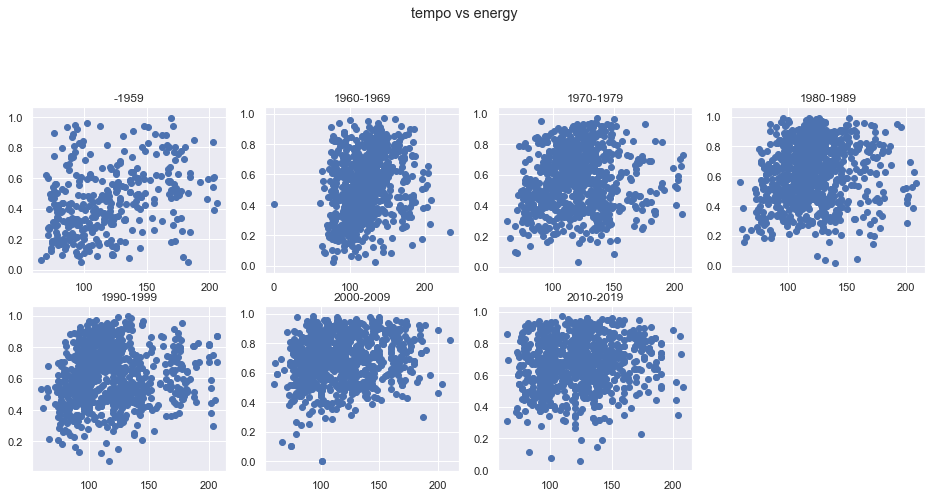

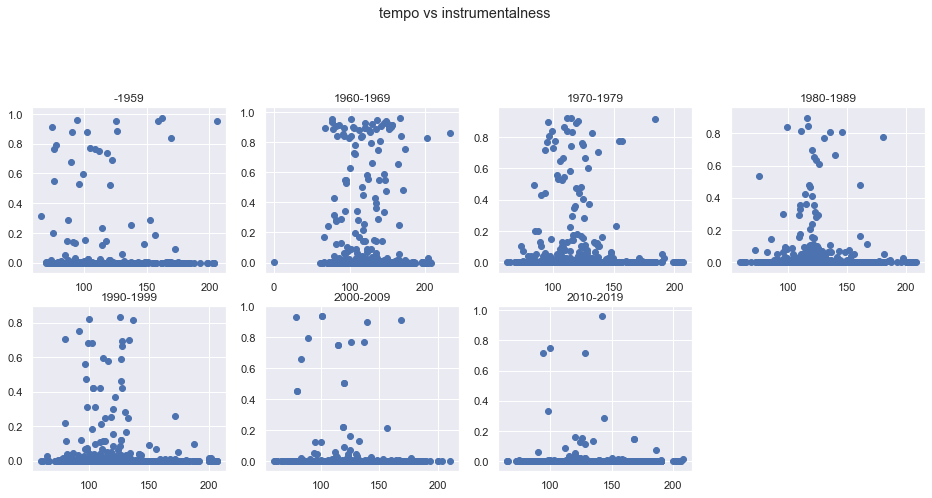

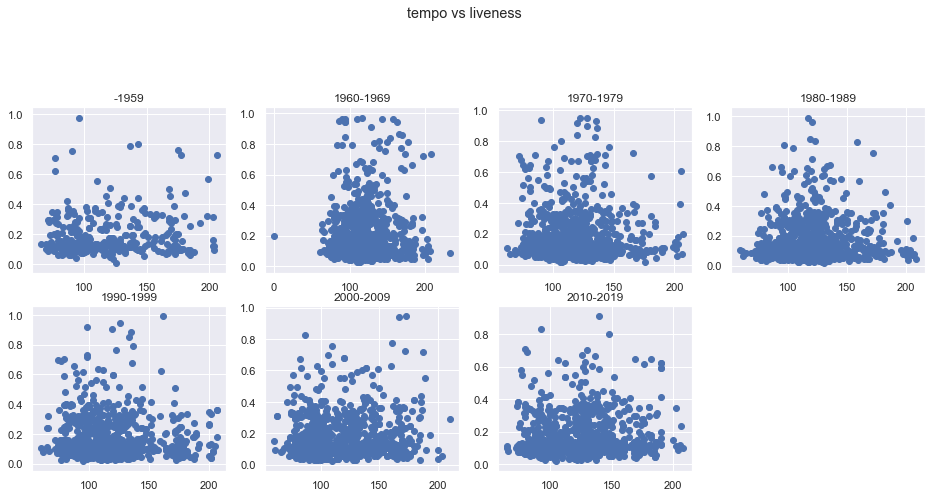

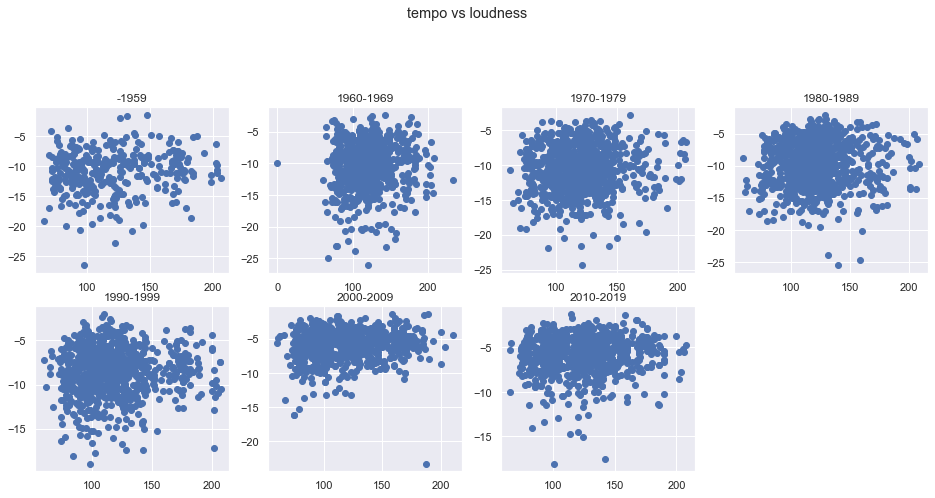

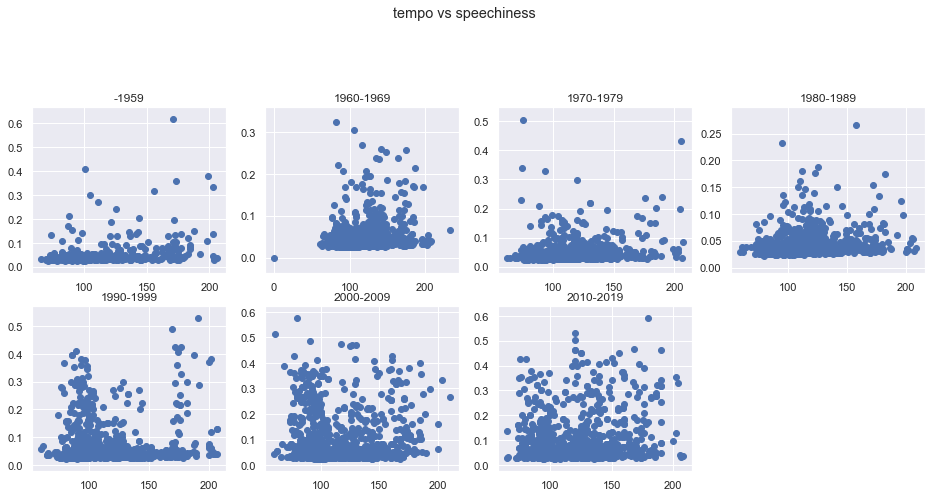

<Figure size 1152x1008 with 0 Axes>

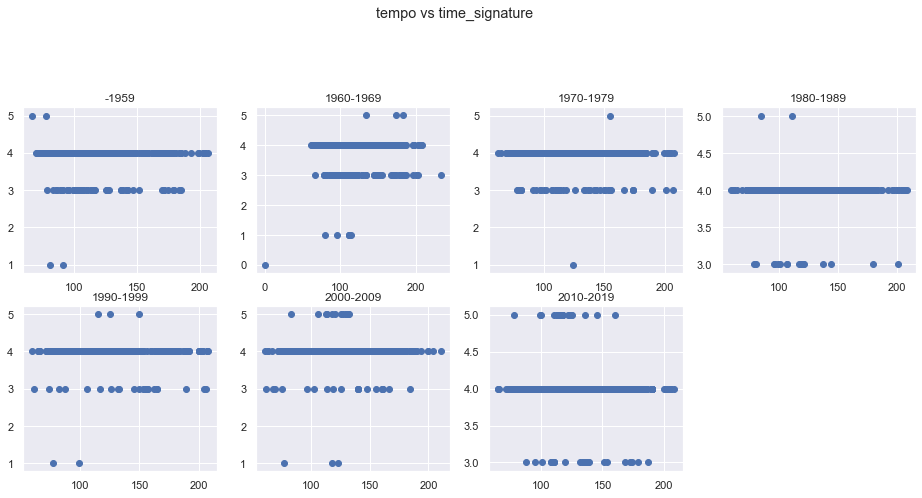

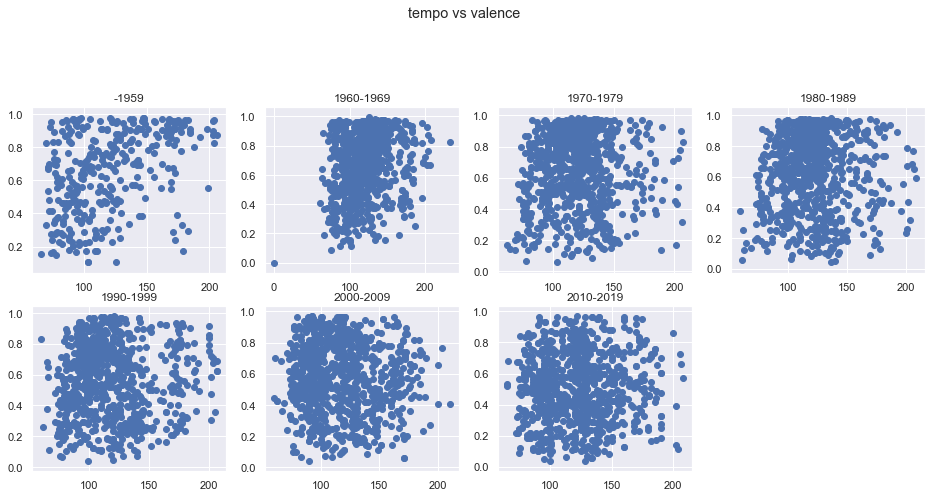

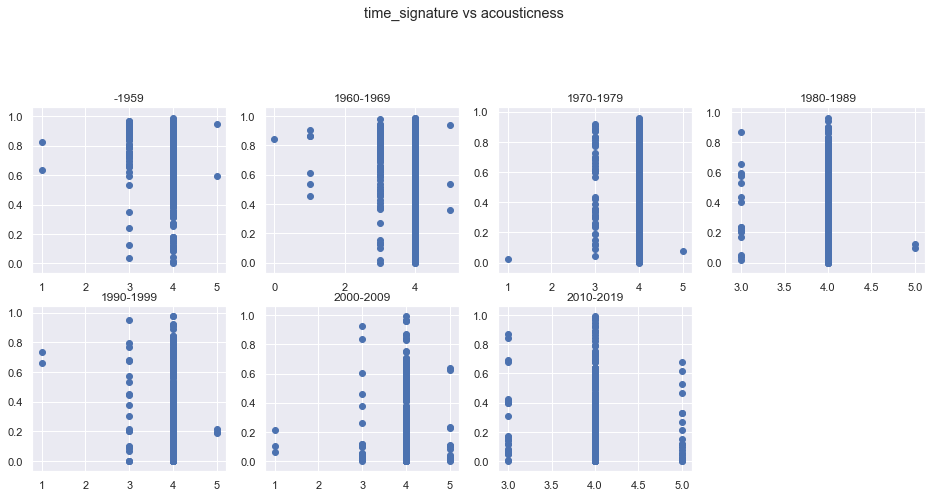

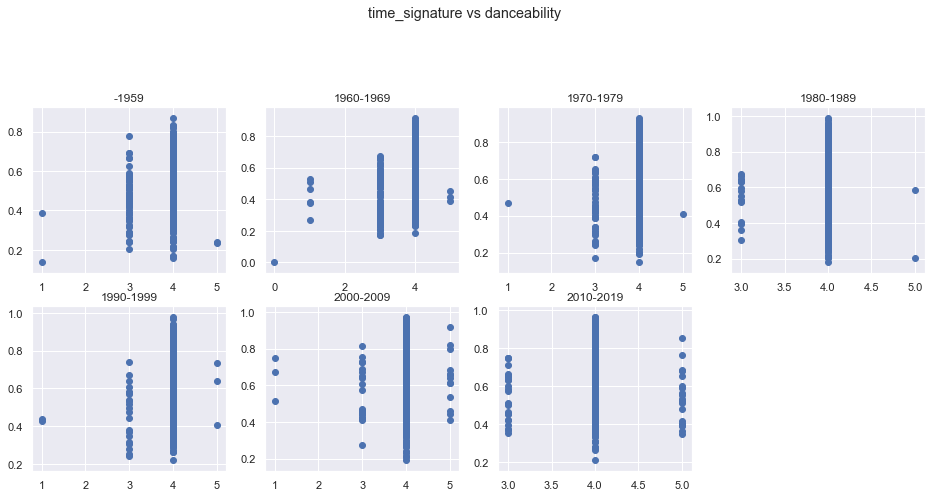

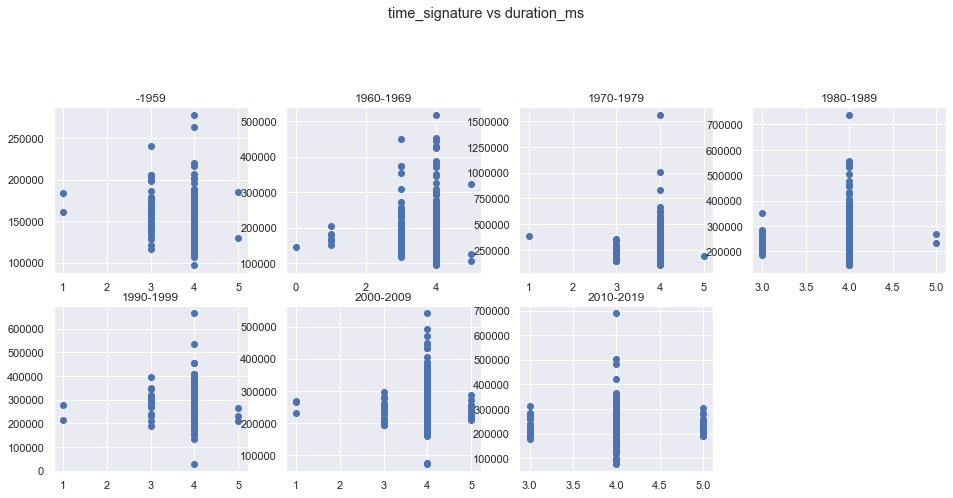

...

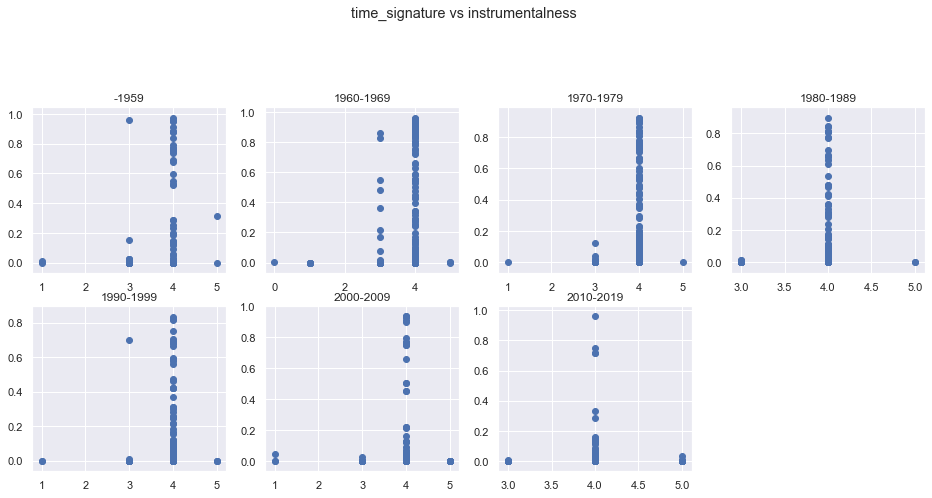

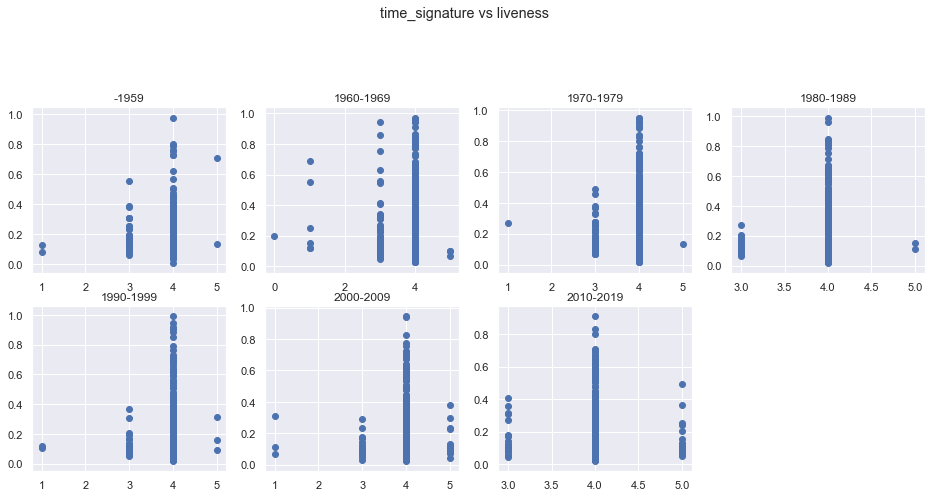

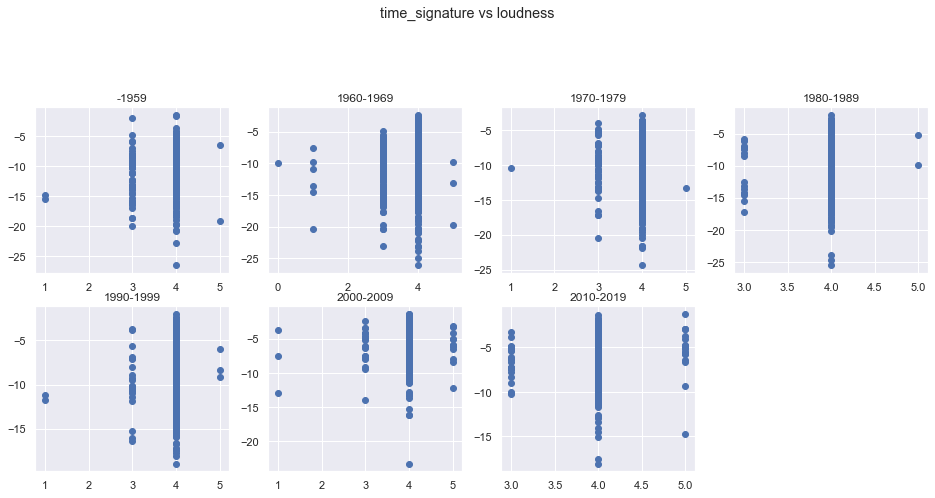

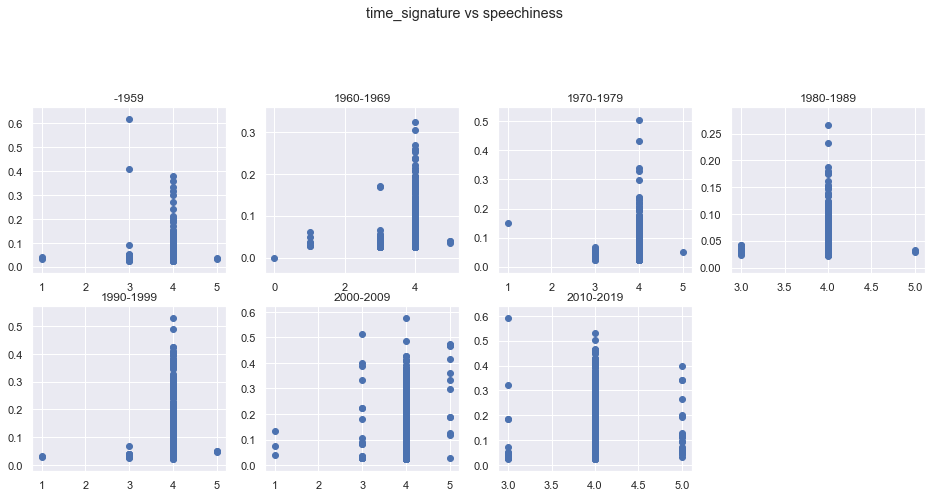

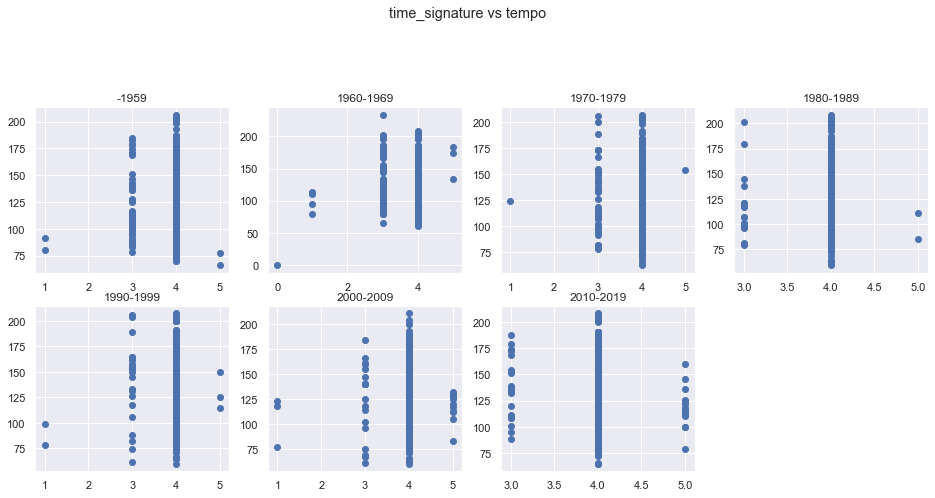

<Figure size 1152x1008 with 0 Axes>

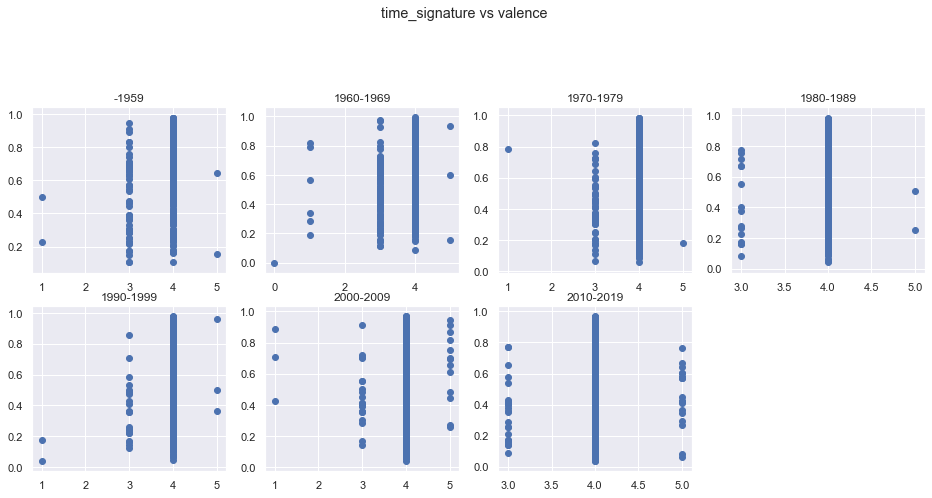

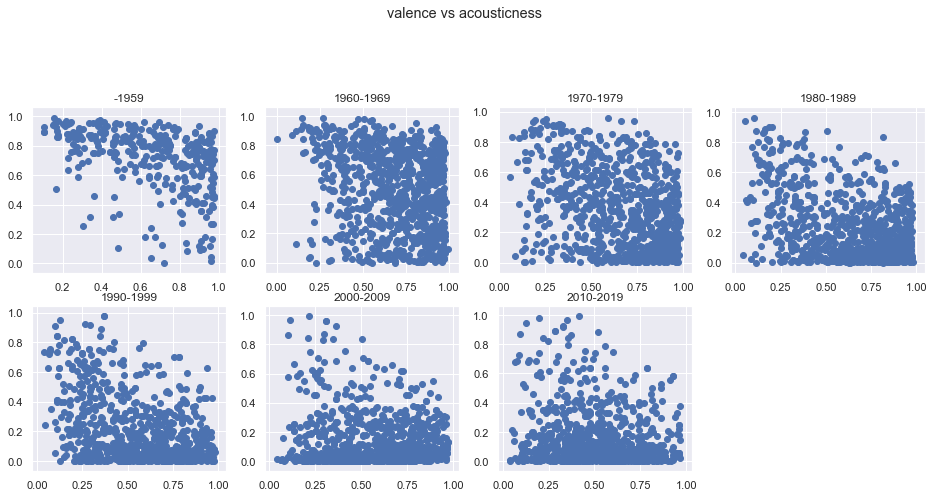

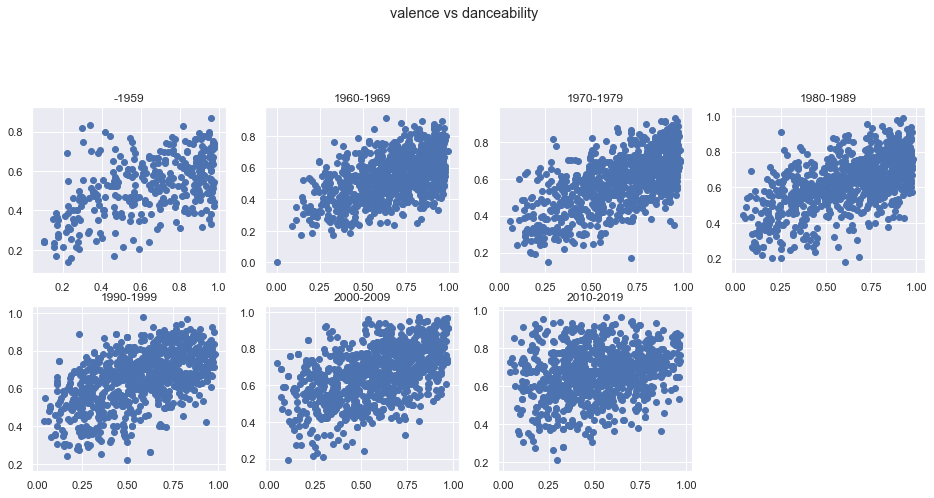

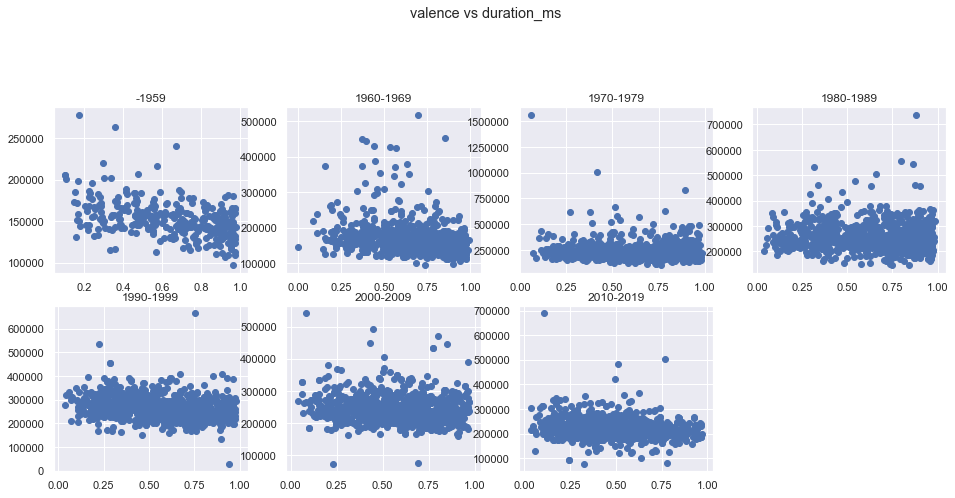

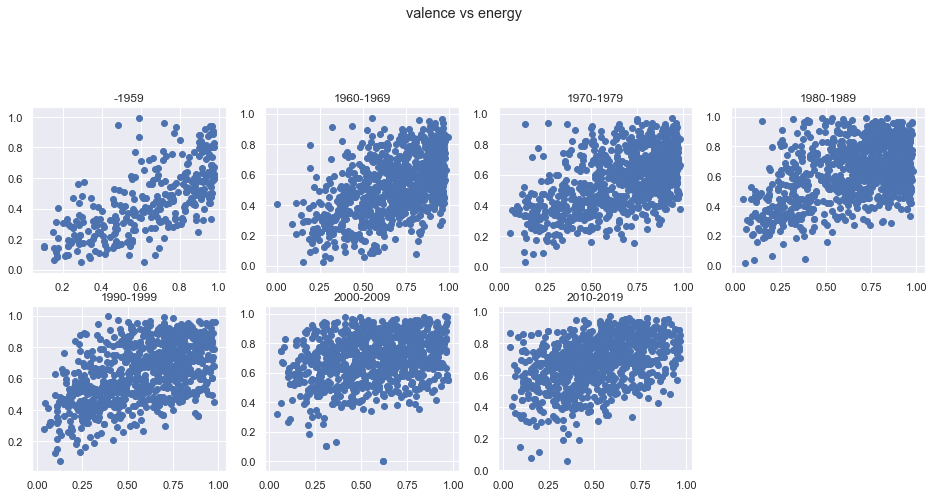

...

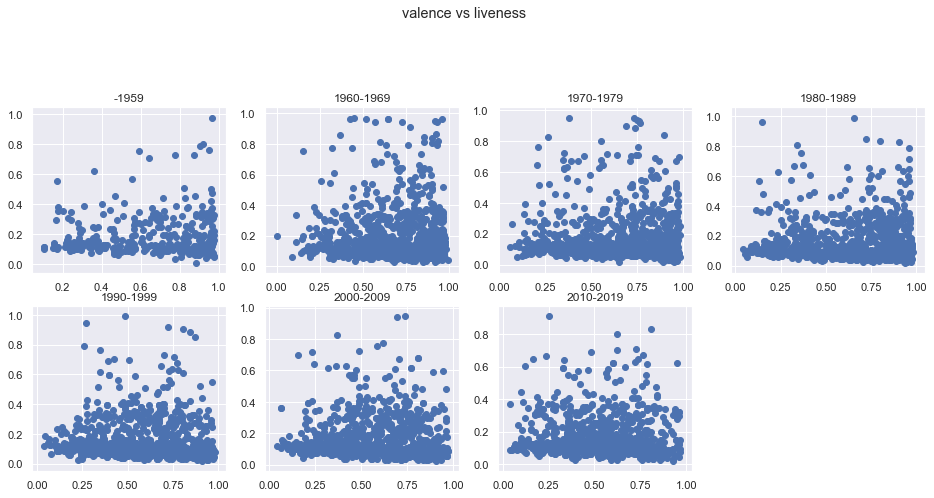

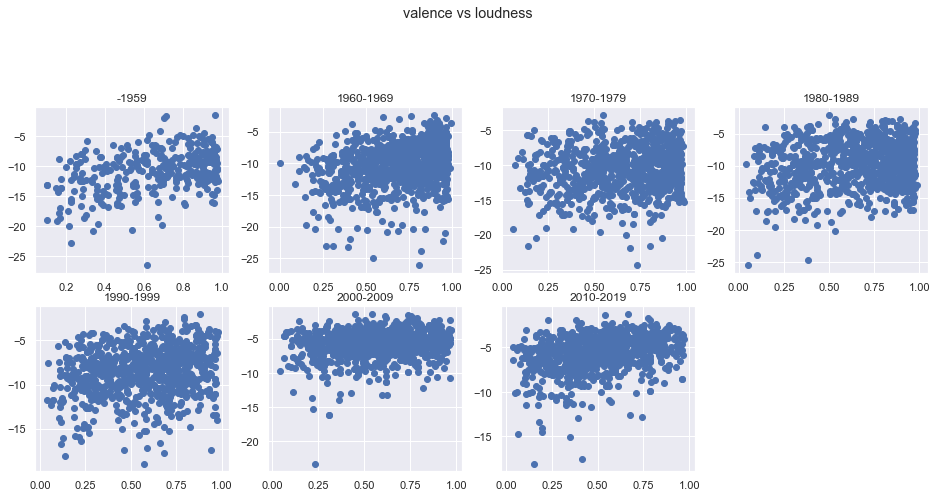

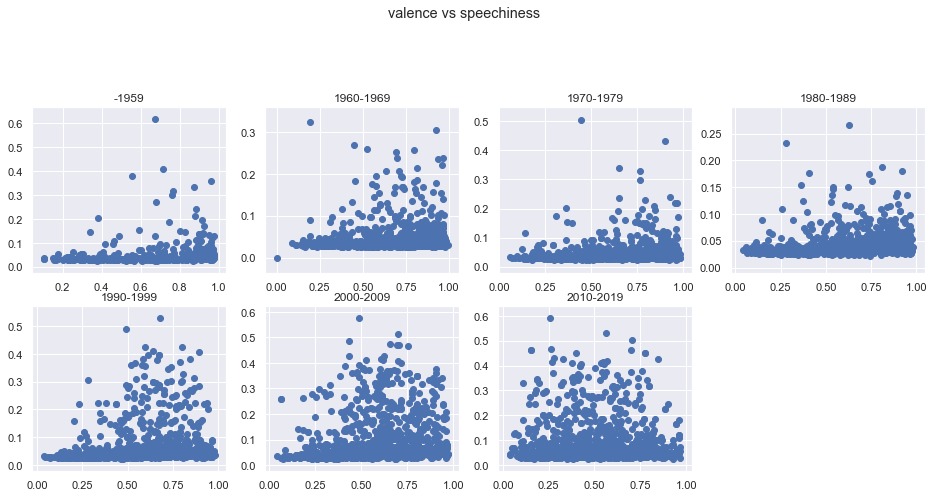

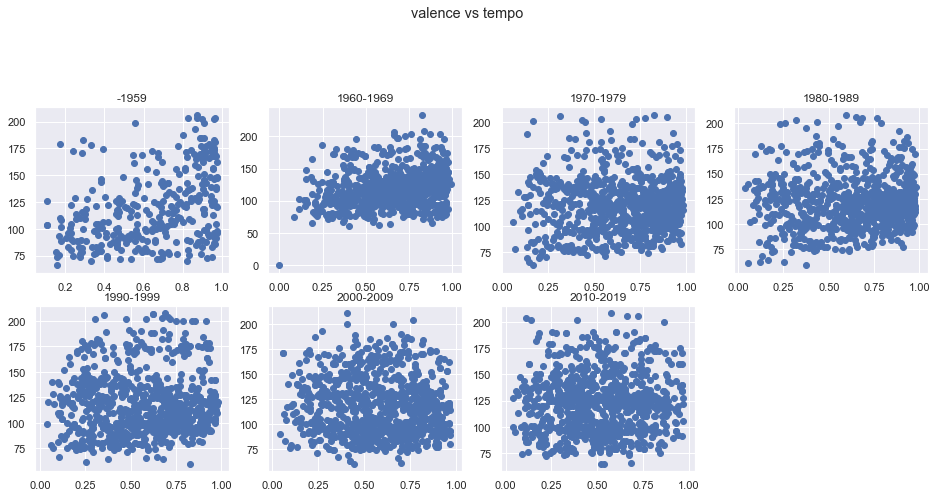

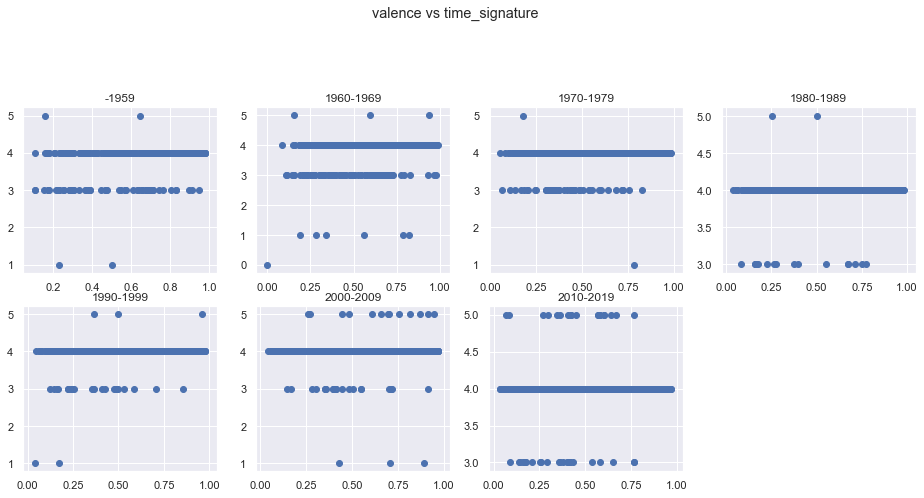

In [146]:
#scatter_plot of each columns divided by year(to see the correlation between eahch element by year)
#This takes a while to execute, be patient.
'''
for i in labels10:
    df_temp = df[df["10_years"] == i]
    sb.pairplot(df_temp[df_columns]).set(title=i)
    plt.show()
'''
'''
    c=1 #counts
    for j in labels5:
        axs.append(fig.add_subplot(4,4,c)) #2
        axs[c-1].hist(df5.get_group(j)[i], label=i, bins=20)
        axs[c-1].legend()
        axs[c-1].set_title(j)
        c=c+1
'''
        
for i in dfbp: #each coloumns
    for j in dfbp: #each columns 
        fig=plt.figure(figsize=(16,14))
        axs=[]
        c=1
        if i == j: # skip the same columns scatterplot
            pass
        else:
            for k in labels10: #differnt columns here 
                df_temp = df[df["10_years"] == k]
                axs.append(fig.add_subplot(4,4,c))
                axs[c-1].scatter(x=df_temp[i], y=df_temp[j])
                axs[c-1].set_title(k)
                c=c+1
            fig.suptitle(i+" vs "+j)
            plt.show
plt.close()

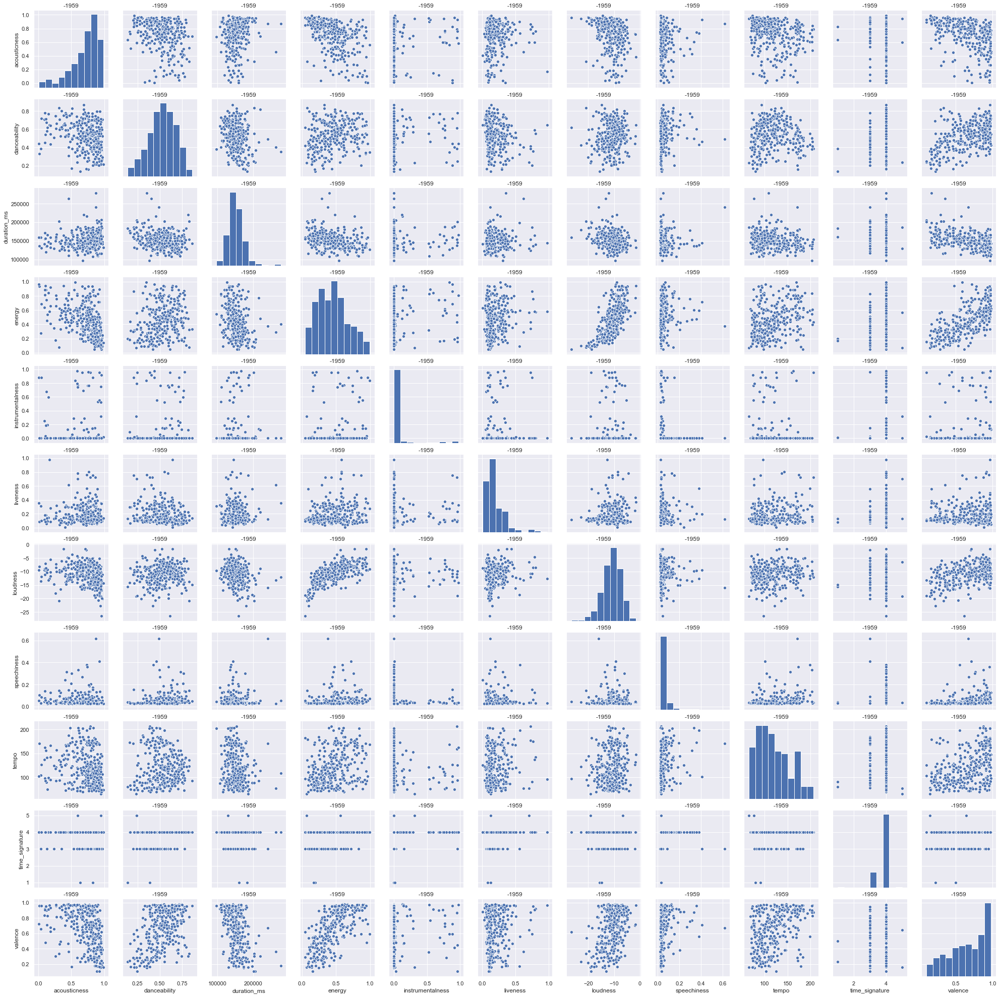

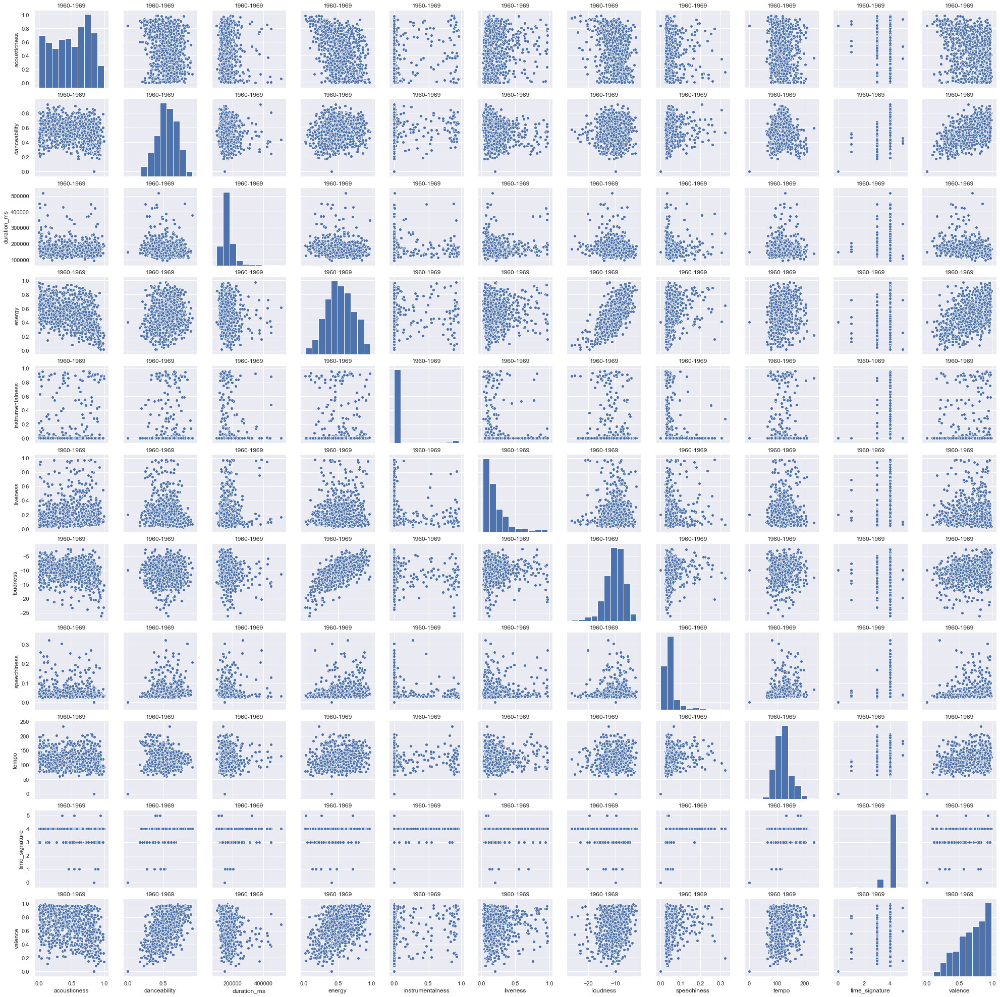

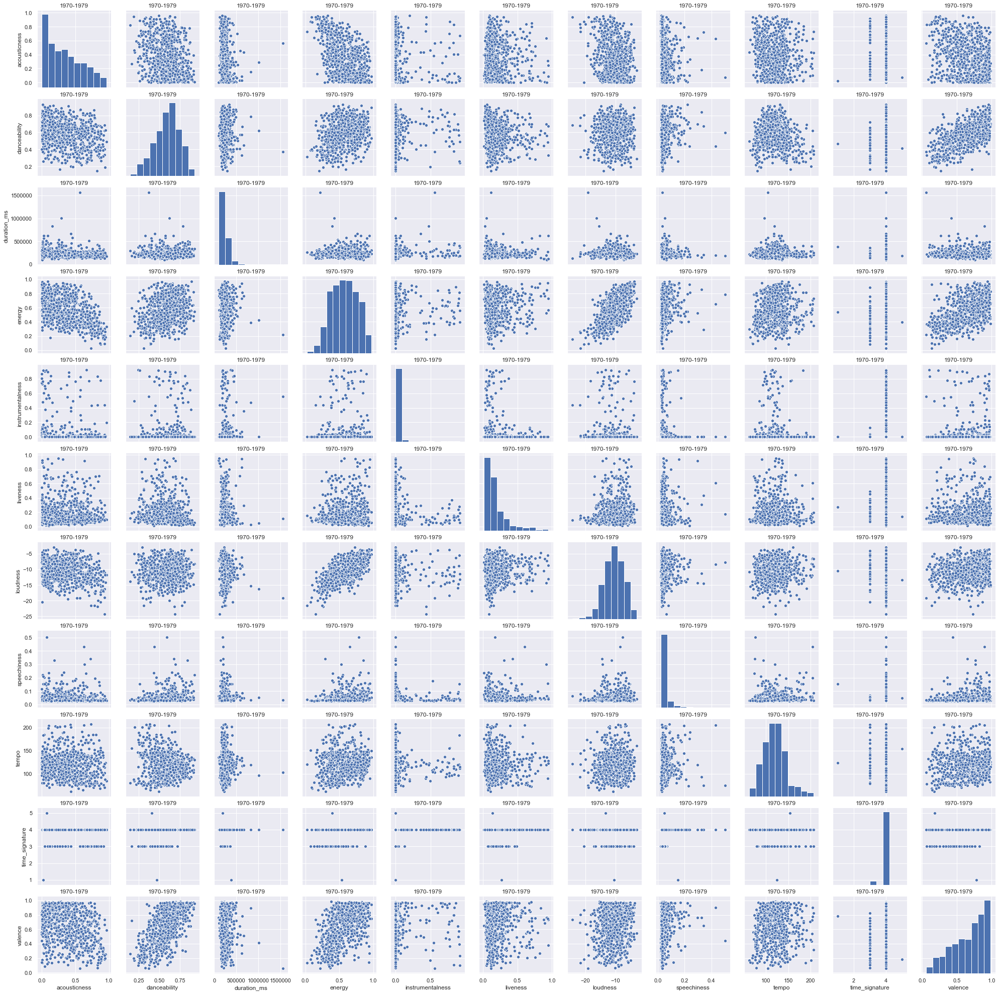

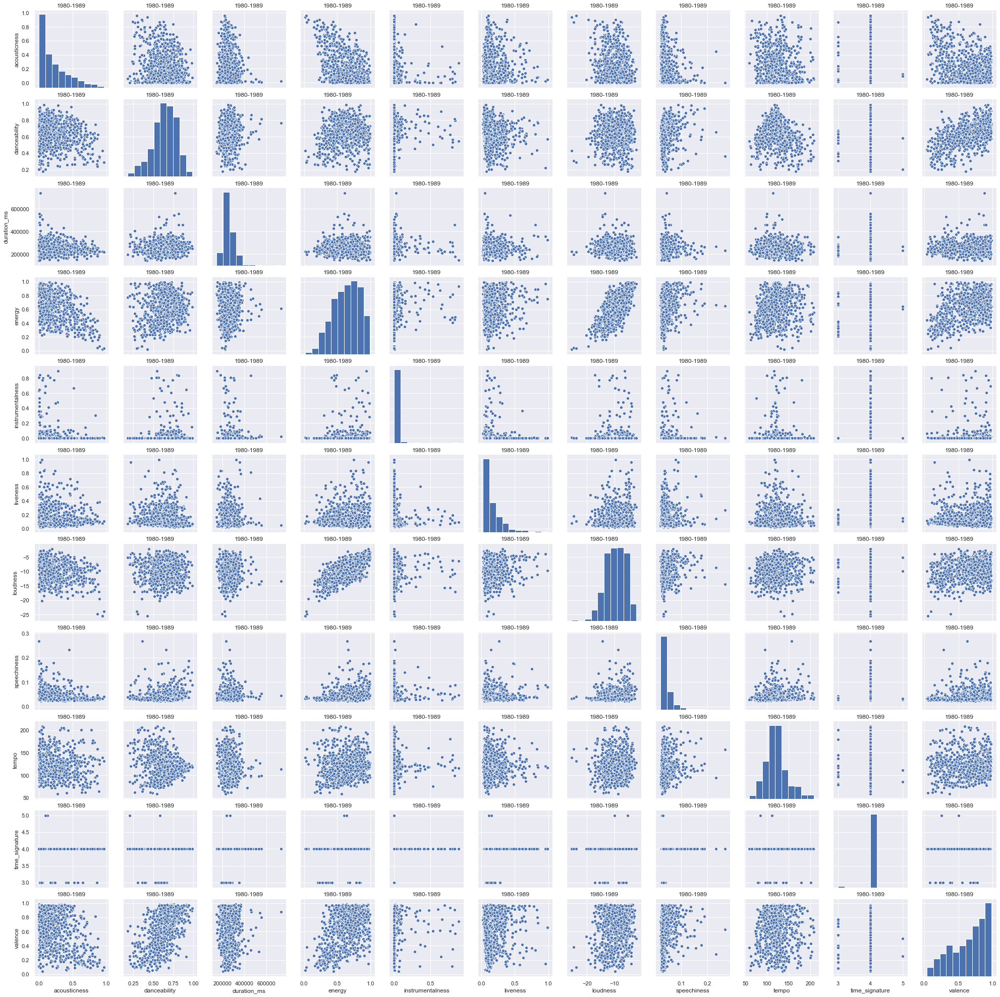

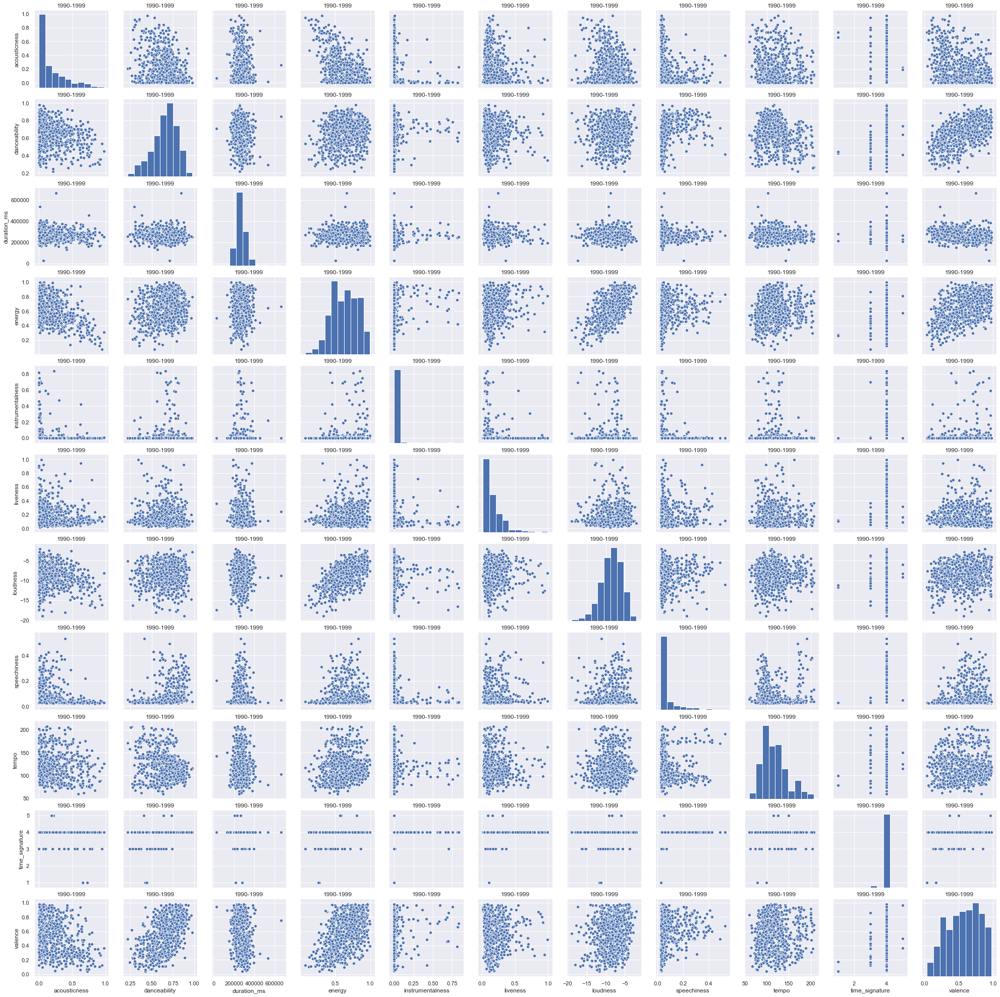

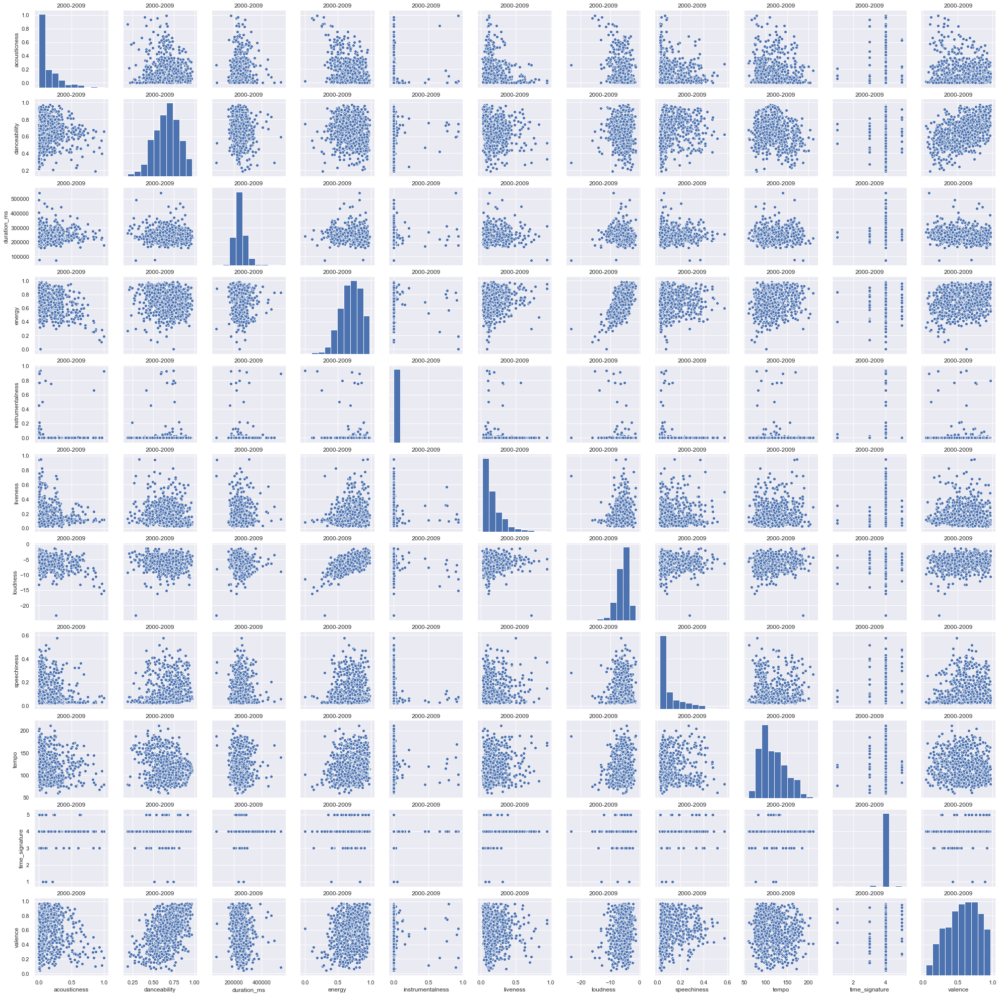

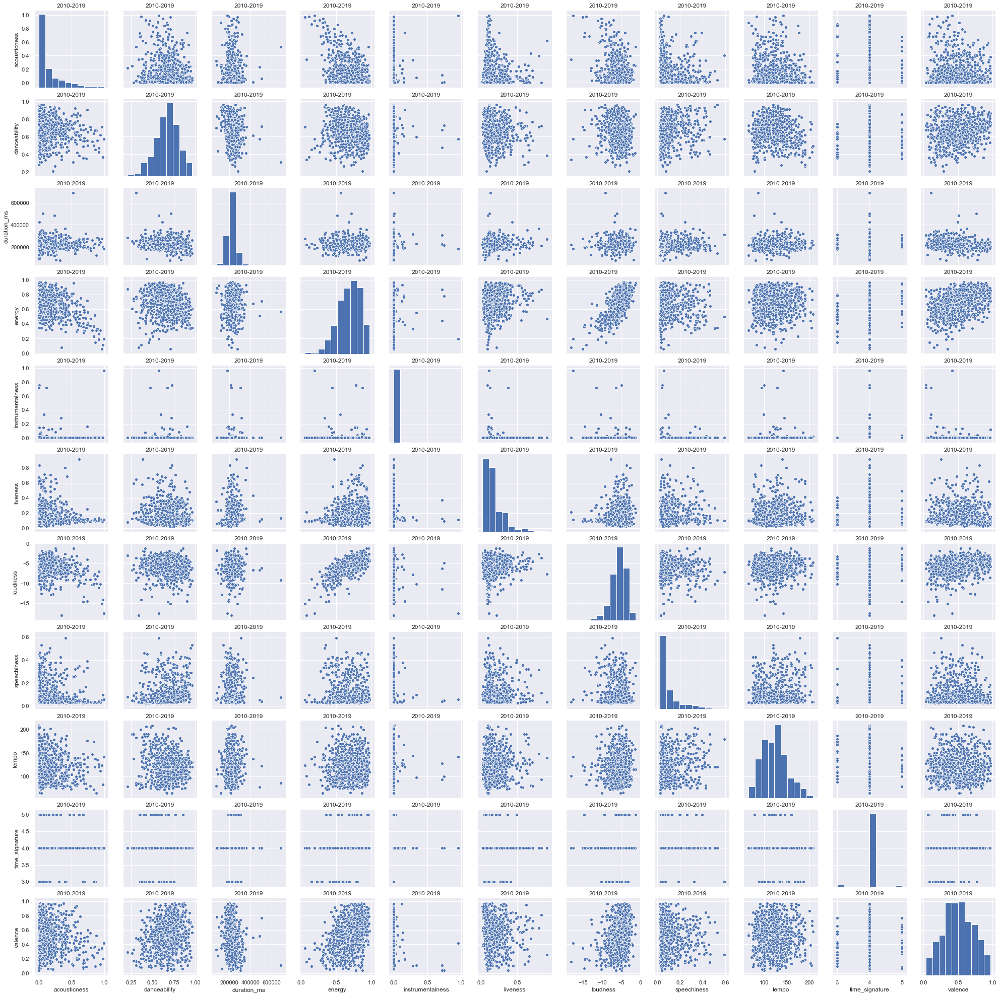

In [26]:
#scatter_plot of each columns divided by year
for i in 
for k in labels10:
    df_temp = df[df["10_years"] == i]
    sb.scatterplot(df_temp[df_columns]).set(title=i)
    plt.show()

Overall, it seems that most of the energy and loudness have the positive correlation. That is reasonable because tjhe more energy the songs become, the louder the songs would be. Also, there can be seen the some positive correlation between the valence and the danceability. This is also understandable because more positive the songs be, the more danceable the songs would be. Unfortunatelly, there are not much findings from other elements. Duration_ms seems not so relevant to other elements such as loudness, energy, danceability and so on. <br>
In total, I can see some postive correlation such as between energy and loudness, danceability, but these are something obvious because the louder the song is, the more energetic the songs would be. Also, the duration of the songs really does not relate to the songs' atmosphere(energy, danceability, valence...).  

## Analysis on "Mode"


It is usually said that the songs with major chord has positive atmosphere while minor chord has negative atmosphere. However, it really depends on each songs, so I want to check how the mode affects the atmosphere of songs.

In [192]:
#the percentage of each mode
major = df["mode"].mean() * 100
print("Major:", major, "%")
print("Minor:", 100-major, "%")


Major: 70.79724235460492 %
Minor: 29.20275764539508 %


mode
0    0.631113
1    0.600552
Name: valence, dtype: float64


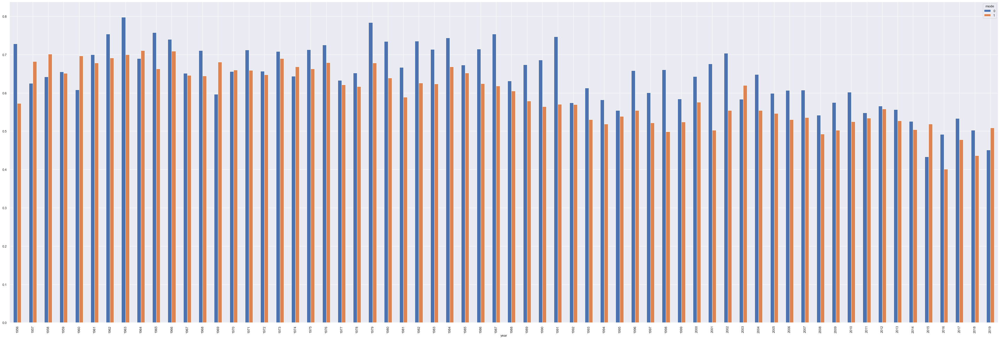

In [178]:
#valence
df_mode = df.pivot_table(index="year", columns="mode", values="valence", aggfunc=np.mean)
df_mode.plot.bar(figsize=(60,20))
print(df.groupby("mode").valence.mean())

mode
0    0.642313
1    0.601208
Name: energy, dtype: float64


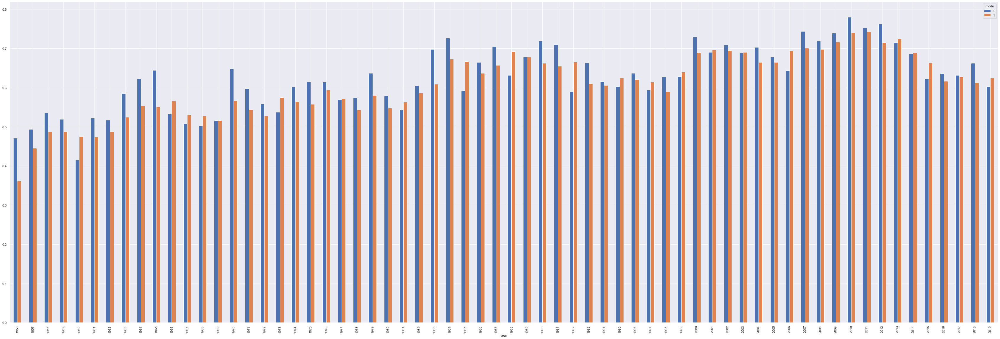

In [179]:
#energy
df_mode = df.pivot_table(index="year", columns="mode", values="energy", aggfunc=np.mean)
df_mode.plot.bar(figsize=(60,20))
print(df.groupby("mode").energy.mean())

mode
0    0.665694
1    0.603442
Name: danceability, dtype: float64


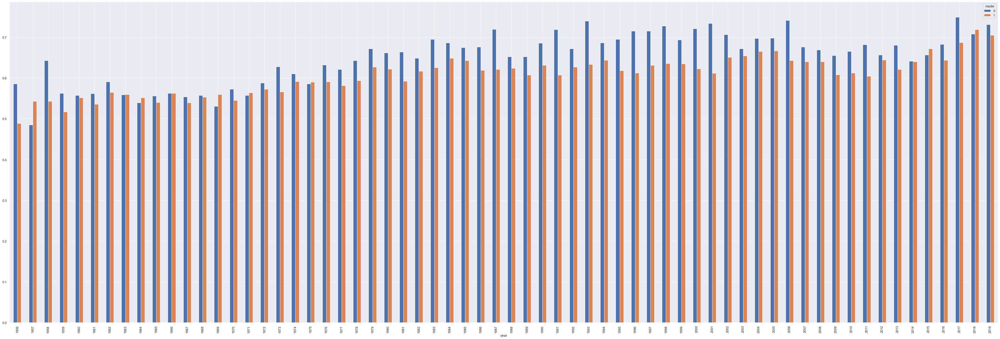

In [180]:
#danceability
df_mode = df.pivot_table(index="year", columns="mode", values="danceability", aggfunc=np.mean)
df_mode.plot.bar(figsize=(60,20))
print(df.groupby("mode").danceability.mean())

Mode(0,1) = (Minor, Major). As you can tell from those graph, in overall, minor has more positiveness compared to the major. Recently, both of major and minor have almost equal positiveness, but most of times, minor chord has more positiveness, energym, danceability in the songs. Therefore, although the most of the songs are made by major chord, minor songs are more positively oriented, and recently, there is not much difference about how the songs' atmospherec changed betewen major and minor.